In [1]:
%pylab inline

%config InlineBackend.figure_format = 'retina'

Populating the interactive namespace from numpy and matplotlib


# Classifying ER vs BA or SBM

In [2]:
import GraphConvNet as gcn

import pickle as pk
import os


Using TensorFlow backend.


In [3]:
from keras.utils import to_categorical

# Modular GCN

In [4]:
import networkx as nx

def make_BA_dataset(N,n,m=2):
    adj = np.empty((N,n,n), dtype=np.float32)
    for j in range(N):
        g = nx.barabasi_albert_graph(n=n,m=m)
        a = zeros((n,n), dtype=np.float32)
        for i in g.edges:
            a[i] = 1
            a[i[::-1]] = 1
        adj[j] = a
    return adj

def make_ER_dataset(N,n,p=0.1):
    adj = np.empty((N,n,n), dtype=np.float32)
    for j in range(N):
        g = nx.erdos_renyi_graph(n=n, p=p)
        a = zeros((n,n), dtype=np.float32)
        for i in g.edges:
            a[i] = 1
            a[i[::-1]] = 1
        adj[j] = a
    return adj
    
        
def mat_pow_batch(A,n):
    """batch matrix power"""
    if n ==0:
        return np.float32([np.eye(A.shape[1])])
    M = A
    for _ in range(n-1):
        M = tf.matmul(A, M)
    return M.eval()
            

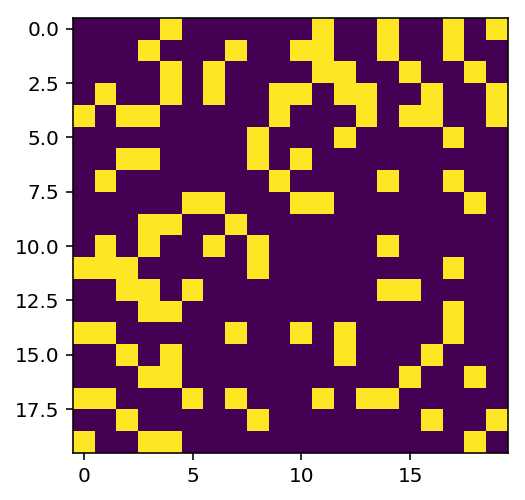

In [5]:
# X = make_BA_dataset(1000, 20)
X = make_ER_dataset(10, 20, p = .2)
imshow(X[0])

# Make large, mixed dataset
make a dataset of BA and ER mixed, with different densities

In [6]:
class Graph_dataset():
    def __init__(self,n_nodes = 20, num_samples = int(2e3), num_graph_densities = 1, max_moment_order = 3,
                 min_BA_density = 1, min_ER_density = 'auto' , max_BA_density = 0.5, max_ER_density = 0.5 ):
        
        self.label_classes = ['BA', 'ER']
        if min_ER_density == 'auto':
            min_ER_density = 1./n_nodes
        
        self._num_in_group = num_samples//(2*num_graph_densities)
        
        self.graph_params = {'BA' : int0(linspace(1, n_nodes* max_BA_density, num_graph_densities)),
                  'ER' : linspace(min_ER_density, max_ER_density, num_graph_densities)}

        self.Adj = {'BA' : concatenate([make_BA_dataset(self._num_in_group, n_nodes, m) for m in self.graph_params['BA']], axis = 0),
                   'ER' : concatenate([make_ER_dataset(self._num_in_group, n_nodes, p) for p in self.graph_params['ER']], axis = 0)}

        self.Adj_all = concatenate((self.Adj['BA'], self.Adj['ER']), axis = 0)
        self.get_label_parameter()
        self.get_graph_moments(n=max_moment_order)
        self.h = np.ones_like(self.moments[1])

    def get_label_parameter(self):
        self.full_labels = []
        for i,k in enumerate(self.label_classes):
            for p in self.graph_params[k]:
                self.full_labels += [[i,p]]*self._num_in_group

    def get_rand_indices(self,):
        self.rand_indices = np.argsort(np.random.rand(len(self.Adj_all)))

    def get_graph_moments(self, n= 3):
        self.moments = {1:self.Adj_all.sum(-1, keepdims=1)}
        for i in range(2,n+1):
            A = gcn.mat_pow_batch(self.Adj_all,i)
            self.moments[i] = A.sum(-1, keepdims=1) 
    
def shuffle_node_order(X):
    Adj_nodes_shuffled = np.empty_like(X)
    for i,a in enumerate(X):
        # get random order
        r = argsort(rand(len(a)))
        Adj_nodes_shuffled[i] = a[r][:,r]
    return Adj_nodes_shuffled

## Configuration model by shuffling outgoing stubs
If we just take the outgoing stubs (-1 in incidence), we are not changing the number of outgoing stubs, but reassigning them to other links. 
Can this ever cause more links? 

In [7]:
def get_incidence(a):
    """make incidence matrix from adjacency matrix"""
    ix = np.where(np.triu(a))
    edg = array(list(zip(*ix)))
    incid = np.zeros((len(a), len(edg)), dtype=np.float32)
    for _,[i,j] in enumerate(edg): 
        incid[i,_] = 1
        incid[j,_] = -1
    return incid

def incidence_shuffle(incid):
    neg = np.where(incid < 0)
    # preserve the rows, to preserve node degree, but shuffle columns, to shuffle links
    np.random.shuffle(neg[1])
    incid2 = 1.* (incid> 0 )
    incid2[neg] -= 1
    return incid2

def configuration_model_1(a, weighted = True):
    incid = get_incidence(a)
    incid2 = incidence_shuffle(incid)
    lap = incid2.dot(incid2.T)
    deg = lap.diagonal() 
    a2 = np.diag(deg)-lap
    if not weighted:
        a2 = (1*(a2>0))
    return a2

# def make_data_config_model(X, weighted = True, shuffle_networks = False, shuffle_nodes = False):
#     print(('Not s' if not shuffle else 'S')+'huffling order')
#     dat = np.array([configuration_model_1(a, weighted) for a in X])
#     dat = np.concatenate((X,dat))
#     print('labels: {0:"real", 1:"fake"}')
#     labels = np.zeros((2*len(X,)), dtype = np.float32)
#     labels[len(X):] = 1
#     if shuffle_networks:
#         idx = np.argsort(np.random.rand(2*len(X)))
#         dat = dat[idx]
#         labels = labels[idx]
#     if shuffle_nodes:
#         dat = shuffle_node_order(dat)
#     return dat, labels
    
def trim_mat(a,b):
    """remove random links from 'a' until it has the same number of links as 'b'"""
    i = (a.sum(0)!= b.sum(0))
    ms = i[:,np.newaxis]*i[np.newaxis]
    masked_a = a*np.triu(ms)
    ix = np.where(masked_a)
    # num missing links
    d = int(a.sum()-b.sum())//2
    # randomly choose r indices to knockout
    r = np.argsort(np.random.rand(len(ix[0])))[:d]
    # make trimmed graph
    c = triu(a) + 0.
    for i in r:
        c[ix[0][i],ix[1][i]]=0
    c += c.T 
    return c
    
def make_data_config_model(X, weighted = True, shuffle_networks = False, shuffle_nodes = False, trim_links = False):
    """ Create a Configuration Model ensemble from adjacency matrices in X (samples, N,N)
    returns concatenate([X,config model of X]) , labels ([0 for X and 1 for Config model])
    weighted: whether links in configuration model are allowed to be weighted 
        (leads to less discrepancy with X in total link weight)
    shuffle_networks: whether output order should be shuffled (default False)
        if False, the first half of the output are the original 
    shuffle_nodes: whether to shuffle node order (default False)
    trim_links: whether to randomly remove links in X so that is has 
        the same number of links the Config. Model X. 
    """
    print(('Not s' if not shuffle else 'S')+'huffling order')
    config = np.array([configuration_model_1(a, weighted) for a in X])
    if trim_links:
        print('trimming links')
        trimmed_X = np.array([trim_mat(a,b) for a,b in zip(X,config)])
        dat = np.concatenate((trimmed_X, config))
    else:
        dat = np.concatenate((X,config))
    print('labels: {0:"real", 1:"fake"}')
    labels = np.zeros((2*len(X,)), dtype = np.float32)
    labels[len(X):] = 1
    if shuffle_networks:
        idx = np.argsort(np.random.rand(2*len(X)))
        dat = dat[idx]
        labels = labels[idx]
    if shuffle_nodes:
        dat = shuffle_node_order(dat)
    return dat, labels

In [395]:
n_list =  [10 ,15, 20, 30, 40,50, 60]
n = n_list[-3] 
data = Graph_dataset(n_nodes=n, num_samples= int(5e3), num_graph_densities=5)
data.get_rand_indices()

data.Adj_all.shape

(5000, 40, 40)

In [415]:
data.graph_params

{'BA': array([ 1,  5, 10, 15, 20]),
 'ER': array([0.025  , 0.14375, 0.2625 , 0.38125, 0.5    ])}

# BA vs ER

In [249]:
data.label_classes

['BA', 'ER']

In [101]:
GRAPH_TYPE = 'BA_vs_ER'
EXP_DIR = '../experiments/gcn_classification_grid_2_no_flatten/'
os.makedirs(EXP_DIR, exist_ok=True)

RUN_FILE = './run_gcn_classification_v2.py'
TRIMMED = False



labels = to_categorical(array(data.full_labels)[:,0]) # first column is BA,ER, second col is parameter m or p 

dataset = {
    'Adj':data.Adj_all, 
    'labels':labels,
    'rand_indices':data.rand_indices 
}

dataset_path = EXP_DIR+'%s-N%d_config_dataset-%d'\
        %(GRAPH_TYPE,data.Adj_all.shape[1] ,len(data.Adj_all)) + ('-trimmed' if TRIMMED else'')+'.pkl'
print(dataset_path)
pk.dump(dataset,open(dataset_path,'wb'))


# SAVE_PATH = '../experiments/gcn_classification_grid/%s/' % GRAPH_TYPE
SAVE_PATH = EXP_DIR+'%s_leaky_relu' % GRAPH_TYPE + ('-trimmed' if TRIMMED else'')+ '/'
os.makedirs(SAVE_PATH, exist_ok=True)


../experiments/gcn_classification_grid_2_no_flatten/BA_vs_ER-N30_config_dataset-5000.pkl


In [87]:
data.Adj['BA'][-1].sum(), data.Adj['ER'][-1].sum()

(112.0, 102.0)

# Config Model Classification

Shuffling order
trimming links
labels: {0:"real", 1:"fake"}
../experiments/gcn_classification_grid_2_no_flatten/BA-N40_config_dataset-5000-trimmed.pkl


(0.0, 1.0)

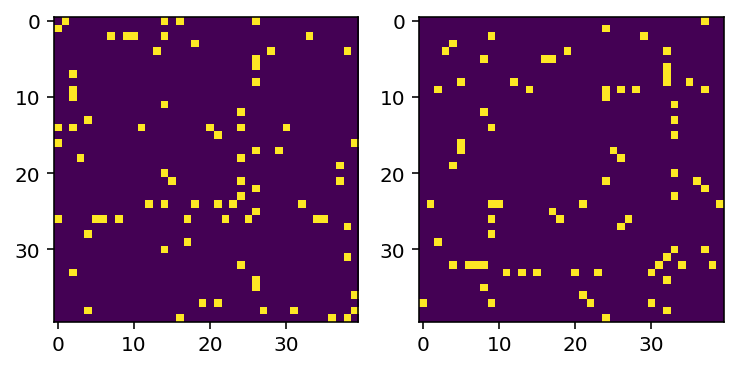

In [396]:

GRAPH_TYPE = 'BA' 
# GRAPH_TYPE = 'ER'

# EXP_DIR = '../experiments/gcn_classification_grid/'
# RUN_FILE = './run_gcn_classification_v1.py'

EXP_DIR = '../experiments/gcn_classification_grid_2_no_flatten/'
RUN_FILE = './run_gcn_classification_v2.py'

os.makedirs(EXP_DIR, exist_ok=True)

TRIMMED = True
# TRIMMED = False
data_config, labels_config = make_data_config_model(data.Adj[GRAPH_TYPE], weighted=False, shuffle_nodes=True, trim_links=TRIMMED)

idx = argsort(rand(len(data_config)))
h = ones(data_config.shape[:2]+(1,))

dataset = {
    'Adj':data_config, 
    'labels':to_categorical(labels_config),
    'rand_indices':idx 
}

dataset_path = EXP_DIR+'%s-N%d_config_dataset-%d'\
        %(GRAPH_TYPE,data.Adj_all.shape[1] ,len(data_config)) + ('-trimmed' if TRIMMED else'')+'.pkl'
print(dataset_path)
pk.dump(dataset,open(dataset_path,'wb'))


# SAVE_PATH = '../experiments/gcn_classification_grid/%s/' % GRAPH_TYPE
SAVE_PATH = EXP_DIR+'%s_leaky_relu' % GRAPH_TYPE + ('-trimmed' if TRIMMED else'')+ '/'
os.makedirs(SAVE_PATH, exist_ok=True)


subplot(121)
imshow(data_config[0])
subplot(122)
imshow(data_config[len(data.Adj[GRAPH_TYPE])])
labels_config[0], labels_config[len(data.Adj[GRAPH_TYPE])]

In [163]:
l = len(data_config)
a = data_config[500]
b = data_config[500+l//2]
a.sum(), b.sum()

(602.0, 536.0)

# Run Experiments

In [397]:
import os 

EPOCHS = 400

ACT = {0: 'linear', 
       1: 'relu', 
       2: 'sigmoid',
       3: 'tanh',
      }

activation = ACT[0]

# units_per_layer = 2
# bias = True
skip = True

params = {
    'units': [], 
    'skip': skip, # whether to pass on skip layers to output
    'activation': activation, # used for all layers
#     'GCN_kws': {'use_bias': bias}, 
#     'dense_kws': {'use_bias': bias}, 
    'final_kws': {'units':10,}, #'activation': 'relu'}, 
    # linear activation is best for final layer
         }

print(RUN_FILE)
for n_layer in range(1,6):
    for units_per_layer in range(1,6,2):
        params['units'] = [units_per_layer] * n_layer
        os.system(RUN_FILE+''' %s "%s" %s %d &''' % ( dataset_path, params, SAVE_PATH , EPOCHS))


./run_gcn_classification_v2.py


# Config. Model vs Real 

In [351]:
b= a.shape[0] # number of bins
c = 100
dif_real = {} 
for i in range(0,len(data_config)//2,c):
    for j in range(i,len(data_config)//2,c):
        for order in range(1,6):
            m = matrix_power(data_config[i],order).sum(0)
            md = matrix_power(data_config[j],order).sum(0)
            
            mn,mx = min(m.min(),md.min()), max(m.max(), md.max())
            h, _ = histogram(m, b, range= (mn,mx), normed=True)
            hd, _ = histogram(md, b, range= (mn,mx), normed=True)
            dif_real[order] = dif_real.get(order,[]) + [abs(h.cumsum()-hd.cumsum()).max()]
        

In [355]:
b= a.shape[0] # number of bins
c = 100
dif_fake = {} 
for i in range(0,len(data_config)//2,c):
    for j in range(i+len(data_config)//2, len(data_config) ,c):
        for order in range(1,6):
            m = matrix_power(data_config[i],order).sum(0)
            md = matrix_power(data_config[j],order).sum(0)
            
            mn,mx = min(m.min(),md.min()), max(m.max(), md.max())
            h, _ = histogram(m, b, range= (mn,mx), normed=True)
            hd, _ = histogram(md, b, range= (mn,mx), normed=True)
            dif_fake[order] = dif_fake.get(order,[]) + [abs(h.cumsum()-hd.cumsum()).max()]
        

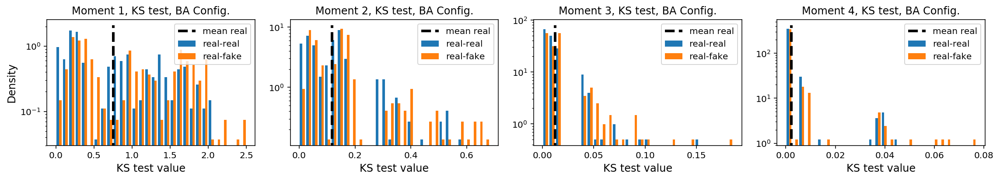

In [412]:
figure(figsize = (16,3))
for k in sorted(dif_real)[:-1]:
    subplot(1,4,k)
    [h,hd],bns,_ = hist([dif_real[k],dif_fake[k] ], b, label = ['real-real','real-fake'], log = 1, alpha = 1, density=True)
    title('Moment %d, KS test, BA Config.'%k)
    xlabel('KS test value',fontsize = 12)
    if k == 1:
        ylabel('Density',fontsize = 12)
    plot([mean(dif_real[k])]*2, [min(h), 1.2*max(h)], lw = 3 , c = 'k', ls = '--', label ='mean real')
    legend()
    tight_layout()
    
savefig('../figs/expressivity/GCN/configuration_model/gcn-config-KS-BA-1-row.pdf')
savefig('../figs/expressivity/GCN/configuration_model/gcn-config-KS-BA-1-row.png', dpi = 300)

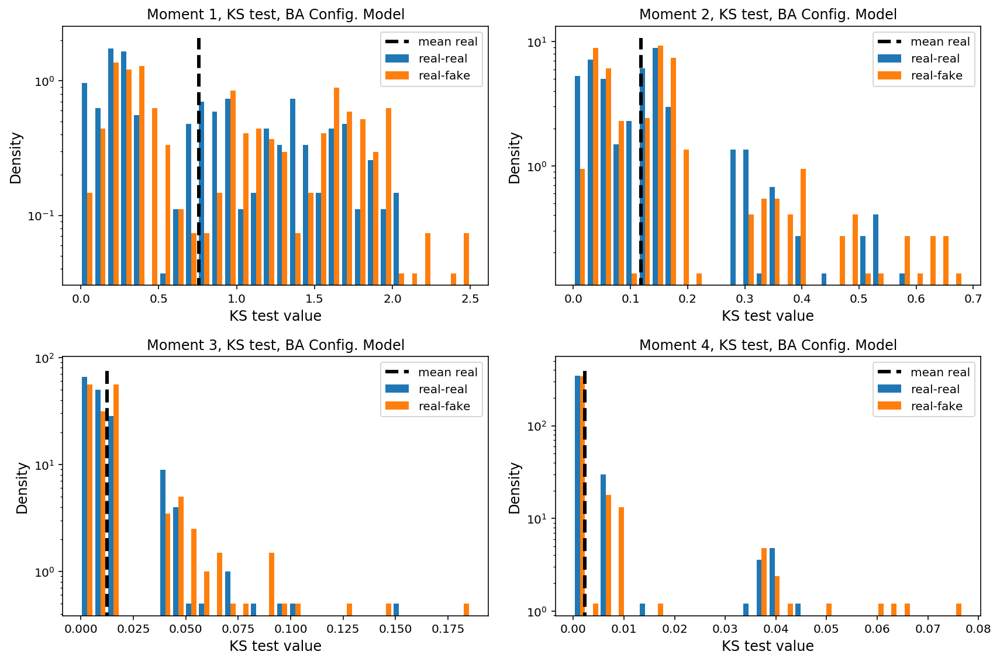

In [388]:
figure(figsize = (12,8))
for k in sorted(dif_real)[:-1]:
    subplot(2,2,k)
    [h,hd],bns,_ = hist([dif_real[k],dif_fake[k] ], b, label = ['real-real','real-fake'], log = 1, alpha = 1, density=True)
    title('Moment %d, KS test, BA Config. Model'%k)
    xlabel('KS test value',fontsize = 12)
    ylabel('Density',fontsize = 12)
    plot([mean(dif_real[k])]*2, [min(h), 1.2*max(h)], lw = 3 , c = 'k', ls = '--', label ='mean real')
    legend()
    tight_layout()
    
savefig('../figs/expressivity/GCN/configuration_model/gcn-config-KS-BA.pdf')
savefig('../figs/expressivity/GCN/configuration_model/gcn-config-KS-BA.png', dpi = 300)

In [325]:
i = 100
a = data_config[i+5]
ad = data_config[i] #+len(data_config)//2]

In [286]:
a.shape

(30, 30)

In [288]:
from scipy.stats import kstest

In [289]:
m, md = moments[-1], moments_config[-1]

In [291]:
b = 20
h = histogram(m, b)
hd = histogram(md, b)

In [338]:
dif = []
b= 20
for i, (m, md) in enumerate(zip( moments, moments_config)):
    mn,mx = min(m.min(),md.min()), max(m.max(), md.max())
    h, _ = histogram(m, b, range= (mn,mx), normed=True)
    hd, _ = histogram(md, b, range= (mn,mx), normed=True)
#     [h,hd], bns, p = hist([m,md],20, density=1,)# cumulative=1);
#     show()
    #dif+= [[i+1,abs(h-hd).max()]]
    dif+= [[i+1,abs(h.cumsum()-hd.cumsum()).max()]]
#     plt.clf()

In [336]:
dif = [] 
for i, (m, md) in enumerate(zip( moments, moments_config)):
    [h,hd], bns, p = hist([m,md],20, density=1,)# cumulative=1);
#     show()
    #dif+= [[i+1,abs(h-hd).max()]]
    dif+= [[i+1,abs(h.cumsum()-hd.cumsum()).max()]]
    plt.clf()

<Figure size 432x288 with 0 Axes>

In [334]:
a.shape[0]**(arange(1,6)/2)

array([   5.47722558,   30.        ,  164.31676725,  900.        ,
       4929.50301755])

Text(0, 0.5, 'KS difference')

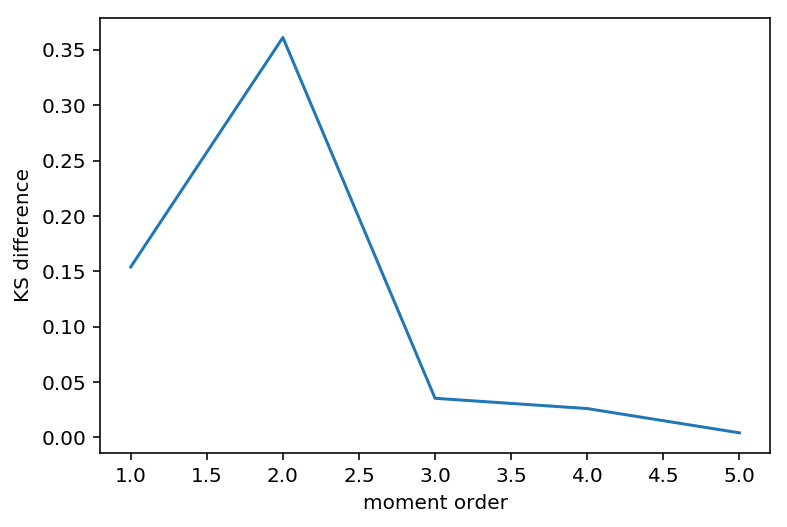

In [339]:
plot(*array(dif).T)
xlabel('moment order')
ylabel('KS difference')

In [340]:
dif

[[1, 0.15384615384615397],
 [2, 0.3611111111111111],
 [3, 0.035256410256410256],
 [4, 0.02597402597402597],
 [5, 0.004059829059829059]]

In [329]:
hd

array([0.00064103, 0.0025641 , 0.00277778, 0.00021368, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.00021368])

In [312]:
abs(h-hd).max()

0.06666666666666668

In [313]:
abs(h.cumsum()-hd.cumsum()).max()

0.06666666666666687

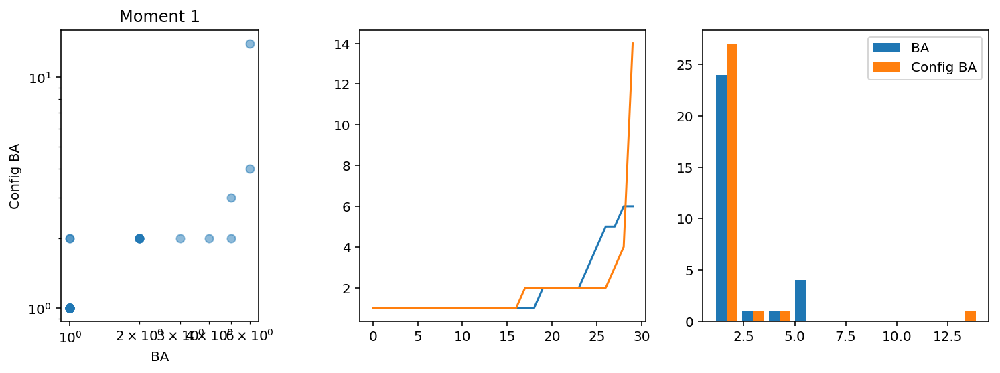

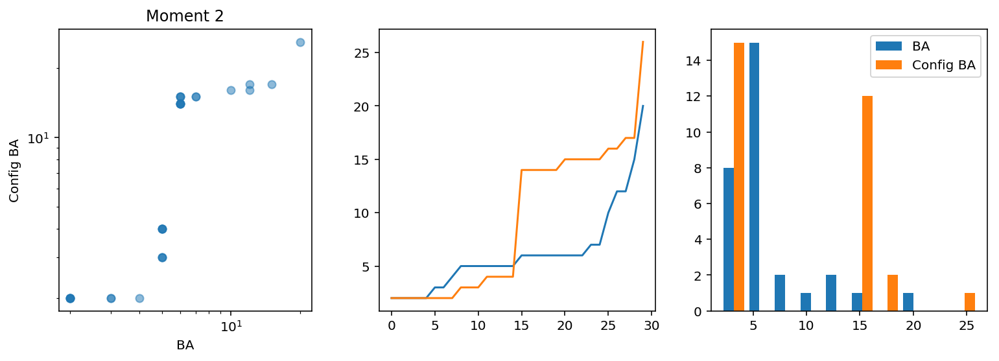

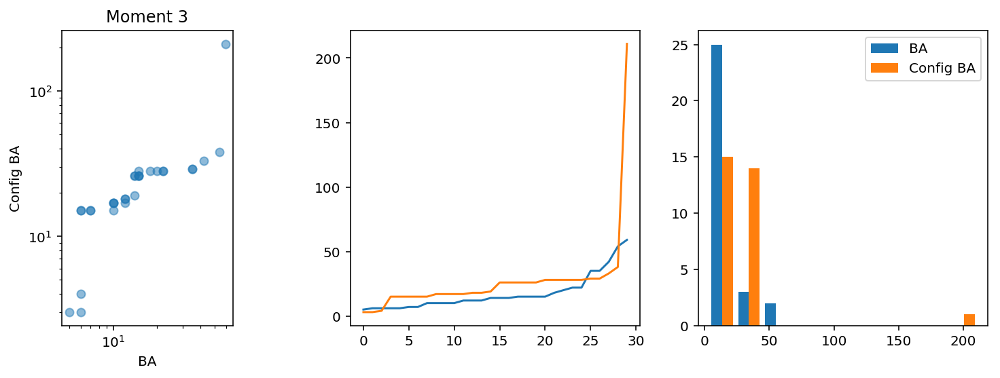

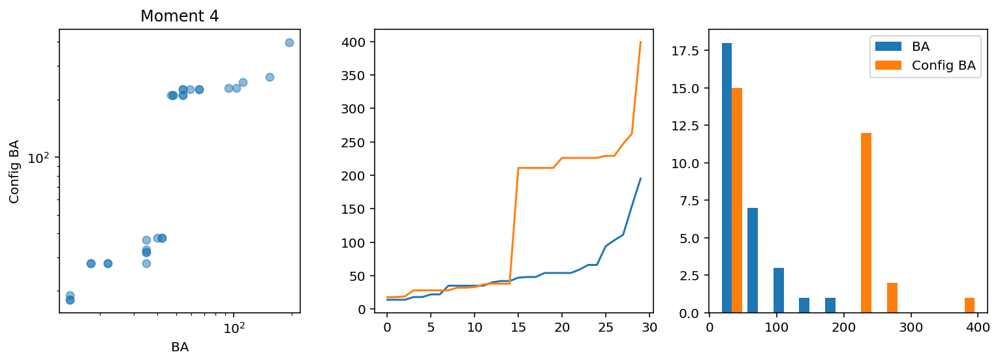

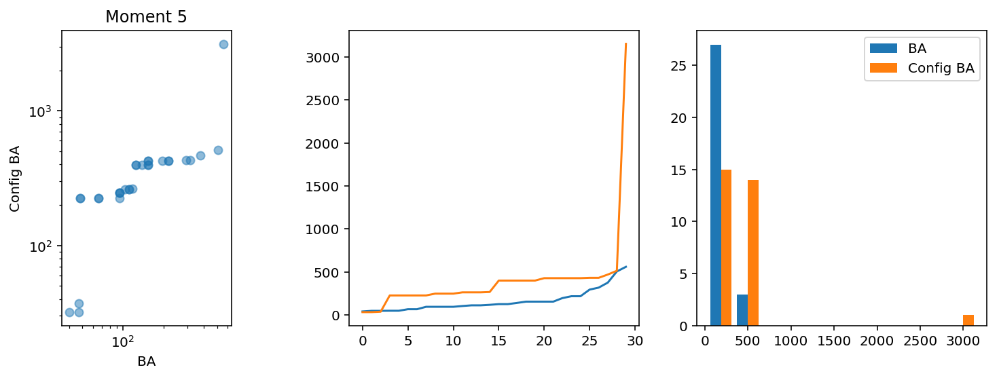

In [326]:
moments = []
moments_config = []
n = a.shape[0]
for i in range(1,6):
    moments += [matrix_power(a,i).sum(0)/ n**(0)]
    moments_config += [matrix_power(ad,i).sum(0)/ n**(0)]
    figure(figsize=(13,4))
    subplot(131, aspect = 1)
    plot(sorted(moments[-1]),sorted(moments_config[-1]), 'o', alpha = 0.5)
    title( 'Moment %d' %i)
    xlabel('BA')
    ylabel('Config BA')
    xscale('log')
    yscale('log')
    
    subplot(132)
    plot(sorted(moments[-1]),label='BA')
    plot(sorted(moments_config[-1]), label='Config BA')
    subplot(133)
    hist([moments[-1], moments_config[-1]],label=['BA','Config BA'])
    legend()
    show()
    

# Config. Model Classification results

In [25]:
from glob import glob

In [399]:
pth = SAVE_PATH
# pth = '../experiments/gcn_classification_grid_2_no_flatten/BA_vs_ER_leaky_relu/'
# pth = '../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu-trimmed/'
# pth = '../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/'

res = glob(pth + '/gcn*.pkl')
# res = glob( '../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn*.pkl')

len(res)

75

In [253]:
# res

In [254]:
SAVE_PATH

'../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu-trimmed/'

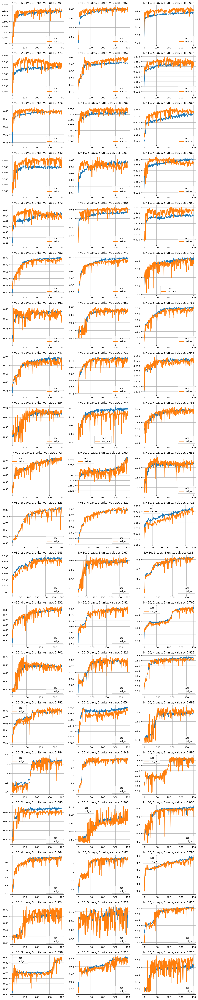

In [263]:
# n = 50
a = 3
num = round(len(res)/ a)

figure(figsize=(4*a, num*3))
i = 0
for r in sorted(res):
#     if int(r.split('-N')[1].split('-')[0]) != n:
#         continue
    n = int(r.split('-N')[1].split('-')[0])
    subplot(num,a,i+1)
    i+=1
    g = pk.load(open(r, 'rb'))
    n_lay = len(g['params']['units'])
    act = g['params']['activation']
    results.setdefault(act, {})
    u = g['params']['units'][0]
    for k in ['acc', 'val_acc']:
        plot(g['history'][k], label = k)

    legend()
    title('N=%d, %d Lays, %d units, val. acc %.3g' %(n,n_lay, u, max(g['history']['val_acc'])))
#     title(r.split('-N')[1].split('-activation')[0].strip('.pkl')+'\n max val %.3g' % max(g['history']['val_acc']) )
    grid()
    tight_layout()
    
show()

In [39]:
# mkdir ../figs/expressivity/GCN/configuration_model/

In [70]:
SAVE_PATH

'../experiments/gcn_classification_grid_2_no_flatten/BA_vs_ER_leaky_relu/'

In [259]:
typ = pth.strip('/').split('/')[-1]

config_dir = '../figs/expressivity/GCN/configuration_model/' 
# config_dir = '../figs/expressivity/GCN/%s/' %(typ.strip('_leaky_relu'))  
os.makedirs(config_dir, exist_ok=True)
config_dir


'../figs/expressivity/GCN/configuration_model/'

In [236]:
typ

'BA_leaky_relu'

In [41]:

figs_config = glob('../figs/expressivity/GCN/gcn-config*')
for f in figs_config:
    os.system('mv %s %s'%(f, config_dir))

../figs/expressivity/GCN/configuration_model/gcn-1-BA_leaky_relu-trimmed-All-trimmed


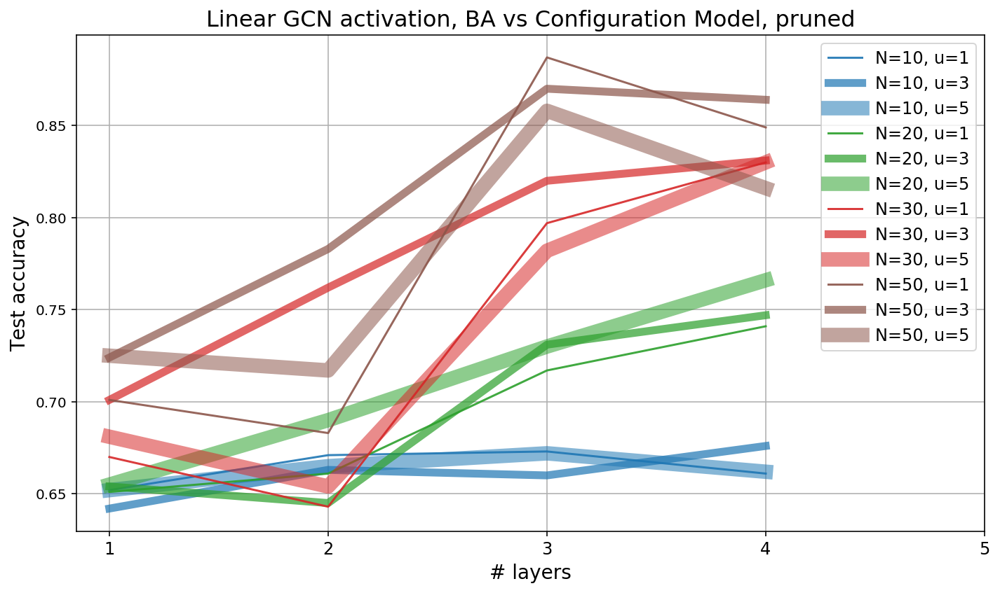

In [414]:
typ = pth.strip('/').split('/')[-1]
cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

# stl = ['-','--', ':']
figure(figsize=(10,6))
for ii,n in enumerate(n_list):
    if n==40:continue
    results = {}
    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for i1,k in enumerate(sorted(r1)):
            plot(*r1[k][:-1].T, label = 'N=%d, u=%d' %(n,k), #ls= stl[i1],#marker = '.',
                 lw=1.5*k**1.2 , alpha= 1-tanh(k/10), c= cols[ii])
        t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
        title('%s GCN activation, %s' %(a.capitalize(), t) + (', pruned' if '-trimmed' in res[0] else ''), size=16 )
        xlabel('# layers', size = 14)
        ylabel('Test accuracy', size = 14)
        xticks(arange(1,6),fontsize=12)
#         if ylim()[0] >0.95:
#             ylim(0.95,1.01)
#         ylim(0.75,1.01)
#         legend(ncol=5)

legend(fontsize= 12)
grid()

tight_layout()

nam = config_dir+'gcn-1-%s-All'%(typ) + ('-trimmed' if '-trimmed' in res[0] else '')
print(nam)

savefig(nam +'.pdf')
savefig(nam +'.png', dpi=300)
        
#         show()


../figs/expressivity/GCN/configuration_model//gcn-1-BA_leaky_relu-trimmed-architecture_vs_nodes


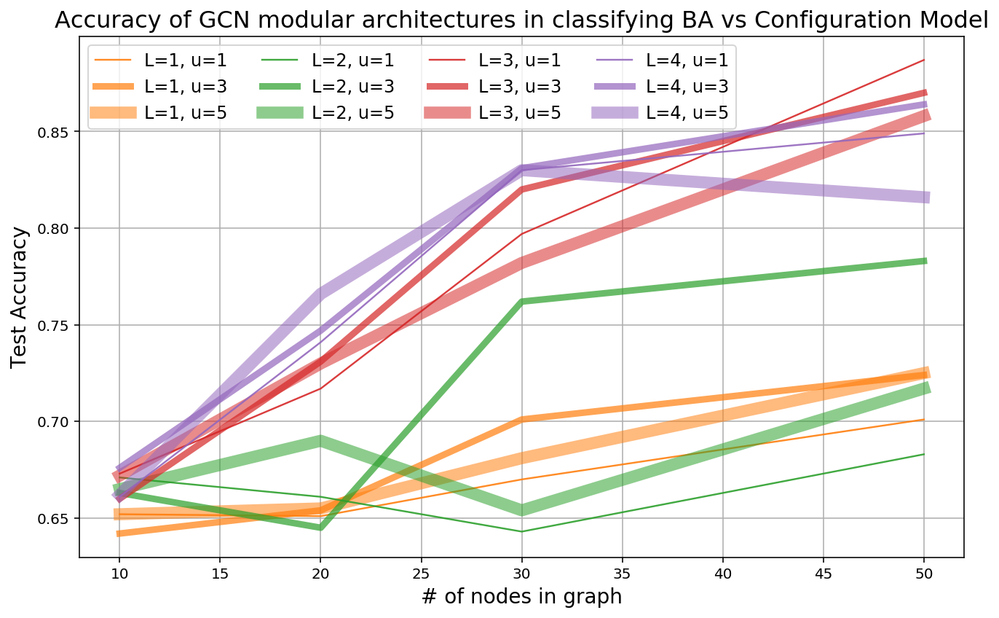

In [393]:
columns = {v:k for k,v in enumerate(['n','layers','units','val_acc','activation'])}
full_res = []
for r in res:
    g = pk.load(open(r, 'rb'))
    
    l = [None]*len(columns)
    l[columns['n']] = int(r.split('-N')[1].split('-')[0])
    l[columns['layers']] = len(g['params']['units'])
    l[columns['activation']] = g['params']['activation']
    results.setdefault(act, {})
    l[columns['units']] = g['params']['units'][0]
    l[columns['val_acc']] = max(g['history']['val_acc'])
#     if l[columns['n']]== 20: 
#         print('hi')
#         continue
    full_res += [l]
    
full_res = array(full_res)


s = set(full_res[:, columns['activation']])
results = {a: np.float32(full_res[where(full_res[:, columns['activation']]==a)[0], :-1]) for a in s}

r = results['linear']
stats = {}
for l in set(r[:,columns['layers']]):
    for u in set(r[:,columns['units']]):
        ix = where((r[:,columns['layers']]==l) * (r[:,columns['units']]==u))[0]
        k = (l,u)
        stats[k] = r[ix][:,[columns['n'],columns['val_acc']]]
        #stats[k] = stats.get(k, []) + [[r[columns['n']], r[columns['val_acc']]]]


# type of graphs
typ = pth.strip('/').split('/')[-1] 

cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

figure(figsize=(10,6))
for k in sorted(stats):
#     print(k)
    a = array(stats[k])
    l,u = k
    if l==5: continue
    plot(*a[argsort(a[:,0])].T, label = 'L=%d, u=%d' %k, lw=1.2*u**1.2 , alpha= 1-tanh(u/10), c = cols[l])

legend(ncol = 4,fontsize=12)
# ylim(.8,1.01)
xlabel('# of nodes in graph', size = 14)    
ylabel('Test Accuracy',size = 14)

t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
title('Accuracy of GCN modular architectures in classifying %s'%(t),size=16 )
nam = config_dir+'/gcn-1-%s-architecture_vs_nodes' %typ
print(nam)
grid()
tight_layout()

savefig(nam +'.pdf')
savefig(nam +'.png', dpi=300)

../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-All


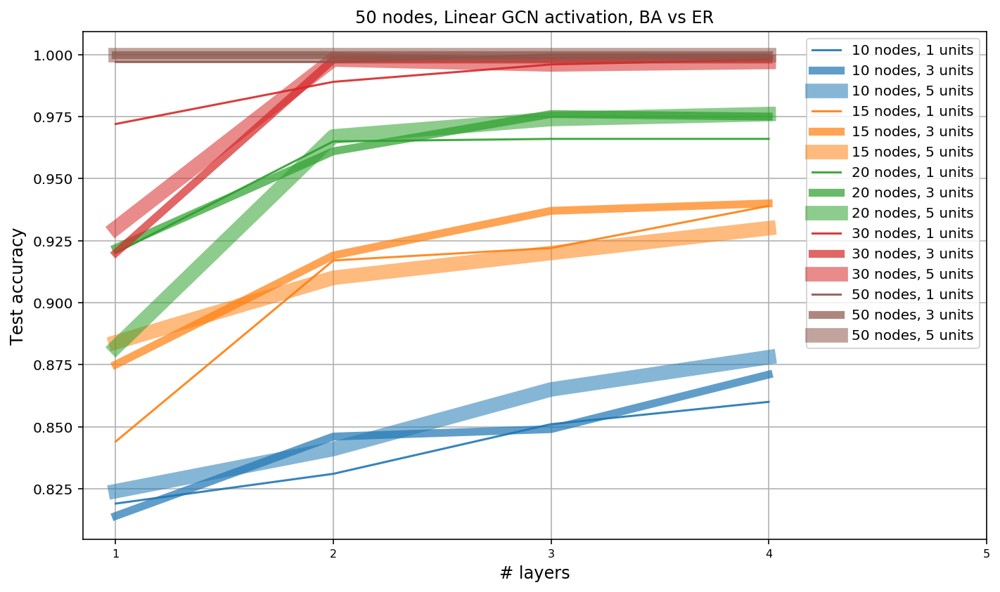

In [154]:
typ = pth.strip('/').split('/')[-1]
cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

# stl = ['-','--', ':']
figure(figsize=(10,6))
for ii,n in enumerate(n_list):
    results = {}
    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for i1,k in enumerate(sorted(r1)):
            plot(*r1[k][:-1].T, label = '%d nodes, %d units' %(n,k), #ls= stl[i1],#marker = '.',
                 lw=1.5*k**1.2 , alpha= 1-tanh(k/10), c= cols[ii])
        t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
        title('%d nodes, %s GCN activation, %s' %(n,a.capitalize(), t) + (', pruned' if '-trimmed' in res[0] else '') )
        xlabel('# layers', size = 12)
        ylabel('Test accuracy', size = 12)
        xticks(arange(1,6),fontsize=8)
        if ylim()[0] >0.95:
            ylim(0.95,1.01)
        legend()
        grid()
        
        tight_layout()
        
nam = config_dir+'gcn-%s-All'%(typ) + ('-trimmed' if '-trimmed' in res[0] else '')
print(nam)
# savefig(nam +'.pdf')
# savefig(nam +'.png', dpi=300)
        
#         show()


../figs/expressivity/GCN/BA_vs_ER/gcn-1-BA_vs_ER_leaky_relu-All


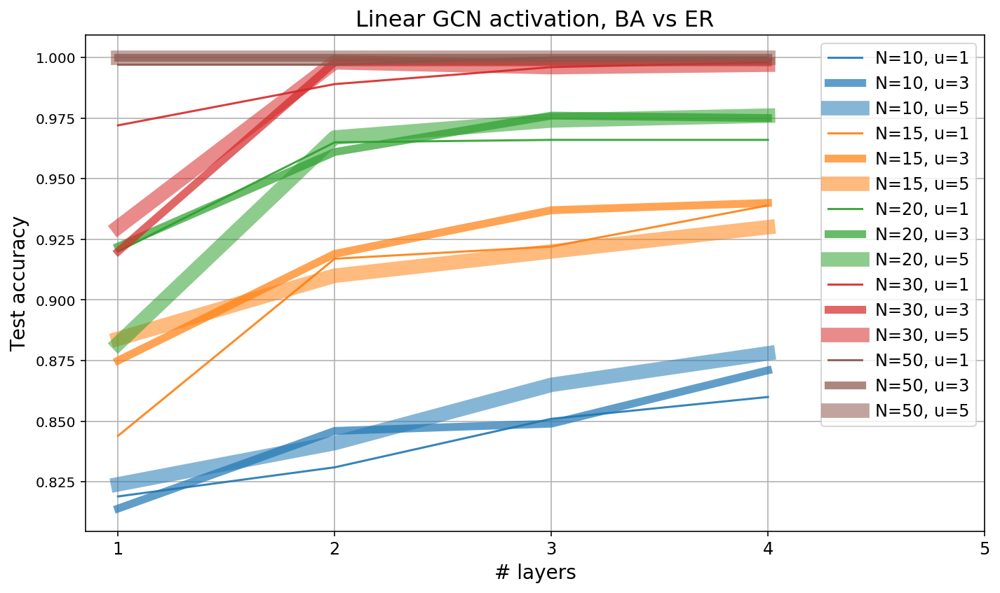

In [199]:
typ = pth.strip('/').split('/')[-1]
cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

# stl = ['-','--', ':']
figure(figsize=(10,6))
for ii,n in enumerate(n_list):
    results = {}
    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for i1,k in enumerate(sorted(r1)):
            plot(*r1[k][:-1].T, label = 'N=%d, u=%d' %(n,k), #ls= stl[i1],#marker = '.',
                 lw=1.5*k**1.2 , alpha= 1-tanh(k/10), c= cols[ii])
        t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
        title('%s GCN activation, %s' %(a.capitalize(), t) + (', pruned' if '-trimmed' in res[0] else ''), size=16 )
        xlabel('# layers', size = 14)
        ylabel('Test accuracy', size = 14)
        xticks(arange(1,6),fontsize=12)
#         if ylim()[0] >0.95:
#             ylim(0.95,1.01)
#         ylim(0.75,1.01)
#         legend(ncol=5)
        legend(fontsize= 12)
        grid()
        
        tight_layout()
        
nam = config_dir+'gcn-1-%s-All'%(typ) + ('-trimmed' if '-trimmed' in res[0] else '')
print(nam)
# savefig(nam +'.pdf')
# savefig(nam +'.png', dpi=300)
        
#         show()


../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N10
../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N15
../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N20
../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N30
../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N50


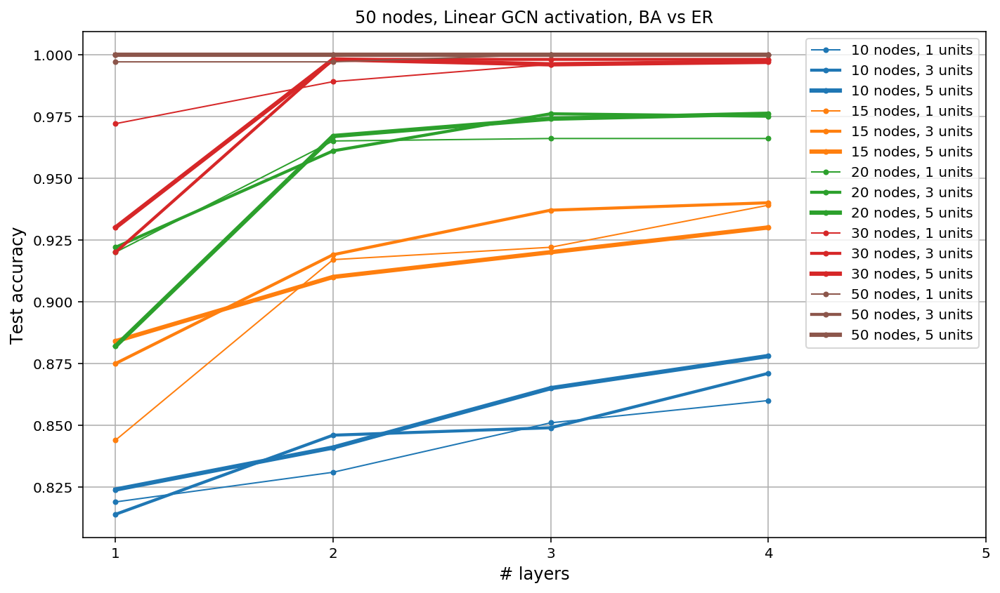

In [140]:
typ = pth.strip('/').split('/')[-1]
cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

figure(figsize=(10,6))
for ii,n in enumerate(n_list):
    results = {}
    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for k in sorted(r1):
            plot(*r1[k][:-1].T, label = '%d nodes, %d units' %(n,k), marker = '.', lw= k**.7, c= cols[ii])
        t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
        title('%d nodes, %s GCN activation, %s' %(n,a.capitalize(), t) + (', pruned' if '-trimmed' in res[0] else '') )
        xlabel('# layers', size = 12)
        ylabel('Test accuracy', size = 12)
        xticks(arange(1,6))
        if ylim()[0] >0.95:
            ylim(0.95,1.01)
        legend()
        grid()
        
        tight_layout()
#     nam = config_dir+'gcn-%s-N%d'%(typ,n) + ('-trimmed' if '-trimmed' in res[0] else '')
#     print(nam)
#         savefig(nam +'.pdf')
#         savefig(nam +'.png', dpi=300)
        
#         show()


../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N10


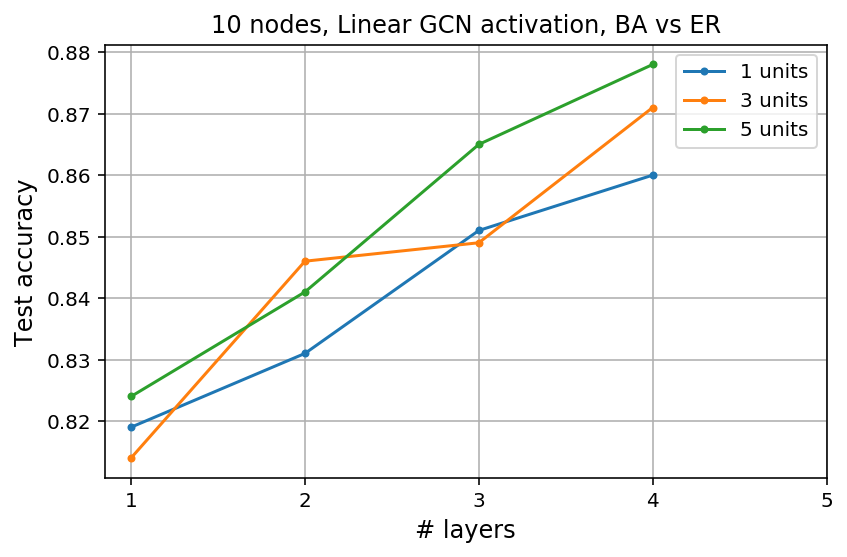

../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N15


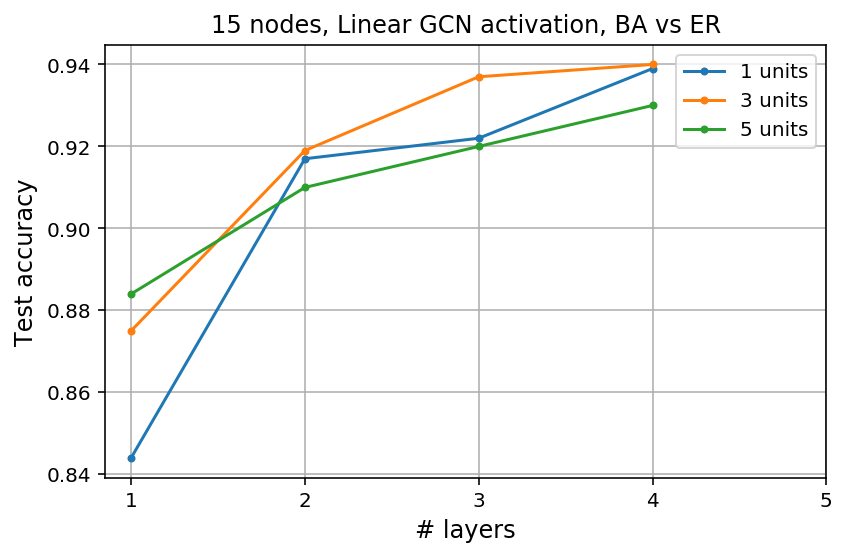

../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N20


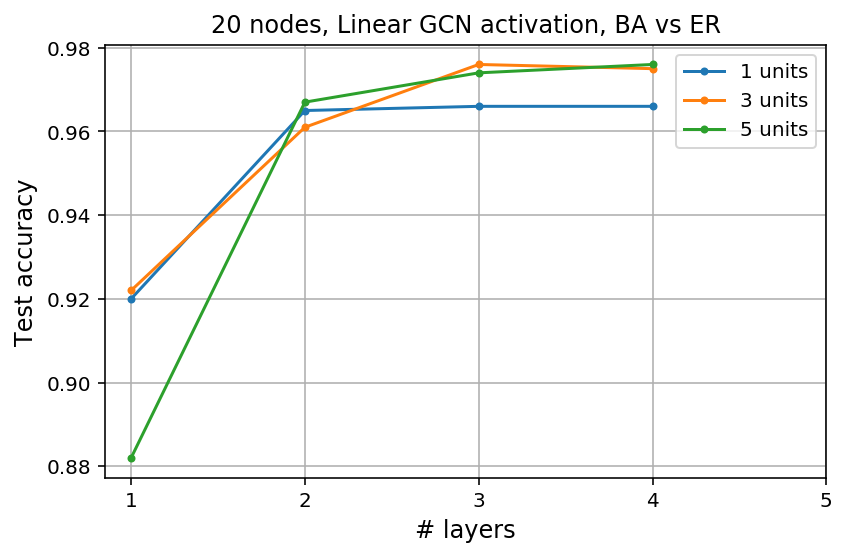

../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N30


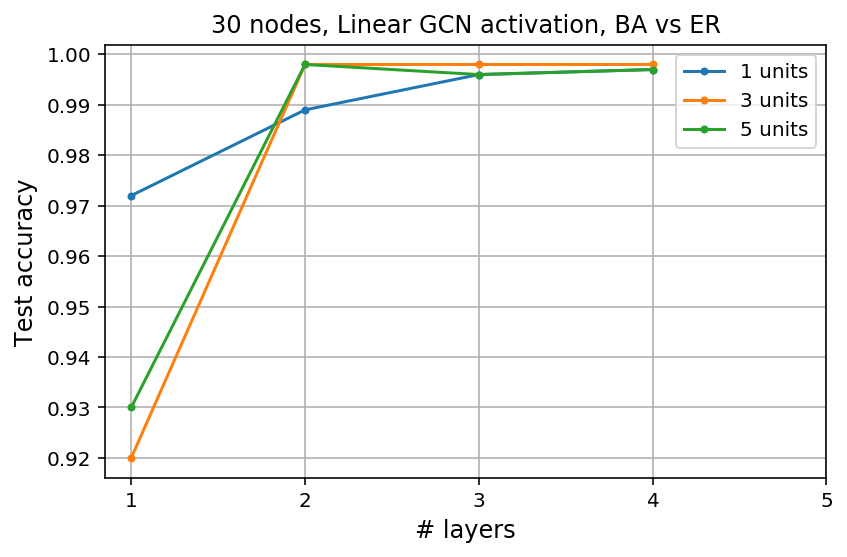

../figs/expressivity/GCN/BA_vs_ER/gcn-BA_vs_ER_leaky_relu-N50


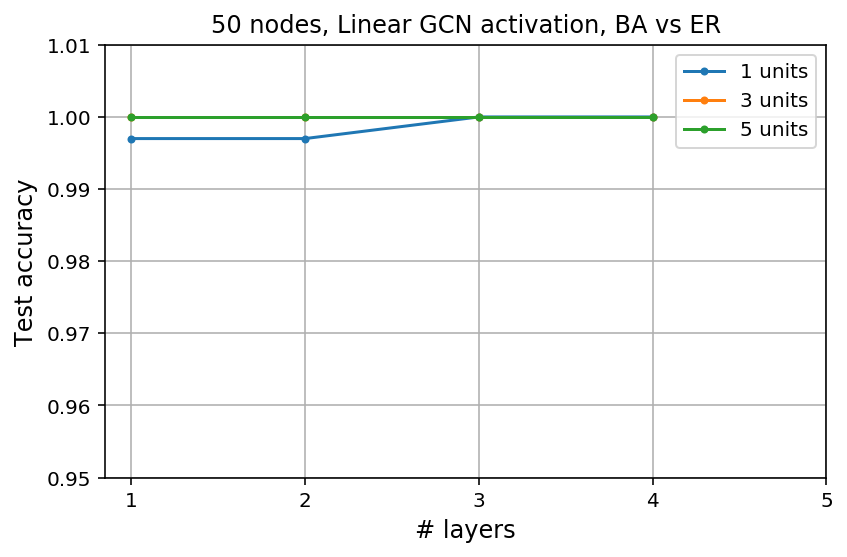

In [134]:
typ = pth.strip('/').split('/')[-1]

for n in n_list:
    results = {}

    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for k in sorted(r1):
            plot(*r1[k][:-1].T, label = '%d units' %k, marker = '.')
        t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
        title('%d nodes, %s GCN activation, %s' %(n,a.capitalize(), t) + (', pruned' if '-trimmed' in res[0] else '') )
        xlabel('# layers', size = 12)
        ylabel('Test accuracy', size = 12)
        xticks(arange(1,6))
        if ylim()[0] >0.95:
            ylim(0.95,1.01)
        legend()
        grid()
        
        tight_layout()
        nam = config_dir+'gcn-%s-N%d'%(typ,n) + ('-trimmed' if '-trimmed' in res[0] else '')
        print(nam)
        savefig(nam +'.pdf')
        savefig(nam +'.png', dpi=300)
        
        show()


In [131]:
columns = {v:k for k,v in enumerate(['n','layers','units','val_acc','activation'])}
full_res = []
for r in res:
    g = pk.load(open(r, 'rb'))
    
    l = [None]*len(columns)
    l[columns['n']] = int(r.split('-N')[1].split('-')[0])
    l[columns['layers']] = len(g['params']['units'])
    l[columns['activation']] = g['params']['activation']
    results.setdefault(act, {})
    l[columns['units']] = g['params']['units'][0]
    l[columns['val_acc']] = max(g['history']['val_acc'])
    full_res += [l]
    
full_res = array(full_res)

In [132]:
s = set(full_res[:, columns['activation']])
results = {a: np.float32(full_res[where(full_res[:, columns['activation']]==a)[0], :-1]) for a in s}

r = results['linear']
stats = {}
for l in set(r[:,columns['layers']]):
    for u in set(r[:,columns['units']]):
        ix = where((r[:,columns['layers']]==l) * (r[:,columns['units']]==u))[0]
        k = (l,u)
        stats[k] = r[ix][:,[columns['n'],columns['val_acc']]]
        #stats[k] = stats.get(k, []) + [[r[columns['n']], r[columns['val_acc']]]]


../figs/expressivity/GCN/BA_vs_ER//gcn-1-BA_vs_ER_leaky_relu-architecture_vs_nodes


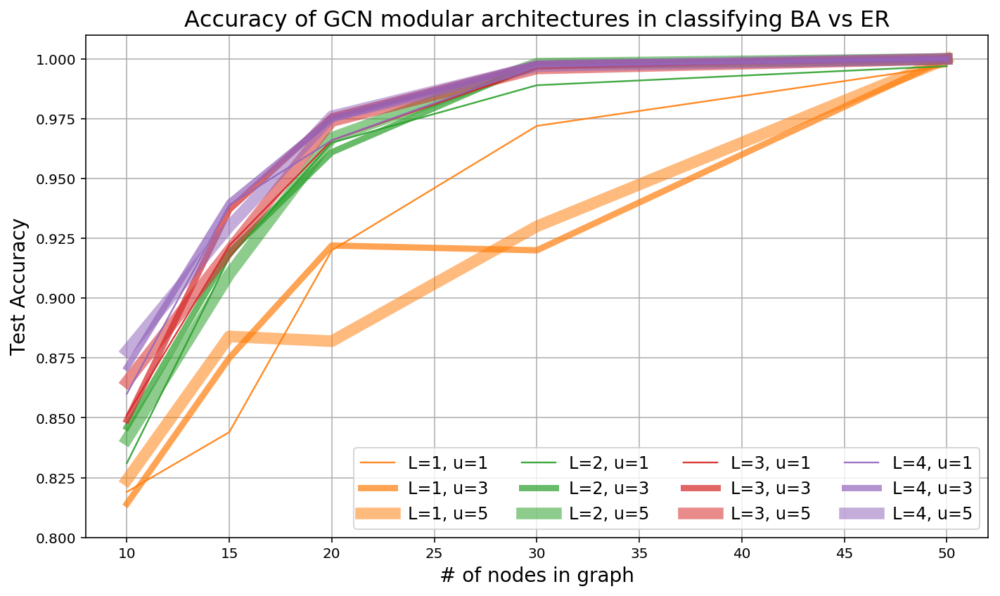

In [196]:
# type of graphs
typ = pth.strip('/').split('/')[-1] 

cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

figure(figsize=(10,6))
for k in sorted(stats):
#     print(k)
    a = array(stats[k])
    l,u = k
    if l==5: continue
    plot(*a[argsort(a[:,0])].T, label = 'L=%d, u=%d' %k, lw=1.2*u**1.2 , alpha= 1-tanh(u/10), c = cols[l])

legend(ncol = 4,fontsize=12)
ylim(.8,1.01)
xlabel('# of nodes in graph', size = 14)    
ylabel('Test Accuracy',size = 14)

t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
title('Accuracy of GCN modular architectures in classifying %s'%(t),size=16 )
nam = config_dir+'/gcn-1-%s-architecture_vs_nodes' %typ
print(nam)
grid()
tight_layout()

savefig(nam +'.pdf')
savefig(nam +'.png', dpi=300)

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


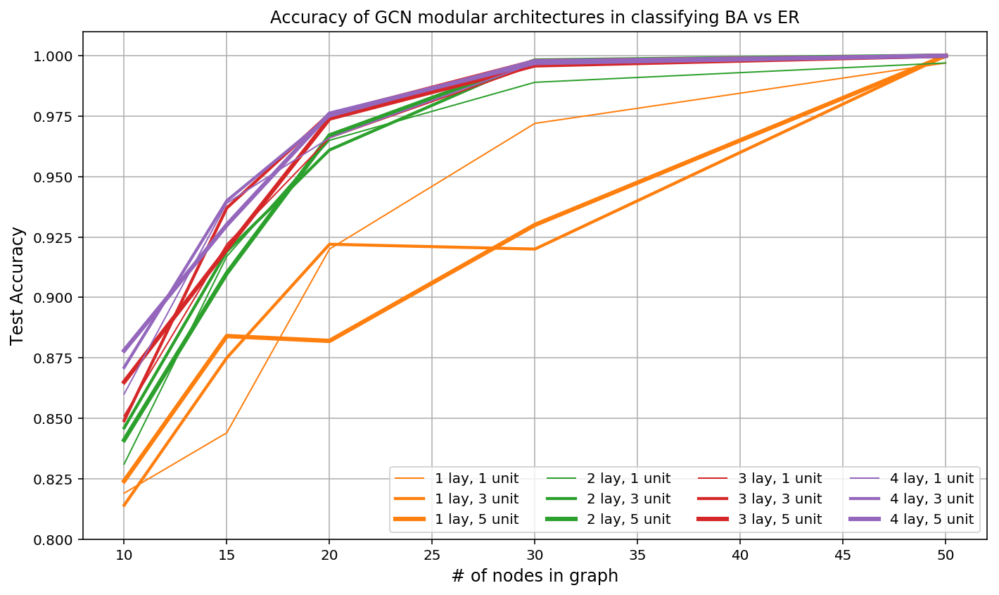

In [133]:
# type of graphs
typ = pth.strip('/').split('/')[-1] 

cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

figure(figsize=(10,6))
for k in sorted(stats):
#     print(k)
    a = array(stats[k])
    l,u = k
    if l==5: continue
    plot(*a[argsort(a[:,0])].T, label = '%d lay, %d unit' %k, lw = (u)**.7, c = cols[l])

legend(ncol = 4)
ylim(.8,1.01)
xlabel('# of nodes in graph', size = 12)    
ylabel('Test Accuracy',size = 12)
t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
title('Accuracy of GCN modular architectures in classifying %s'%(t) )
nam = config_dir+'/gcn-%s-architecture_vs_nodes' %typ
print(nam)
grid()
tight_layout()

savefig(nam +'.pdf')
savefig(nam +'.png', dpi=300)

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


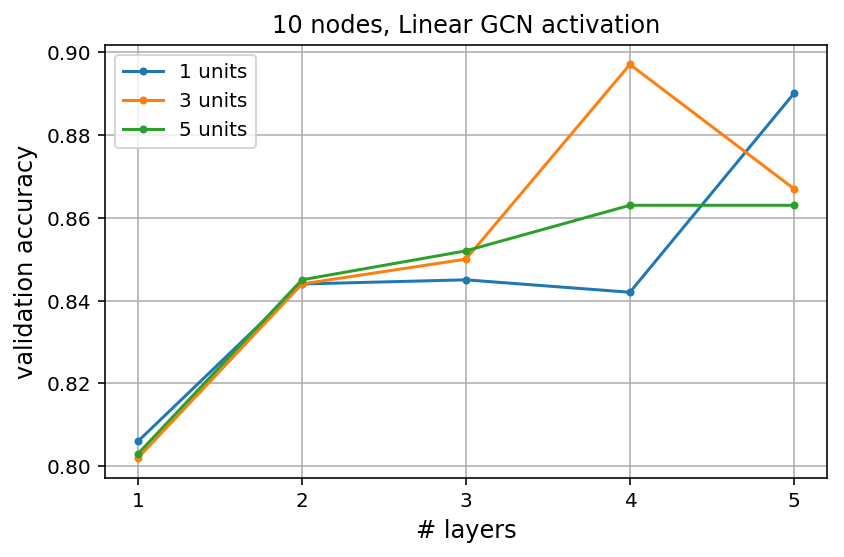

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


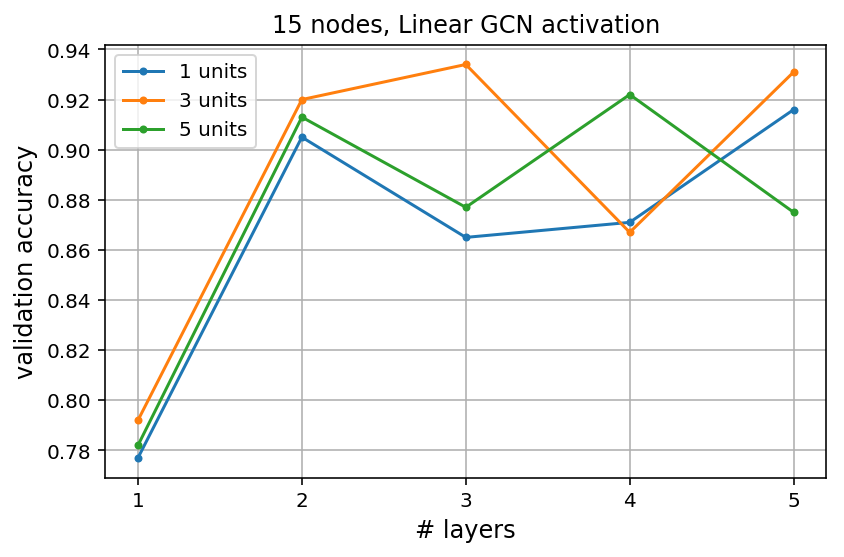

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


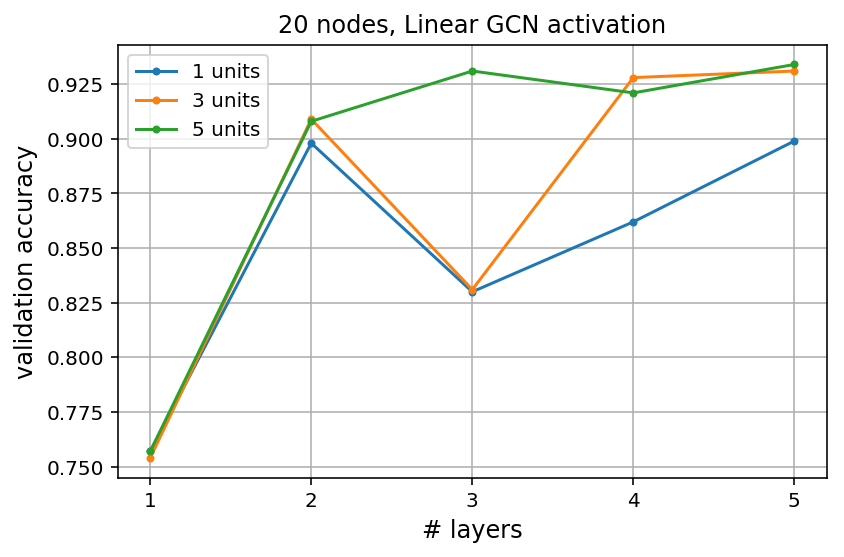

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


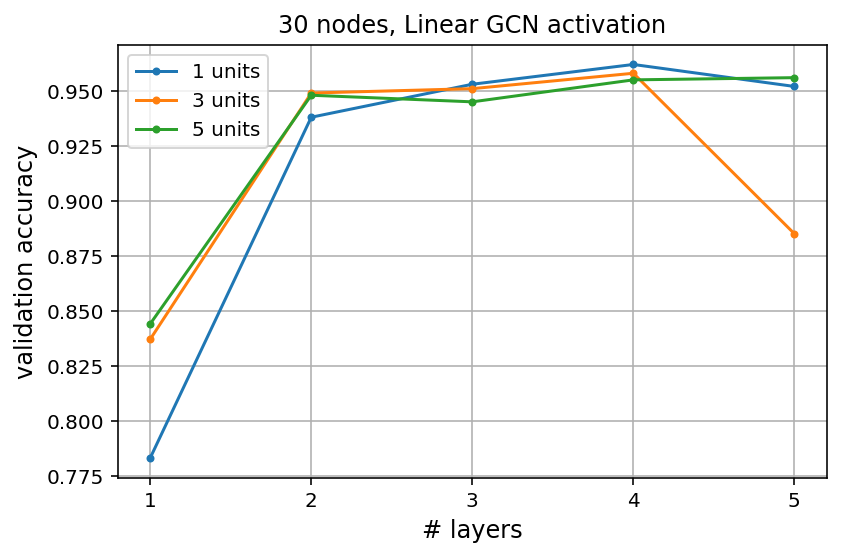

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


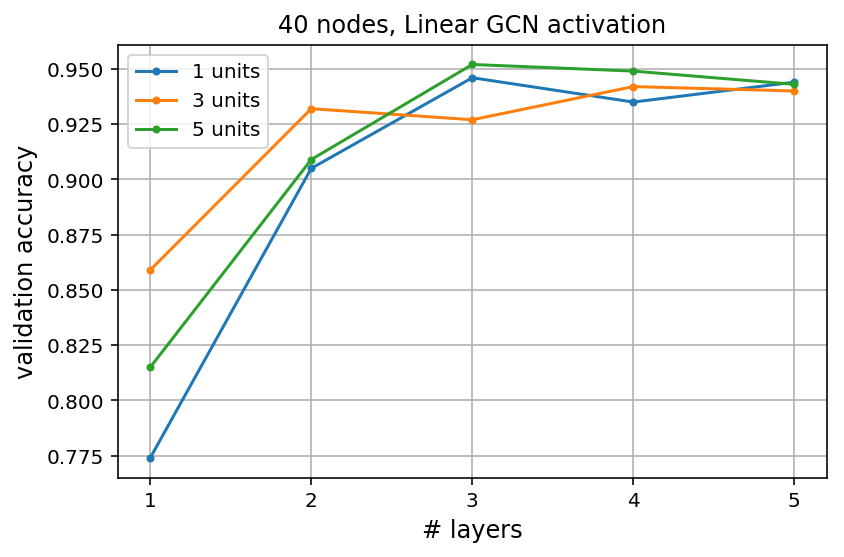

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


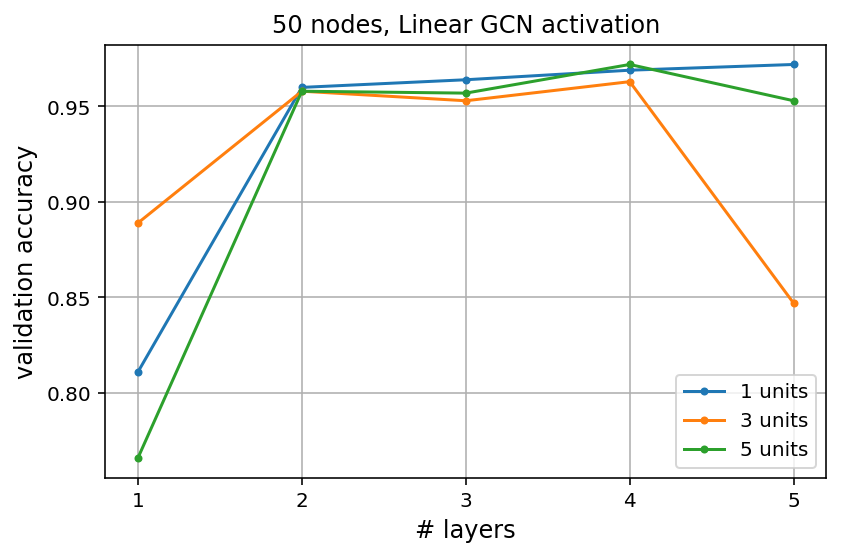

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_vs_ER_leaky_relu-architecture_vs_nodes


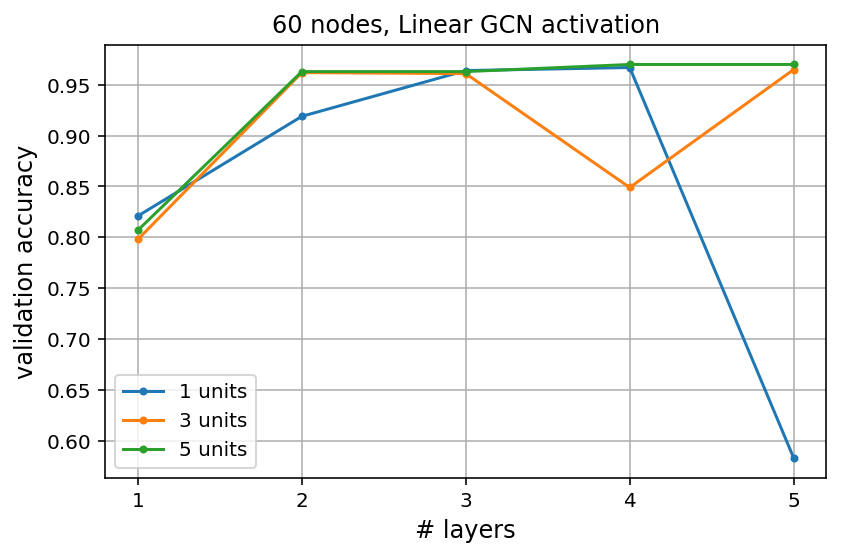

In [104]:
typ = pth.strip('/').split('/')[-1]

for n in n_list:
    results = {}

    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for k in sorted(r1):
            plot(*r1[k].T, label = '%d units' %k, marker = '.')
        title('%d nodes, %s GCN activation' %(n,a.capitalize()) + (', pruned' if '-trimmed' in res[0] else '') )
        xlabel('# layers', size = 12)
        ylabel('validation accuracy', size = 12)
        xticks(arange(1,6))
    #     ylim(0.5,1)
        legend()
        grid()
        
        tight_layout()
#         nam = '../figs/expressivity/GCN/configuration_model/gcn-config-%s-N%d'%(typ,n) + ('-trimmed' if '-trimmed' in res[0] else '')
        print(nam)
#         savefig(nam +'.pdf')
#         savefig(nam +'.png', dpi=300)
        
        show()


../figs/expressivity/GCN/configuration_model/gcn-1-BA_leaky_relu-All


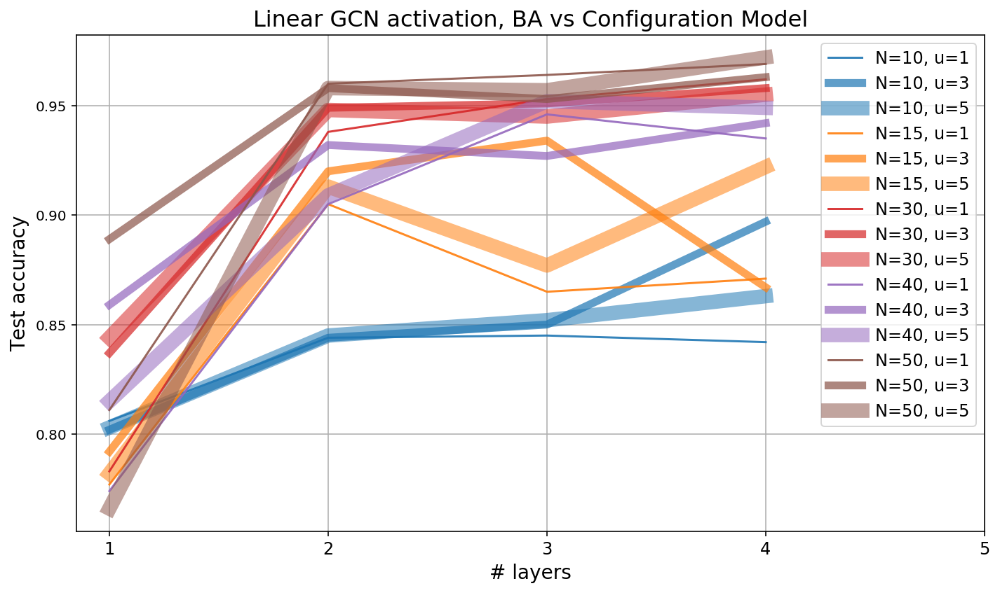

In [243]:
typ = pth.strip('/').split('/')[-1]
cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

# stl = ['-','--', ':']
figure(figsize=(10,6))
for ii,n in enumerate(n_list):
    if n==20 or n==60: continue
    results = {}
    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for i1,k in enumerate(sorted(r1)):
            plot(*r1[k][:-1].T, label = 'N=%d, u=%d' %(n,k), #ls= stl[i1],#marker = '.',
                 lw=1.5*k**1.2 , alpha= 1-tanh(k/10), c= cols[ii])
        t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
        title('%s GCN activation, %s' %(a.capitalize(), t) + (', pruned' if '-trimmed' in res[0] else ''), size=16 )
        xlabel('# layers', size = 14)
        ylabel('Test accuracy', size = 14)
        xticks(arange(1,6),fontsize=12)
#         if ylim()[0] >0.95:
#             ylim(0.95,1.01)
#         ylim(0.75,1.01)
#         legend(ncol=5)
        legend(fontsize= 12)
        grid()
        
        tight_layout()
        
nam = config_dir+'gcn-1-%s-All'%(typ) + ('-trimmed' if '-trimmed' in res[0] else '')
print(nam)
savefig(nam +'.pdf')
savefig(nam +'.png', dpi=300)
        
#         show()


../figs/expressivity/GCN/configuration_model/gcn-BA_leaky_relu-All


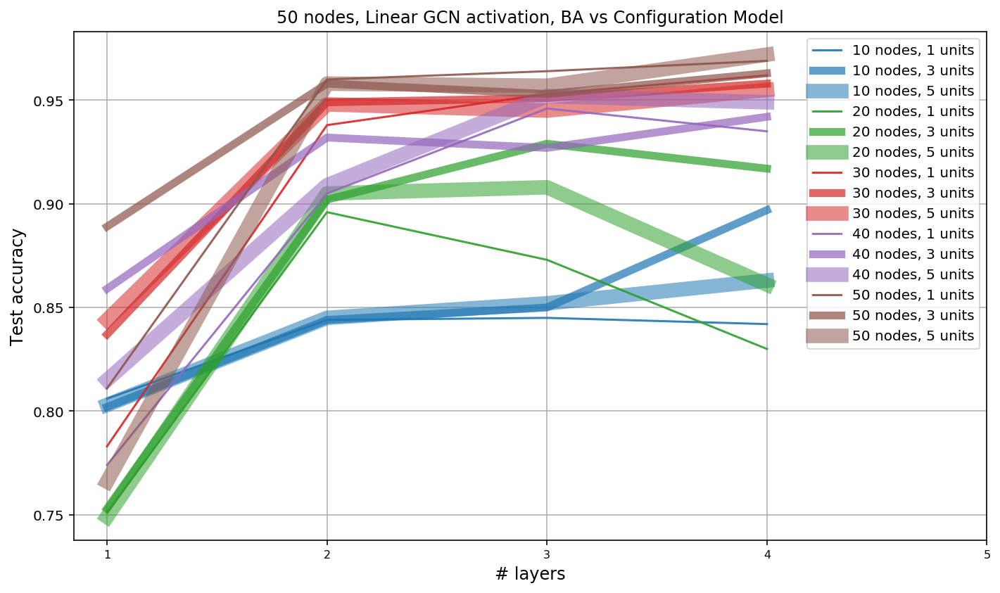

In [240]:
typ = pth.strip('/').split('/')[-1]
cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

# stl = ['-','--', ':']
figure(figsize=(10,6))
for ii,n in enumerate(n_list):
    if n==15 or n==60: continue
    results = {}
    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for i1,k in enumerate(sorted(r1)):
            plot(*r1[k][:-1].T, label = '%d nodes, %d units' %(n,k), #ls= stl[i1],#marker = '.',
                 lw=1.5*k**1.2 , alpha= 1-tanh(k/10), c= cols[ii])
        t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
        title('%d nodes, %s GCN activation, %s' %(n,a.capitalize(), t) + (', pruned' if '-trimmed' in res[0] else '') )
        xlabel('# layers', size = 12)
        ylabel('Test accuracy', size = 12)
        xticks(arange(1,6),fontsize=8)
        if ylim()[0] >0.95:
            ylim(0.95,1.01)
        legend()
        grid()
        
        tight_layout()
        
nam = config_dir+'gcn-%s-All'%(typ) + ('-trimmed' if '-trimmed' in res[0] else '')
print(nam)
savefig(nam +'.pdf')
savefig(nam +'.png', dpi=300)
        
#         show()


# plot single arch performance for various num nodes

In [232]:
columns = {v:k for k,v in enumerate(['n','layers','units','val_acc','activation'])}
full_res = []
for r in res:
    g = pk.load(open(r, 'rb'))
    
    l = [None]*len(columns)
    l[columns['n']] = int(r.split('-N')[1].split('-')[0])
    l[columns['layers']] = len(g['params']['units'])
    l[columns['activation']] = g['params']['activation']
    results.setdefault(act, {})
    l[columns['units']] = g['params']['units'][0]
    l[columns['val_acc']] = max(g['history']['val_acc'])
#     if l[columns['n']]== 20: 
#         print('hi')
#         continue
    full_res += [l]
    
full_res = array(full_res)

In [233]:
s = set(full_res[:, columns['activation']])
results = {a: np.float32(full_res[where(full_res[:, columns['activation']]==a)[0], :-1]) for a in s}

r = results['linear']
stats = {}
for l in set(r[:,columns['layers']]):
    for u in set(r[:,columns['units']]):
        ix = where((r[:,columns['layers']]==l) * (r[:,columns['units']]==u))[0]
        k = (l,u)
        stats[k] = r[ix][:,[columns['n'],columns['val_acc']]]
        #stats[k] = stats.get(k, []) + [[r[columns['n']], r[columns['val_acc']]]]


In [234]:
# full_res

../figs/expressivity/GCN/configuration_model//gcn-1-BA_leaky_relu-architecture_vs_nodes


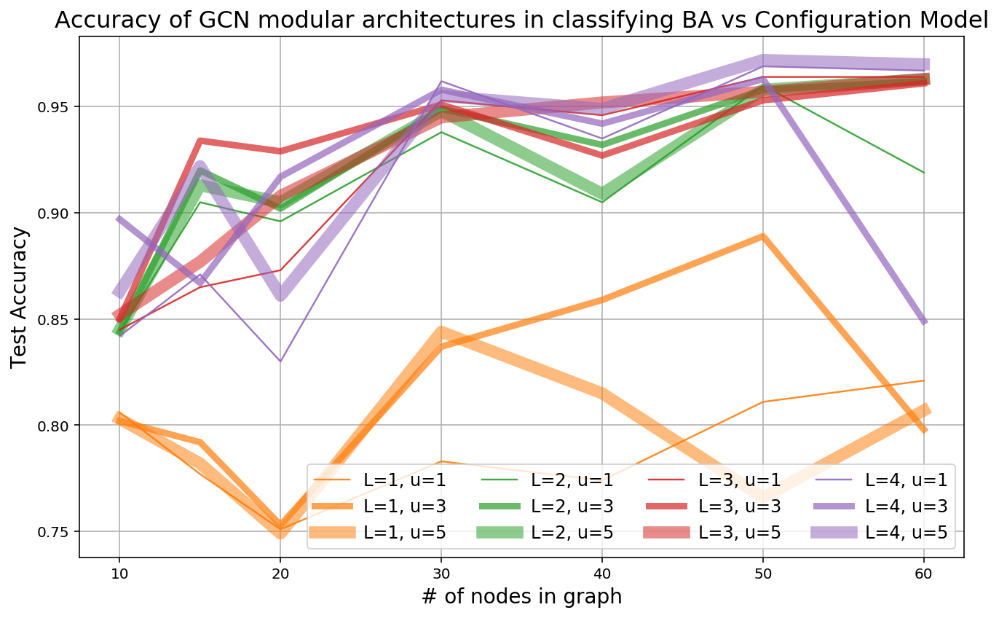

In [244]:
# type of graphs
typ = pth.strip('/').split('/')[-1] 

cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

figure(figsize=(10,6))
for k in sorted(stats):
#     print(k)
    a = array(stats[k])
    l,u = k
    if l==5: continue
    plot(*a[argsort(a[:,0])].T, label = 'L=%d, u=%d' %k, lw=1.2*u**1.2 , alpha= 1-tanh(u/10), c = cols[l])

legend(ncol = 4,fontsize=12)
# ylim(.8,1.01)
xlabel('# of nodes in graph', size = 14)    
ylabel('Test Accuracy',size = 14)

t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.strip('_leaky_relu').replace('_', ' '))
title('Accuracy of GCN modular architectures in classifying %s'%(t),size=16 )
nam = config_dir+'/gcn-1-%s-architecture_vs_nodes' %typ
print(nam)
grid()
tight_layout()

savefig(nam +'.pdf')
savefig(nam +'.png', dpi=300)

../figs/expressivity/GCN/BA_vs_ER//gcn-BA_leaky_relu-architecture_vs_nodes


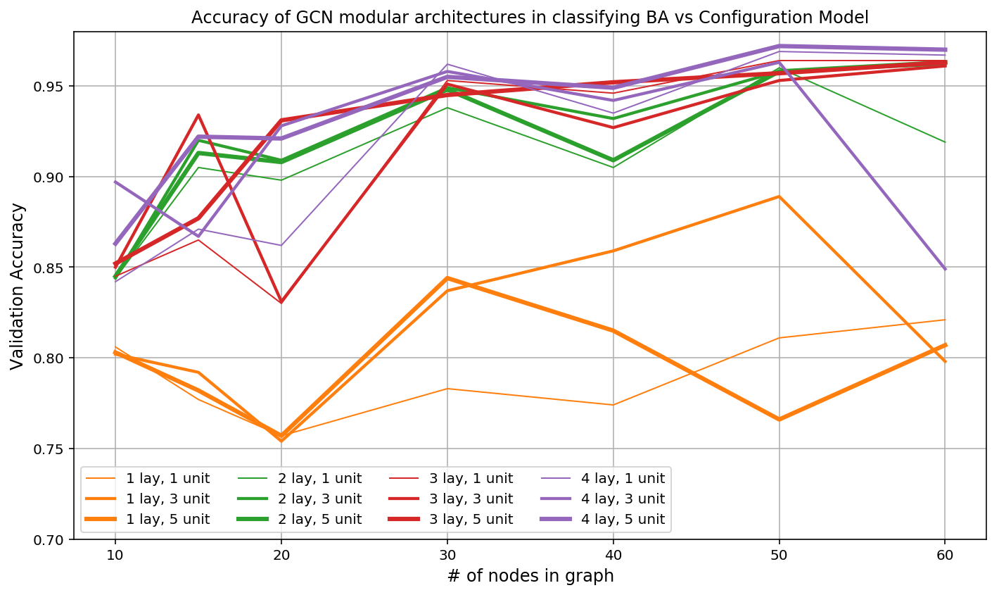

In [108]:
# type of graphs
typ = pth.strip('/').split('/')[-1] 

cols = dict(enumerate(mpl.colors.TABLEAU_COLORS))

figure(figsize=(10,6))
for k in sorted(stats):
#     print(k)
    a = array(stats[k])
    l,u = k
    if l==5: continue
    plot(*a[argsort(a[:,0])].T, label = '%d lay, %d unit' %k, lw = (u)**.7, c = cols[l])

legend(ncol = 4)
ylim(.7,0.98)
xlabel('# of nodes in graph', size = 12)    
ylabel('Validation Accuracy',size = 12)
t = ('%s vs Configuration Model' %typ.split('_')[0] if '_vs_' not in typ else typ.replace('_', ' '))
title('Accuracy of GCN modular architectures in classifying %s'%(t) )
nam = config_dir+'/gcn-%s-architecture_vs_nodes' %typ
print(nam)
grid()
tight_layout()

# savefig(nam +'.pdf')
# savefig(nam +'.png', dpi=300)

# Tensorboard

In [184]:
from keras.callbacks import TensorBoard

In [183]:
lays = 3
units = 2
units_final = 5

params = {'units': [units]*lays , 'activation': 'linear','skip':True, 
          'final_kws': {'units': units_final,'activation': 'linear'}, }
    
Adjacencies = data_config
h = np.ones(Adjacencies.shape[:2]+(1,))
labels = to_categorical(labels_config)

indices = idx

# import GraphConvNet as gcn

gcn_model = gcn.MultiGCN(input_shape= h[0].shape, **params)
    
# use leaky ReLU on the last layer
ac = gcn.layers.LeakyReLU(alpha = 0.3)(gcn_model.model.output)
# classification_layer = gcn.Dense(len(labels[0]), activation='softmax')( gcn.layers.Flatten()( ac ) )
# classification_layer = gcn.Dense(len(labels[0]), activation='softmax')( gcn.layers.Flatten()( gcn_model.model.output ) )

den1 = gcn.Dense(len(labels[0]), activation='softmax')( ac ) # has dims N x out channels must sum over N
# make layer to average over nodes
Avg_Nodes = gcn.layers.Lambda(lambda x: gcn.K.mean(x,axis = 1))
classification_layer = Avg_Nodes(den1)

model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [classification_layer] )
model.compile(optimizer='adam', loss = 'categorical_crossentropy' ,metrics=['accuracy'])

model.summary()

# gcn_model.history = gcn.EpochHistory(metrics=['acc','val_acc']) 
# gcn_model.model = model

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 50, 50)       0                                            
__________________________________________________________________________________________________
graph__operators_2 (Graph_Opera [(None, 50, 50), (No 0           input_3[0][0]                    
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 50, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 50, 2)        4           graph__operators_2[0][0]         
                                                                 input_4[0][0]                    
__________

In [185]:
from time import time

In [186]:
tenbo = TensorBoard("logs/{}".format(time()))

In [188]:
model.fit([Adjacencies, h], [labels], callbacks=[tenbo], epochs=50)

Epoch 1/50
5000/5000 [==============================] - 1s 256us/step - loss: 0.7431 - acc: 0.7132
Epoch 2/50
5000/5000 [==============================] - 1s 183us/step - loss: 0.4741 - acc: 0.7710
Epoch 3/50
5000/5000 [==============================] - 1s 240us/step - loss: 0.4663 - acc: 0.7810
Epoch 4/50
5000/5000 [==============================] - 1s 207us/step - loss: 0.4602 - acc: 0.7796
Epoch 5/50
5000/5000 [==============================] - 1s 203us/step - loss: 0.4461 - acc: 0.7844
Epoch 6/50
5000/5000 [==============================] - 1s 286us/step - loss: 0.4311 - acc: 0.7858
Epoch 7/50
5000/5000 [==============================] - 1s 225us/step - loss: 0.4127 - acc: 0.7970
Epoch 8/50
5000/5000 [==============================] - 1s 270us/step - loss: 0.3913 - acc: 0.7958
Epoch 9/50
5000/5000 [==============================] - 1s 184us/step - loss: 0.3619 - acc: 0.8072
Epoch 10/50
5000/5000 [==============================] - 1s 261us/step - loss: 0.3322 - acc: 0.8478
Epoch 11/

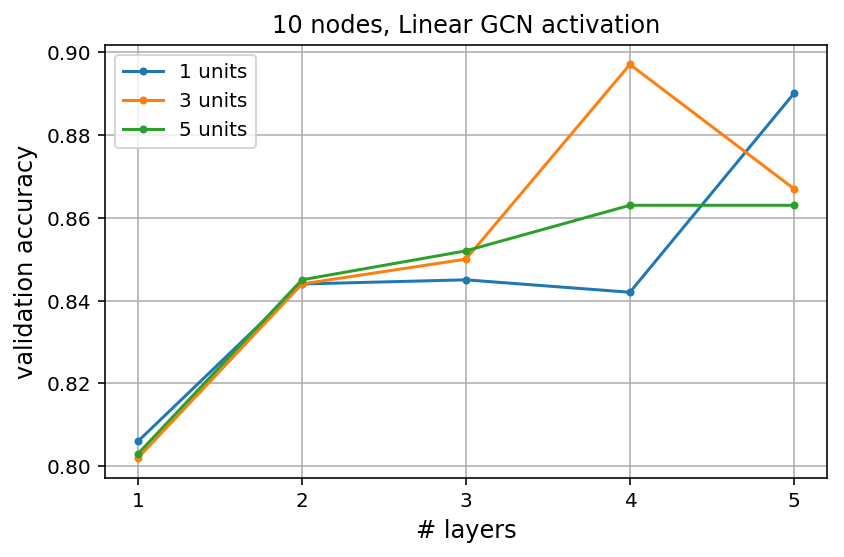

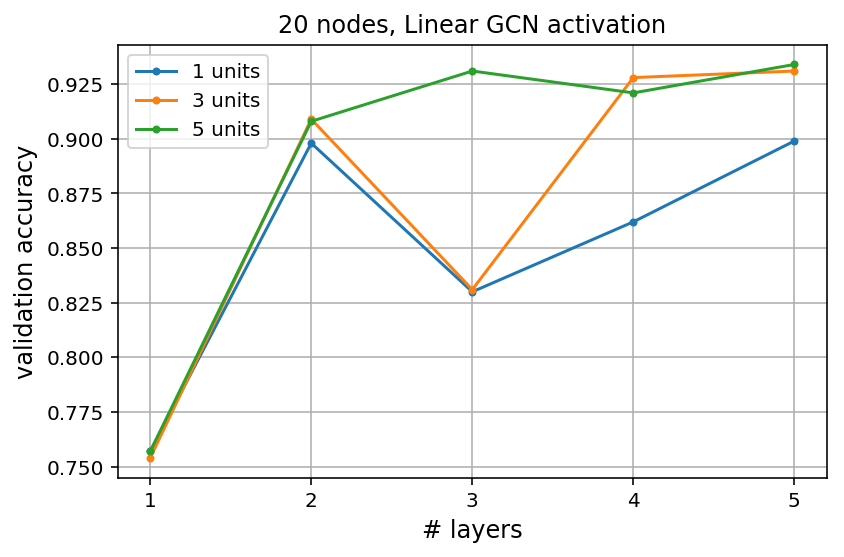

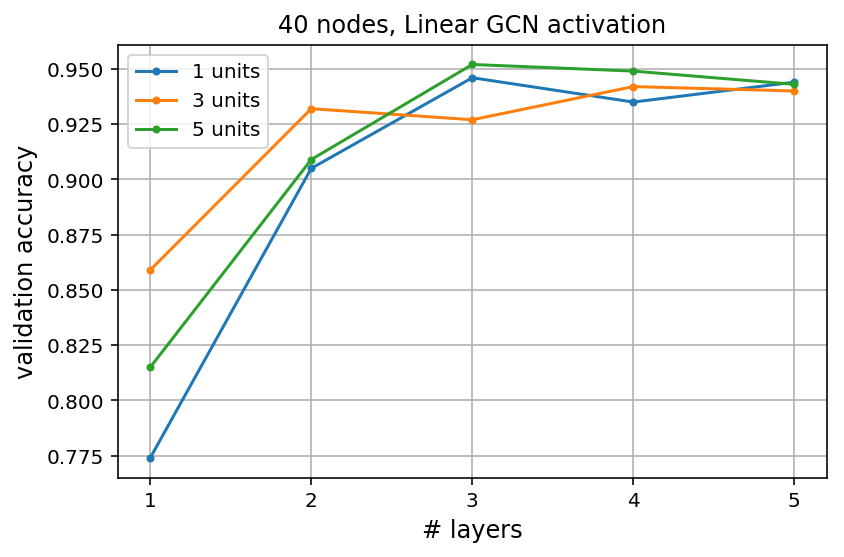

In [178]:
typ = pth.strip('/').split('/')[-1]

for n in [10,20,40]:
    
    results = {}
    
    for r in res:
        if int(r.split('-N')[1].split('-')[0]) != n:
            continue
    #     print(r)
        g = pk.load(open(r, 'rb'))
        n_lay = len(g['params']['units'])
        act = g['params']['activation']
        results.setdefault(act, {})
        u = g['params']['units'][0]
        results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]


    for a in results:
        r1 = results[a]
        results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}
        
    for a in results:
        r1 = results[a]
        for k in sorted(r1):
            plot(*r1[k].T, label = '%d units' %k, marker = '.')
        title('%d nodes, %s GCN activation' %(n,a.capitalize()) + (', pruned' if '-trimmed' in res[0] else '') )
        xlabel('# layers', size = 12)
        ylabel('validation accuracy', size = 12)
        xticks(arange(1,6))
    #     ylim(0.5,1)
        legend()
        grid()
        
        tight_layout()
#         savefig('../figs/expressivity/GCN/gcn-config-%s-N%d'%(typ,n) + ('-trimmed' if '-trimmed' in res[0] else '') +'.pdf')
#         savefig('../figs/expressivity/GCN/gcn-config-%s-N%d'%(typ,n) + ('-trimmed' if '-trimmed' in res[0] else '') +'.png', dpi=300)
        
        show()


In [53]:
'../figs/expressivity/GCN/gcn-config-%s-N%d'%(typ,n) + ('-trimmed' if '-trimmed' in res[0] else '') +'.pdf'

'../figs/expressivity/GCN/gcn-config-BA_leaky_relu-N10.pdf'

In [34]:
g['params']

{'units': [3, 3, 3, 3],
 'activation': 'linear',
 'skip': True,
 'GCN_kws': {'activation': 'linear'},
 'dense_kws': {'activation': 'linear'}}

In [35]:
# n = 40
results = {}

for r in res:
    if int(r.split('-N')[1].split('-')[0]) != n:
        continue
#     print(r)
    g = pk.load(open(r, 'rb'))
    n_lay = len(g['params']['units'])
    act = g['params']['activation']
    results.setdefault(act, {})
    u = g['params']['units'][0]
    results[act][u] = results[act].get(u,[]) +[[n_lay,max(g['history']['val_acc'])]]
    

for a in results:
    r1 = results[a]
    results[a] = {k: array(results[a][k])[argsort(array(results[a][k])[:,0])] for k in results[a]}

../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn_model-N40-gcn[units[5]-activation_linear]-final[units_10]-skip1.pkl
../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn_model-N40-gcn[units[5, 5]-activation_linear]-final[units_10]-skip1.pkl
../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn_model-N40-gcn[units[3, 3, 3, 3, 3]-activation_linear]-final[units_10]-skip1.pkl
../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn_model-N40-gcn[units[1, 1]-activation_linear]-final[units_10]-skip1.pkl
../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn_model-N40-gcn[units[1, 1, 1, 1]-activation_linear]-final[units_10]-skip1.pkl
../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn_model-N40-gcn[units[5, 5, 5, 5]-activation_linear]-final[units_10]-skip1.pkl
../experiments/gcn_classification_grid_2_no_flatten/BA_leaky_relu/gcn_model-N40-gcn[units[1, 1, 1, 1, 1]-activation_linear]-final[units_

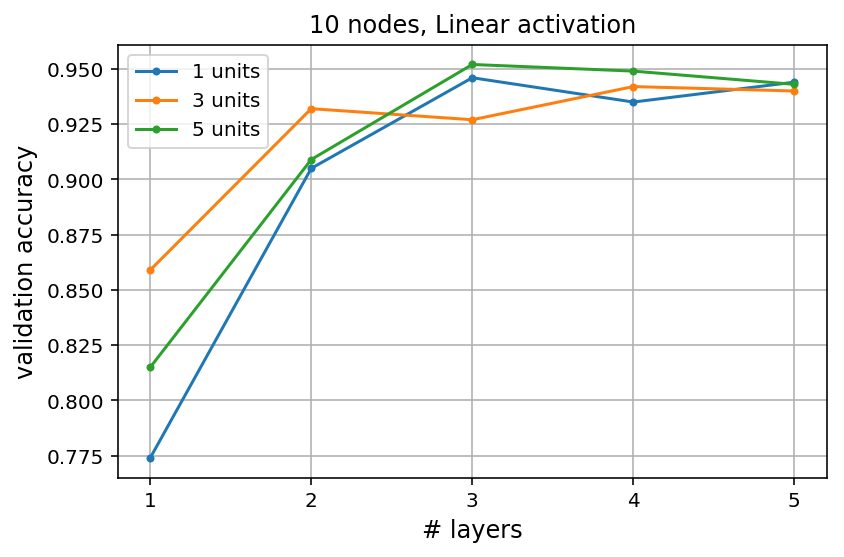

In [41]:
for a in results:
    r1 = results[a]
    for k in sorted(r1):
        plot(*r1[k].T, label = '%d units' %k, marker = '.')
    title('%d nodes, %s activation' %(n,a.capitalize()) )
    xlabel('# layers', size = 12)
    ylabel('validation accuracy', size = 12)
    xticks(arange(1,6))
#     ylim(0.5,1)
    legend()
    grid()
    tight_layout()
    show()
    

In [155]:
str.capitalize(act)

'Linear'

In [119]:
lays = 3
units = 2
units_final = 5

params = {'units': [units]*lays , 'activation': 'linear','skip':True, 
          'final_kws': {'units': units_final,'activation': 'linear'}, }
    
Adjacencies = data_config

labels = labels_config

indices = idx

# import GraphConvNet as gcn

gcn_model = gcn.MultiGCN(input_shape= h[0].shape, **params)
    
# gcn_model.model.summary()

d1 = gcn.Dense(2, activation='softmax')( gcn.layers.Flatten()( gcn_model.model.output ) )

{'units': 5, 'activation': 'linear'} Tensor("concatenate_8/concat:0", shape=(?, 10, 9), dtype=float32)


In [120]:
d2 = gcn.Dense(2, activation='softmax')( ( gcn_model.model.output ) )

In [121]:
leak = gcn.layers.LeakyReLU(alpha = 0.3)
ac = leak(gcn_model.model.output)
d1 = gcn.Dense(2, activation='softmax')( ( ac ) )


In [124]:
d1

<tf.Tensor 'dense_13/truediv:0' shape=(?, 10, 2) dtype=float32>

Is there any way we could sum this tensor over it's second index instead of third? 


In [138]:
la = gcn.layers.Lambda(lambda x: gcn.K.mean(x,axis = 1))

In [139]:
d2 = la(d1)

In [140]:
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d2] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 10, 10)       0                                            
__________________________________________________________________________________________________
graph__operators_2 (Graph_Opera [(None, 10, 10), (No 0           input_3[0][0]                    
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 10, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 10, 2)        4           graph__operators_2[0][0]         
                                                                 input_4[0][0]                    
__________

In [90]:
leak = gcn.layers.LeakyReLU(alpha = 0.3)
ac = leak(gcn_model.model.output)
d1 = gcn.Dense(2, activation='softmax')( gcn.layers.Flatten()( ac ) )

In [91]:
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_1 (Graph_Opera [(None, 40, 40), (No 0           input_1[0][0]                    
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 2)        4           graph__operators_1[0][0]         
                                                                 input_2[0][0]                    
__________

In [34]:

lays = 3
units = 2
units_final = 5

params = {'units': [units]*lays , 'activation': 'linear','skip':True, 
          'final_kws': {'units': units_final,'activation': 'relu'}, }
    
Adjacencies = data_config

labels = labels_config

indices = idx

# import GraphConvNet as gcn

gcn_model = gcn.MultiGCN(input_shape= h[0].shape, **params)
    

# gcn_model.model.summary()

d1 = gcn.Dense(2, activation='softmax')( gcn.layers.Flatten()( gcn_model.model.output ) )
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()

ephist = gcn.EpochHistory(metrics=['acc','val_acc'])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_3 (Graph_Opera [(None, 40, 40), (No 0           input_5[0][0]                    
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 2)        4           graph__operators_3[0][0]         
                                                                 input_6[0][0]                    
__________

In [35]:
gcn_model.

{'activation': 'linear'}

In [17]:

params = {'layers': 1, 'units': 2, 'bias': True, 'activation': 'linear'}
    
units = [params['units']] * params['layers']
units_final = 5
Adjacencies = data_config

labels = labels_config

indices = idx

# import GraphConvNet as gcn

gcn_model = gcn.MultiGCN(input_shape= h[0].shape, units = units,
                         activation = params['activation'], skip = True, 
                         final_kws= {'units': units_final,'activation': 'relu'}, 
                     dense_kws={'use_bias':params['bias']},
                       GCN_kws={'use_bias':params['bias']},
                        )
    

# gcn_model.model.summary()

den = gcn.Dense(2, activation='softmax')
d1 = den( gcn.layers.Flatten()( gcn_model.model.output ) )
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()

ephist = gcn.EpochHistory(metrics=['acc','val_acc'])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_2 (Graph_Opera [(None, 40, 40), (No 0           input_3[0][0]                    
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 2)        4           graph__operators_2[0][0]         
                                                                 input_4[0][0]                    
__________

In [18]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2,
                    callbacks=[ephist], verbose=False )

Ep: 0	acc: 0.4958	val_acc: 0.506	loss: 0.9913	val_loss: 0.7901
Ep: 10	acc: 0.7863	val_acc: 0.741	loss: 0.4217	val_loss: 0.4559
Ep: 20	acc: 0.808	val_acc: 0.761	loss: 0.3486	val_loss: 0.3786
Ep: 30	acc: 0.8097	val_acc: 0.762	loss: 0.325	val_loss: 0.346
Ep: 40	acc: 0.8435	val_acc: 0.782	loss: 0.2989	val_loss: 0.3186
Ep: 50	acc: 0.8662	val_acc: 0.841	loss: 0.2652	val_loss: 0.2767
Ep: 60	acc: 0.8738	val_acc: 0.853	loss: 0.2507	val_loss: 0.2591
Ep: 70	acc: 0.879	val_acc: 0.853	loss: 0.2421	val_loss: 0.254
Ep: 80	acc: 0.881	val_acc: 0.848	loss: 0.2367	val_loss: 0.249
Ep: 90	acc: 0.88	val_acc: 0.847	loss: 0.2353	val_loss: 0.2544


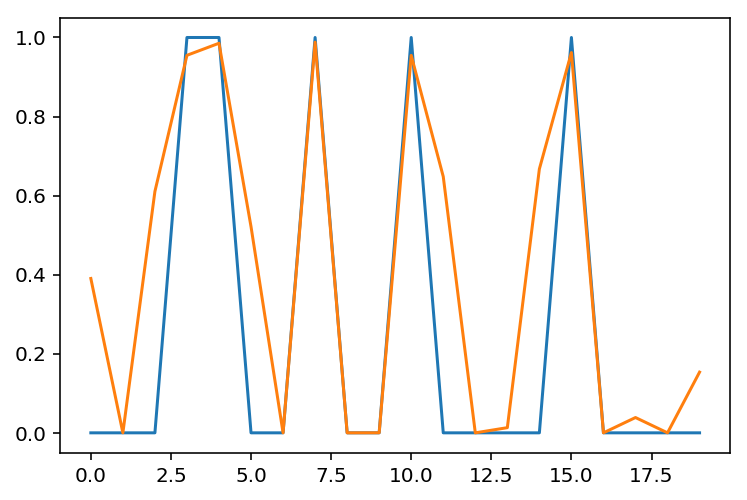

In [81]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

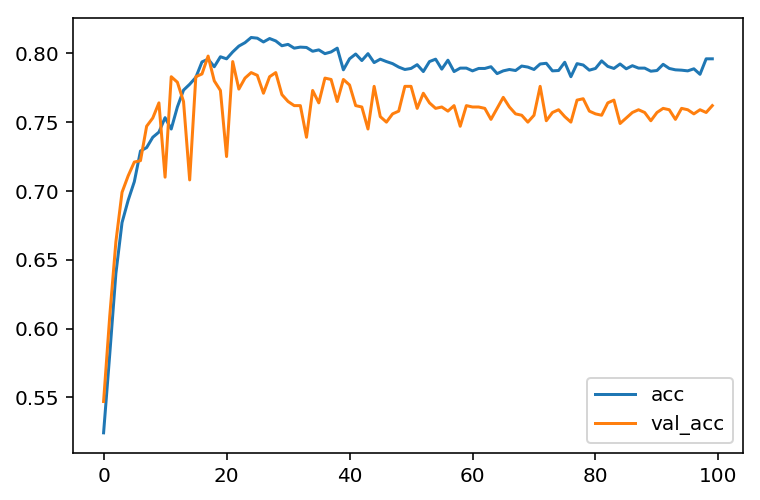

In [82]:
for k in ['acc', 'val_acc']:
    plot(ephist.history[k], label = k)
    
legend()

# more layers

In [83]:

params = {'layers': 3, 'units': 2, 'bias': True, 'activation': 'linear'}
    
units = [params['units']] * params['layers']
units_final = 5
Adjacencies = data_config

labels = labels_config

indices = idx

# import GraphConvNet as gcn

gcn_model = gcn.MultiGCN(input_shape= h[0].shape, units = units, 
                         output_shape= (Adjacencies.shape[1], units_final ) , # fix bug to allow units for final
                         activation = params['activation'], skip = True, 
                         final_kws= {'activation': 'relu'}, 
                     dense_kws={'use_bias':params['bias']},
                       GCN_kws={'use_bias':params['bias']},
                        )
    

# gcn_model.model.summary()

den = gcn.Dense(2, activation='softmax')
d1 = den( gcn.layers.Flatten()( gcn_model.model.output ) )
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()

ephist = gcn.EpochHistory(metrics=['acc','val_acc'])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_9 (Graph_Opera [(None, 40, 40), (No 0           input_17[0][0]                   
__________________________________________________________________________________________________
input_18 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 2)        4           graph__operators_9[0][0]         
                                                                 input_18[0][0]                   
__________

In [87]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2,
                    callbacks=[ephist], verbose=False )

Ep: 0	acc: 0.948	val_acc: 0.938	loss: 0.1207	val_loss: 0.1568
Ep: 10	acc: 0.953	val_acc: 0.946	loss: 0.09659	val_loss: 0.1302
Ep: 20	acc: 0.9523	val_acc: 0.953	loss: 0.09875	val_loss: 0.1025
Ep: 30	acc: 0.9497	val_acc: 0.95	loss: 0.1053	val_loss: 0.1026
Ep: 40	acc: 0.9613	val_acc: 0.941	loss: 0.08733	val_loss: 0.1345
Ep: 50	acc: 0.9603	val_acc: 0.955	loss: 0.09116	val_loss: 0.09485
Ep: 60	acc: 0.9595	val_acc: 0.951	loss: 0.09164	val_loss: 0.1053
Ep: 70	acc: 0.951	val_acc: 0.937	loss: 0.1128	val_loss: 0.1407
Ep: 80	acc: 0.9463	val_acc: 0.952	loss: 0.128	val_loss: 0.1048
Ep: 90	acc: 0.9613	val_acc: 0.939	loss: 0.08422	val_loss: 0.1639


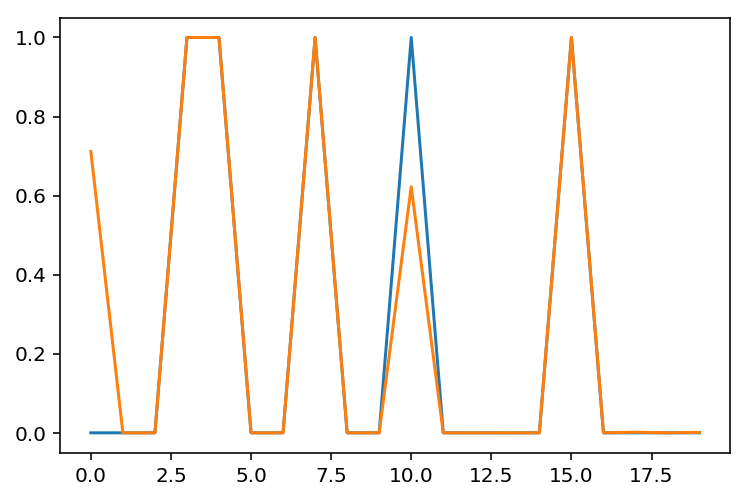

In [88]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

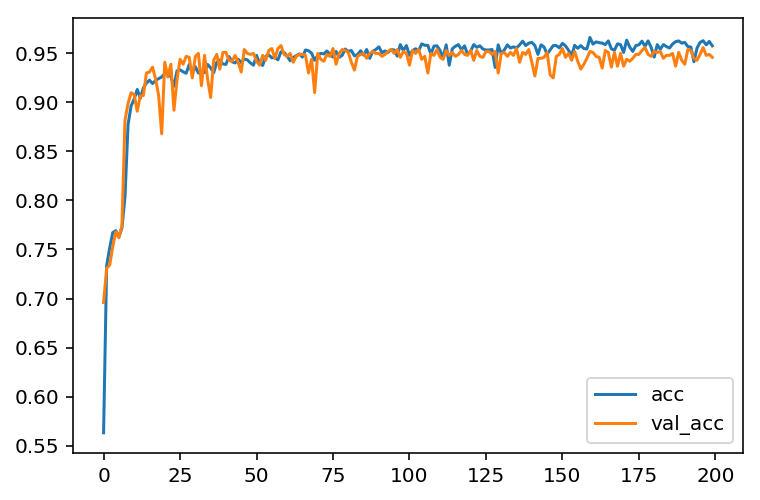

In [89]:
for k in ['acc', 'val_acc']:
    plot(ephist.history[k], label = k)
    
legend()

### nonlinear

In [90]:

params = {'layers': 3, 'units': 2, 'bias': True, 'activation': 'tanh'}
    
units = [params['units']] * params['layers']
units_final = 5
Adjacencies = data_config

labels = labels_config

indices = idx

# import GraphConvNet as gcn

gcn_model = gcn.MultiGCN(input_shape= h[0].shape, units = units, 
                         output_shape= (Adjacencies.shape[1], units_final ) , # fix bug to allow units for final
                         activation = params['activation'], skip = True, 
                         final_kws= {'activation': 'relu'}, 
                     dense_kws={'use_bias':params['bias']},
                       GCN_kws={'use_bias':params['bias']},
                        )
    

# gcn_model.model.summary()

den = gcn.Dense(2, activation='softmax')
d1 = den( gcn.layers.Flatten()( gcn_model.model.output ) )
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()

ephist = gcn.EpochHistory(metrics=['acc','val_acc'])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_10 (Graph_Oper [(None, 40, 40), (No 0           input_19[0][0]                   
__________________________________________________________________________________________________
input_20 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 2)        4           graph__operators_10[0][0]        
                                                                 input_20[0][0]                   
__________

In [94]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2,
                    callbacks=[ephist], verbose=False )

Ep: 0	acc: 0.9475	val_acc: 0.949	loss: 0.1068	val_loss: 0.1161
Ep: 10	acc: 0.943	val_acc: 0.942	loss: 0.1283	val_loss: 0.1407
Ep: 20	acc: 0.9507	val_acc: 0.949	loss: 0.1055	val_loss: 0.1068
Ep: 30	acc: 0.9443	val_acc: 0.945	loss: 0.1204	val_loss: 0.1333
Ep: 40	acc: 0.9535	val_acc: 0.95	loss: 0.1036	val_loss: 0.1013
Ep: 50	acc: 0.941	val_acc: 0.953	loss: 0.1425	val_loss: 0.1015
Ep: 60	acc: 0.9517	val_acc: 0.951	loss: 0.1059	val_loss: 0.1131
Ep: 70	acc: 0.951	val_acc: 0.955	loss: 0.1069	val_loss: 0.1002
Ep: 80	acc: 0.9527	val_acc: 0.943	loss: 0.1071	val_loss: 0.1297
Ep: 90	acc: 0.953	val_acc: 0.914	loss: 0.09909	val_loss: 0.1839


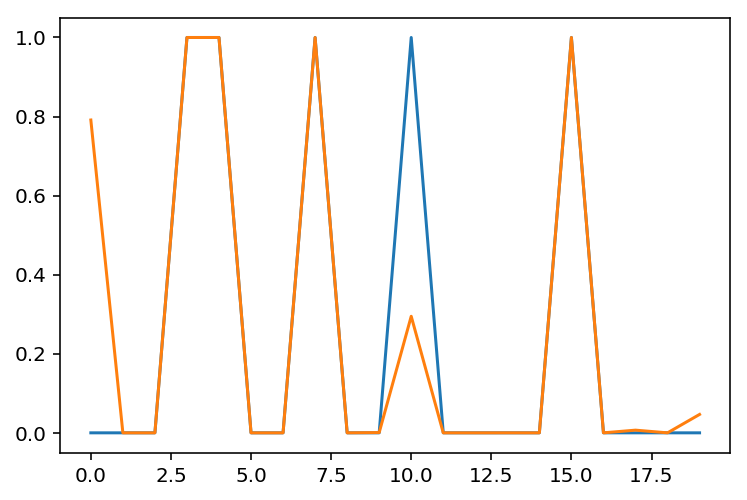

In [95]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

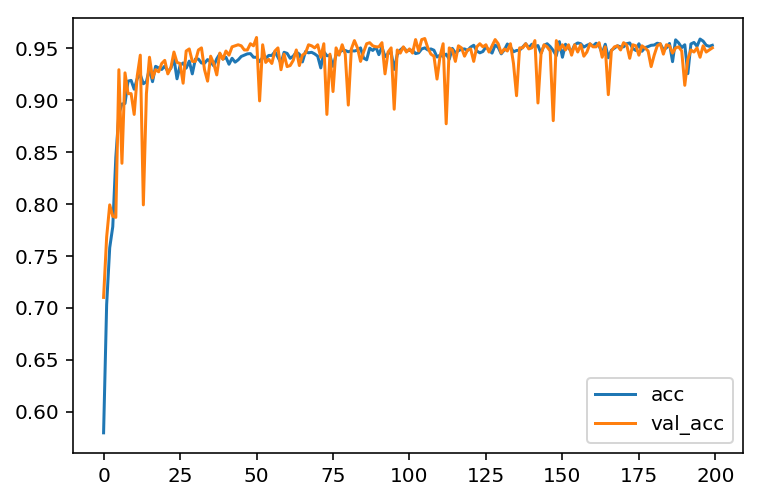

In [96]:
for k in ['acc', 'val_acc']:
    plot(ephist.history[k], label = k)
    
legend()

# Run batch tests
1. num nodes
2. depth
3. width
4. BA, ER  

in the meantime, work on making SBM

# ER vs BA Classification

In [12]:
n_nodes = 20
num_samples = int(2e3)
num_params = 1

num_in_group = num_samples//(2*num_params)

label_classes = ['BA', 'ER']

params = {'BA' : int0(linspace(1,n_nodes/2, num_params)),
          'ER' : linspace(0.5/n_nodes, 0.5, num_params)}

Adj = {'BA' : concatenate([make_BA_dataset(num_in_group, n_nodes, m) for m in params['BA']], axis = 0),
       'ER' : concatenate([make_ER_dataset(num_in_group, n_nodes, p) for p in params['ER']], axis = 0)}

Adj_all = concatenate((Adj['BA'], Adj['ER']), axis = 0)

params_all = []
for i,k in enumerate(label_classes):
    for p in params[k]:
        params_all += [[i,p]]*num_in_group

idx = argsort(rand(len(Adj_all)))
assert len(params_all)==len(Adj_all), "Labels and data don't have the same length!"

A2 = gcn.mat_pow_batch(Adj_all,2)
A3 = gcn.mat_pow_batch(Adj_all,3)

moments = {1 : Adj_all.sum(-1, keepdims=1), 
           2 : A2.sum(-1, keepdims=1),
           3: A3.sum(-1, keepdims=1),
          }

h = np.ones_like(moments[1])

In [13]:
# params_all
Adj_all[0].sum(), Adj_all[-1].sum()

(38.0, 6.0)

# Naive test
we have a dataset of ER and BA where the number of links is vastly different. The neural net should be able to quickly exploit this and distinguish between the two. 

In [25]:

params = {'layers': 1, 'units': 1, 'bias': True, 'activation': 'linear'}
    
units = [params['units']] * params['layers']
units_final = 5
Adjacencies = Adj_all

labels = array(params_all)[:,0]

indices = idx

# import GraphConvNet as gcn
gcn_model = gcn.MultiGCN(input_shape= moments[1][0].shape, units = units, 
                         output_shape= (Adj_all.shape[1], units_final ) , # fix bug to allow units for final
                         activation = params['activation'], skip = True, 
                         final_kwargs= {'activation': 'relu'}, 
                     dense_kws={'use_bias':params['bias']},
                       GCN_kws={'use_bias':params['bias']},
                        )
    


In [26]:
gcn_model.model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 20, 20)       0                                            
__________________________________________________________________________________________________
graph__operators_3 (Graph_Opera [(None, 20, 20), (No 0           input_5[0][0]                    
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 20, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 20, 1)        2           graph__operators_3[0][0]         
                                                                 input_6[0][0]                    
__________

In [27]:
gcn_model.model.inputs

[<tf.Tensor 'input_5:0' shape=(?, 20, 20) dtype=float32>,
 <tf.Tensor 'input_6:0' shape=(?, 20, 1) dtype=float32>]

In [52]:
gcn_model.model.output

<tf.Tensor 'dense_7/Relu:0' shape=(?, 20, 5) dtype=float32>

In [95]:
den = gcn.Dense(2, activation='softmax')
d1 = den( gcn.layers.Flatten()( gcn_model.model.output ) )
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )

In [97]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 20, 20)       0                                            
__________________________________________________________________________________________________
graph__operators_3 (Graph_Opera [(None, 20, 20), (No 0           input_5[0][0]                    
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 20, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 20, 1)        2           graph__operators_3[0][0]         
                                                                 input_6[0][0]                    
__________

In [98]:
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

In [99]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2 )

Train on 1600 samples, validate on 400 samples
Epoch 1/100
1600/1600 [==============================] - 0s 257us/step - loss: 0.2859 - acc: 0.9075 - val_loss: 0.1155 - val_acc: 0.9775
Epoch 2/100
1600/1600 [==============================] - 0s 81us/step - loss: 0.0599 - acc: 0.9906 - val_loss: 0.0396 - val_acc: 0.9975
Epoch 3/100
1600/1600 [==============================] - 0s 80us/step - loss: 0.0253 - acc: 0.9969 - val_loss: 0.0194 - val_acc: 1.0000
Epoch 4/100
1600/1600 [==============================] - 0s 81us/step - loss: 0.0142 - acc: 0.9988 - val_loss: 0.0117 - val_acc: 1.0000
Epoch 5/100
1600/1600 [==============================] - 0s 99us/step - loss: 0.0092 - acc: 0.9994 - val_loss: 0.0077 - val_acc: 1.0000
Epoch 6/100
1600/1600 [==============================] - 0s 99us/step - loss: 0.0065 - acc: 1.0000 - val_loss: 0.0056 - val_acc: 1.0000
Epoch 7/100
1600/1600 [==============================] - 0s 81us/step - loss: 0.0048 - acc: 1.0000 - val_loss: 0.0042 - val_acc: 1.0000


KeyboardInterrupt: 

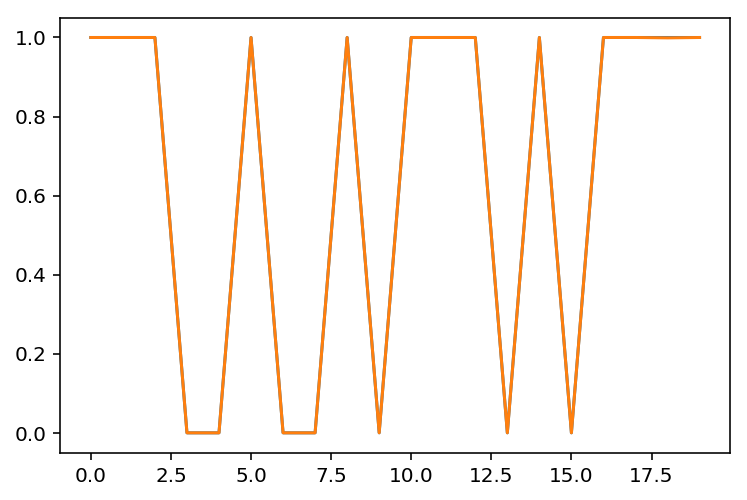

In [112]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

In [90]:
den = gcn.Dense(2, activation='softmax')
d1 = den( gcn_model.model.layers[-2].output )
model2 = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )

In [91]:
model2.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 20, 20)       0                                            
__________________________________________________________________________________________________
graph__operators_3 (Graph_Opera [(None, 20, 20), (No 0           input_5[0][0]                    
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 20, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 20, 1)        2           graph__operators_3[0][0]         
                                                                 input_6[0][0]                    
__________

In [92]:
model2.compile(optimizer='adam', loss ='categorical_crossentropy', metrics=['accuracy'])

In [93]:
moments[1].mean()

1.18155

In [ ]:
history = model2.fit([Adjacencies[indices], h[indices]],to_categorical(1.* (moments[1][indices] >2 ))
                     , epochs= 100, validation_split=0.2 )

In [ ]:

gcn_model.train([ Adjacencies[indices], h[indices]],[labels[indices]],epochs= EP_SPLIT)
gcn_model.save(SAVE_PATH + 'gcn_model_Lay%d-units%d-moment%d-Act_%s-bias%d.pkl' %(params['layers'], params['units'], 
                        params['moment'], params['activation'], params['bias']))


# Exploits
The naive test works, most likely by exploiting the number of links or pattern of and order of nodes. 
For instance, in all the BA, the higher degree nodes are likely to come first. If the order is what is being exploited, if we shuffle the order of the nodes it should become more difficult for the network. 
Also, if it is a pattern in the number links, we should shuffle the links, or make ER with the same density and check the performance. 

## Shuffiling node order

In [162]:
for m in range(1,8):
    a = make_BA_dataset(1,n_nodes,m=m)[0]
    
    f = lambda n,m: (n-m)*m  #+ (m*(m+1))/2 
#     print(2*(a.sum()/2- f(n_nodes, m))/m/(m-1+1e-8))
    print(a.sum()/2- f(n_nodes,m))
    
    b = make_ER_dataset(1,n_nodes, p = f(n_nodes, m)/ (n_nodes**2 - n_nodes) *2 )[0]
    print(a.sum(), b.sum())
####

0.0
38.0 34.0
0.0
72.0 70.0
0.0
102.0 118.0
0.0
128.0 140.0
0.0
150.0 138.0
0.0
168.0 152.0
0.0
182.0 150.0


## !!!!! NetworkX implementation of BA has only (n-m)*m links !!!!

scaling of error with size number of modules
graoh eigenvalues
size of the netwok, graph, depth, width of modules hudden units

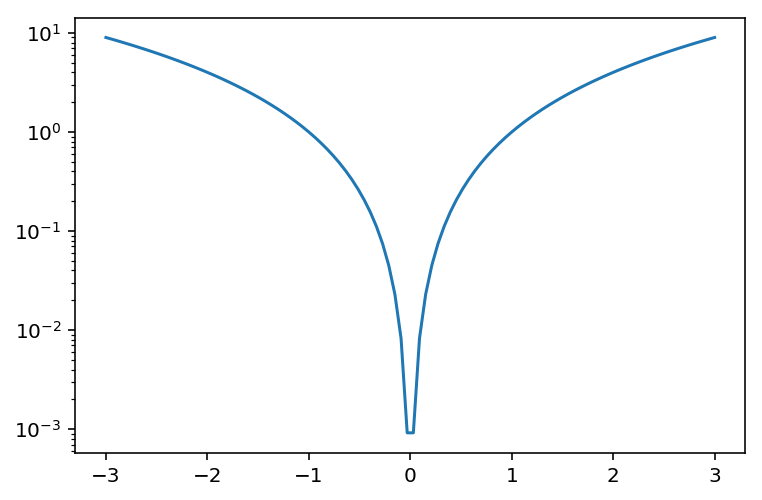

In [338]:
x = linspace(-3,3,100)
plot(x,x**2)
yscale('log')

In [248]:
n_nodes = 40

m = 3

num_samples = int(4e3)
num_params = 1

num_in_group = num_samples//(2*num_params)

label_classes = ['BA', 'ER']

f = lambda n,m: (n-m)*m  #+ (m*(m+1))/2 

params = {'BA' : [m], #int0(linspace(1,n_nodes/2, num_params)),
          'ER' : [f(n_nodes, m)/ (n_nodes**2 - n_nodes) * 2] #linspace(0.5/n_nodes, 0.5, num_params)
         }

Adj = {'BA' : concatenate([make_BA_dataset(num_in_group, n_nodes, m) for m in params['BA']], axis = 0),
       'ER' : concatenate([make_ER_dataset(num_in_group, n_nodes, p) for p in params['ER']], axis = 0)}

Adj_all = concatenate((Adj['BA'], Adj['ER']), axis = 0)

params_all = []
for i,k in enumerate(label_classes):
    for p in params[k]:
        params_all += [[i,p]]*num_in_group

idx = argsort(rand(len(Adj_all)))
assert len(params_all)==len(Adj_all), "Labels and data don't have the same length!"

A2 = gcn.mat_pow_batch(Adj_all,2)
A3 = gcn.mat_pow_batch(Adj_all,3)

moments = {1 : Adj_all.sum(-1, keepdims=1), 
           2 : A2.sum(-1, keepdims=1),
           3: A3.sum(-1, keepdims=1),
          }

h = np.ones_like(moments[1])

In [249]:
Adj_nodes_shuffled = np.empty_like(Adj_all)
for i,a in enumerate(Adj_all):
    # get random order
    r = argsort(rand(len(a)))
    Adj_nodes_shuffled[i] = a[r][:,r]

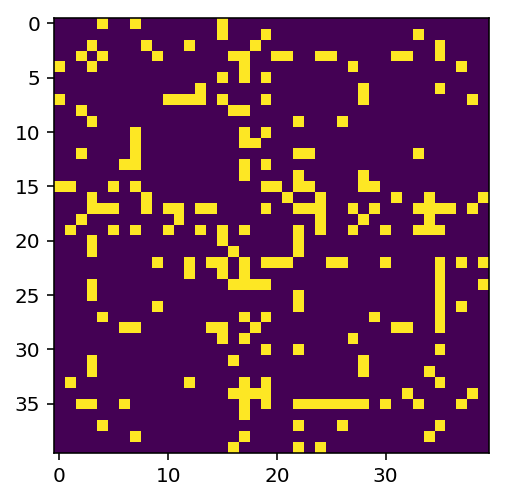

In [250]:
imshow(Adj_nodes_shuffled[0])

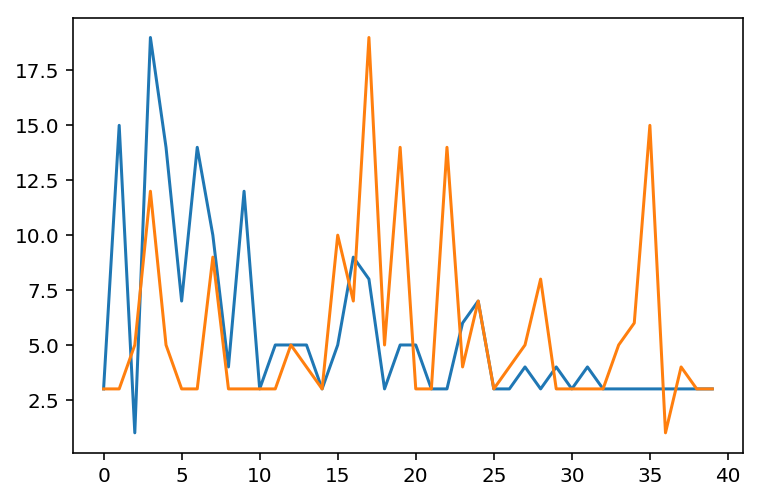

In [251]:
plot(Adj_all[0].sum(0))
plot(Adj_nodes_shuffled[0].sum(0))


In [252]:

params = {'layers': 1, 'units': 1, 'bias': True, 'activation': 'linear'}
    
units = [params['units']] * params['layers']
units_final = 5
Adjacencies = Adj_nodes_shuffled

labels = array(params_all)[:,0]

indices = idx

# import GraphConvNet as gcn
gcn_model = gcn.MultiGCN(input_shape= moments[1][0].shape, units = units, 
                         output_shape= (Adjacencies.shape[1], units_final ) , # fix bug to allow units for final
                         activation = params['activation'], skip = True, 
                         final_kwargs= {'activation': 'relu'}, 
                     dense_kws={'use_bias':params['bias']},
                       GCN_kws={'use_bias':params['bias']},
                        )
    

gcn_model.model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_8 (Graph_Opera [(None, 40, 40), (No 0           input_15[0][0]                   
__________________________________________________________________________________________________
input_16 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 1)        2           graph__operators_8[0][0]         
                                                                 input_16[0][0]                   
__________

## Classification model

In [253]:
den = gcn.Dense(2, activation='softmax')
d1 = den( gcn.layers.Flatten()( gcn_model.model.output ) )
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_8 (Graph_Opera [(None, 40, 40), (No 0           input_15[0][0]                   
__________________________________________________________________________________________________
input_16 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 1)        2           graph__operators_8[0][0]         
                                                                 input_16[0][0]                   
__________

In [ ]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2 )

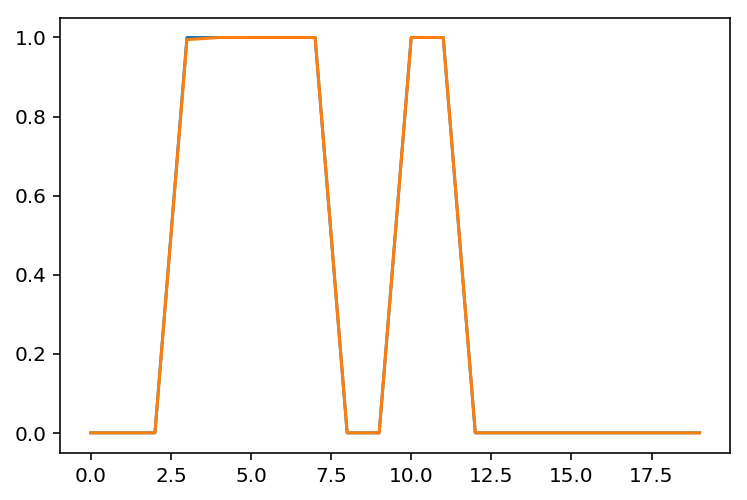

In [257]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

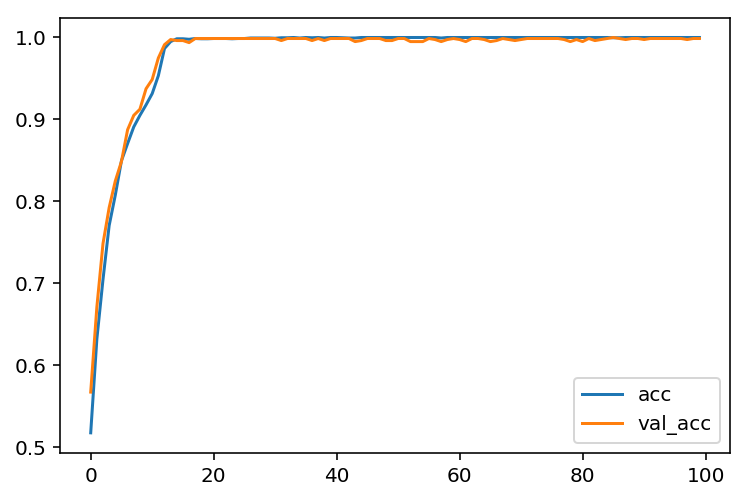

In [258]:
for k in ['acc', 'val_acc']:
    plot(history.history[k], label = k)
    
legend()

In [259]:
w,b = model.layers[-1].get_weights()

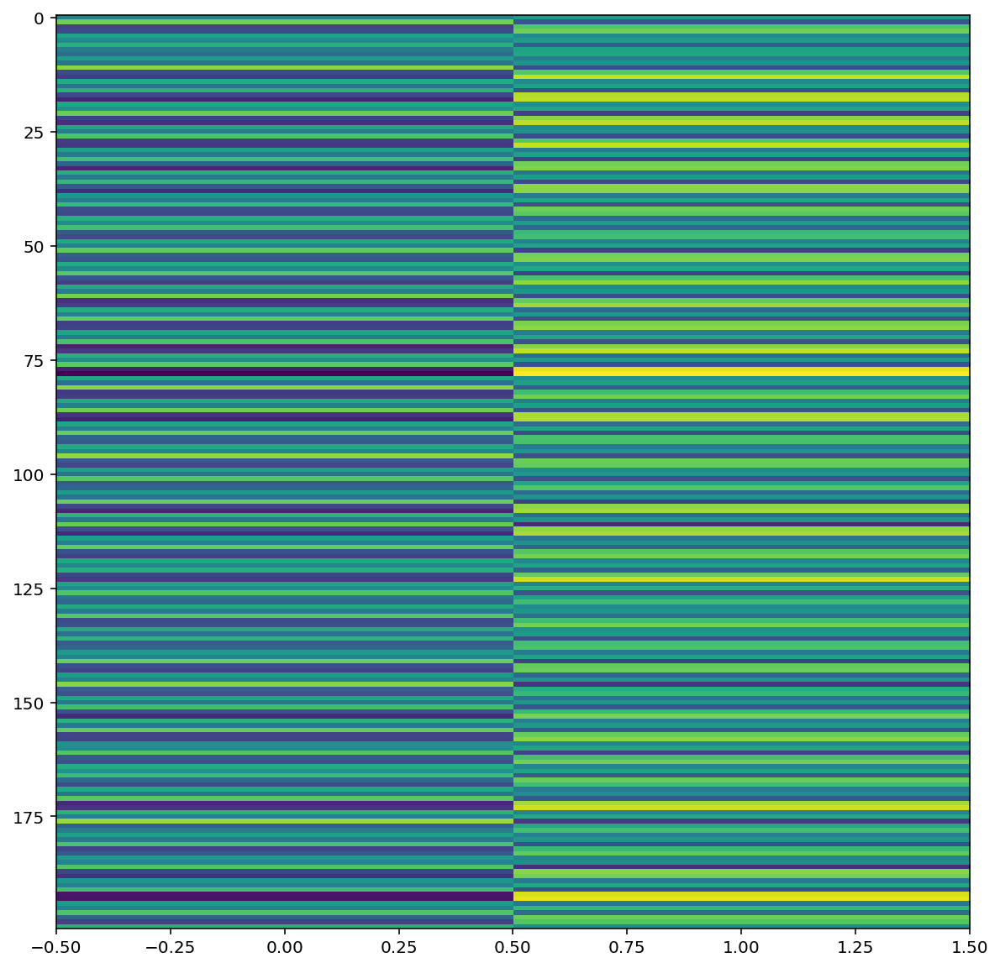

In [260]:
figure(figsize = (10,10))
imshow(w, aspect = 0.01)

In [261]:
w.shape

(200, 2)

In [262]:
w0 = w[:,0].reshape((n_nodes,units_final))

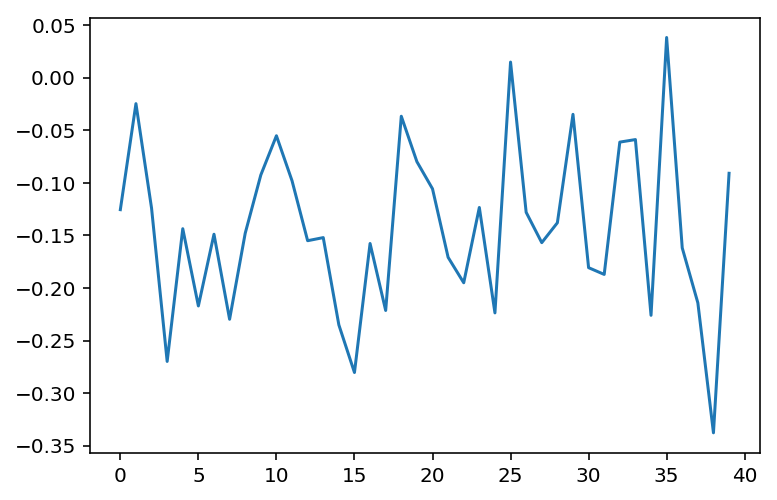

In [263]:
plot(w0.mean(-1)+0*b[0])

In [264]:
b

array([-0.06954831,  0.06954841], dtype=float32)

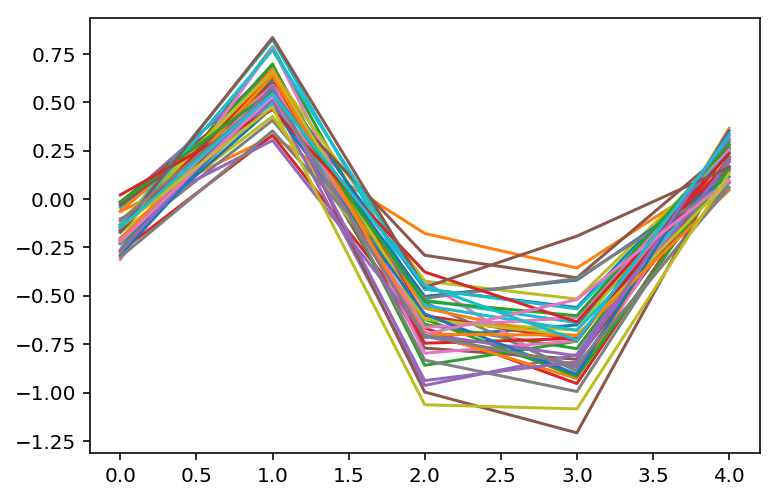

In [265]:
for i in range(n_nodes):
    plot(w[i*units_final:(i+1)*units_final,0])
    
# plot(w0.mean(-1)+0*b[0], lw = 3)

In [269]:
wd, bd = gcn_model.model.layers[-1].get_weights()

Text(0.5, 0, 'dense layer units')

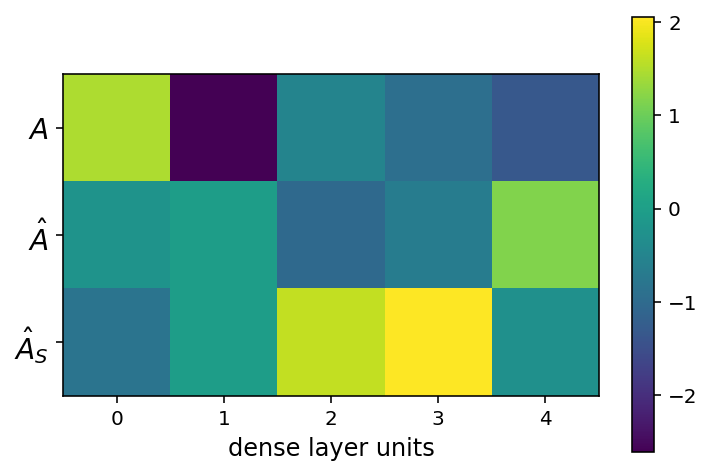

In [277]:
imshow(wd)
colorbar()
yticks(range(3), ['$A$', r'$\hat{A}$', r'$\hat{A}_S$'], fontsize = 14)
xlabel('dense layer units', fontsize = 12)

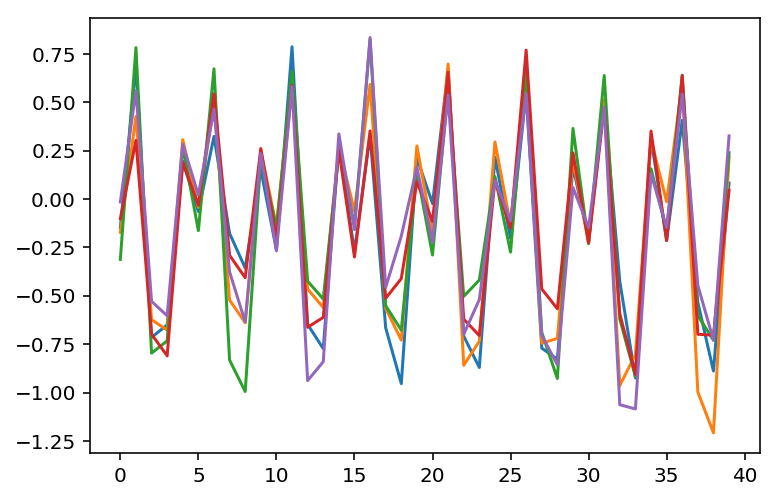

In [266]:
for i in range(units_final):
    plot(w[i*n_nodes:(i+1)*n_nodes,0])
    
# plot(w0.mean(-1)+0*b[0], lw = 3)

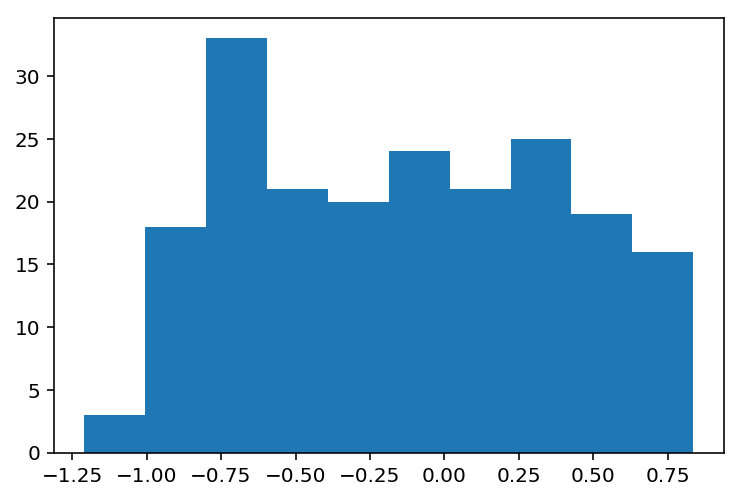

In [267]:
hist(w[:,0]);

In [278]:

params = {'layers': 1, 'units': 1, 'bias': True, 'activation': 'linear'}
    
units = [params['units']] * params['layers']
units_final = 2
Adjacencies = Adj_nodes_shuffled

labels = array(params_all)[:,0]

indices = idx

# import GraphConvNet as gcn
gcn_model = gcn.MultiGCN(input_shape= moments[1][0].shape, units = units, 
                         output_shape= (Adjacencies.shape[1], units_final ) , # fix bug to allow units for final
                         activation = params['activation'], skip = True, 
                         final_kwargs= {'activation': 'relu'}, 
                     dense_kws={'use_bias':params['bias']},
                       GCN_kws={'use_bias':params['bias']},
                        )
    

gcn_model.model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_9 (Graph_Opera [(None, 40, 40), (No 0           input_17[0][0]                   
__________________________________________________________________________________________________
input_18 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 1)        2           graph__operators_9[0][0]         
                                                                 input_18[0][0]                   
__________

## Classification model

In [279]:
den = gcn.Dense(2, activation='softmax')
d1 = den( gcn.layers.Flatten()( gcn_model.model.output ) )
model = gcn.Model(inputs = gcn_model.model.inputs, outputs = [d1] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_9 (Graph_Opera [(None, 40, 40), (No 0           input_17[0][0]                   
__________________________________________________________________________________________________
input_18 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 1)        2           graph__operators_9[0][0]         
                                                                 input_18[0][0]                   
__________

In [280]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2 )

3200/3200 [==============================] - 0s 127us/step - loss: 0.0365 - acc: 0.9903 - val_loss: 0.0389 - val_acc: 0.9875
Epoch 65/100
3200/3200 [==============================] - 0s 135us/step - loss: 0.0359 - acc: 0.9909 - val_loss: 0.0383 - val_acc: 0.9875
Epoch 66/100
3200/3200 [==============================] - 0s 140us/step - loss: 0.0354 - acc: 0.9906 - val_loss: 0.0374 - val_acc: 0.9862
Epoch 67/100
3200/3200 [==============================] - 0s 98us/step - loss: 0.0354 - acc: 0.9906 - val_loss: 0.0373 - val_acc: 0.9862
Epoch 68/100
3200/3200 [==============================] - 0s 88us/step - loss: 0.0346 - acc: 0.9897 - val_loss: 0.0406 - val_acc: 0.9875
Epoch 69/100
3200/3200 [==============================] - 0s 87us/step - loss: 0.0341 - acc: 0.9909 - val_loss: 0.0421 - val_acc: 0.9875
Epoch 70/100
3200/3200 [==============================] - 0s 85us/step - loss: 0.0346 - acc: 0.9919 - val_loss: 0.0361 - val_acc: 0.9875
Epoch 71/100
3200/3200 [===========================

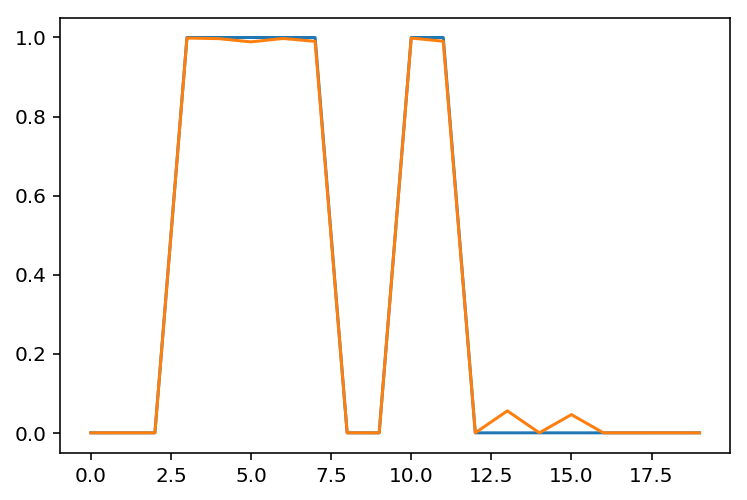

In [281]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

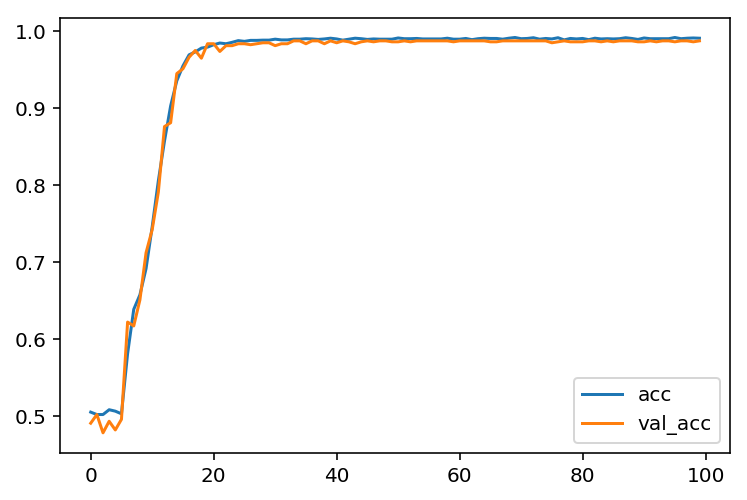

In [282]:
for k in ['acc', 'val_acc']:
    plot(history.history[k], label = k)
    
legend()

In [296]:
w,b = model.layers[-1].get_weights()

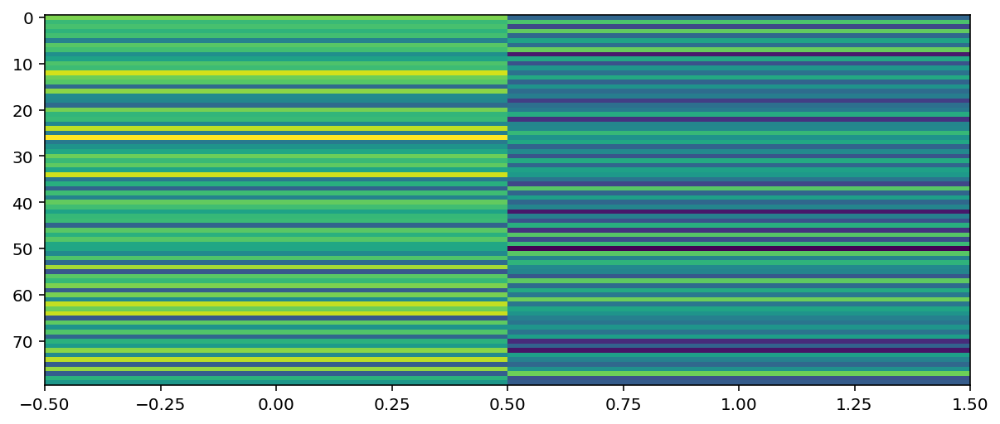

In [297]:
figure(figsize = (10,10))
imshow(w, aspect = 0.01)

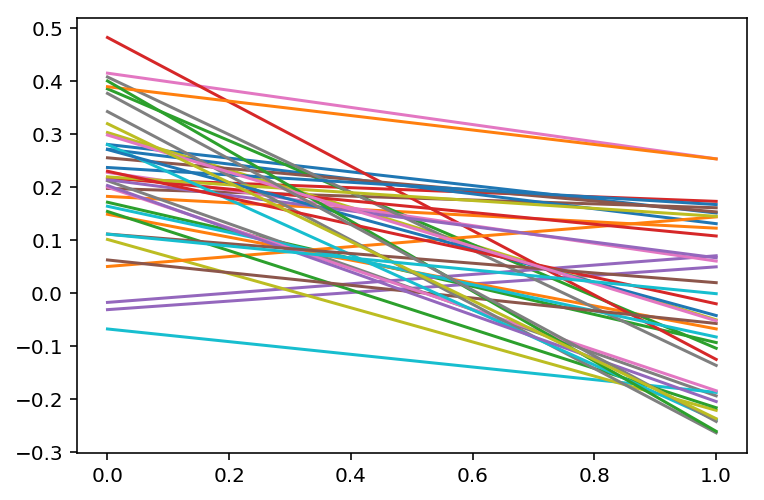

In [298]:
for i in range(n_nodes):
    plot(w[i*units_final:(i+1)*units_final,0])
    
# plot(w0.mean(-1)+0*b[0], lw = 3)

In [290]:
wd, bd = gcn_model.model.layers[-1].get_weights()

Text(0.5, 0, 'dense layer units')

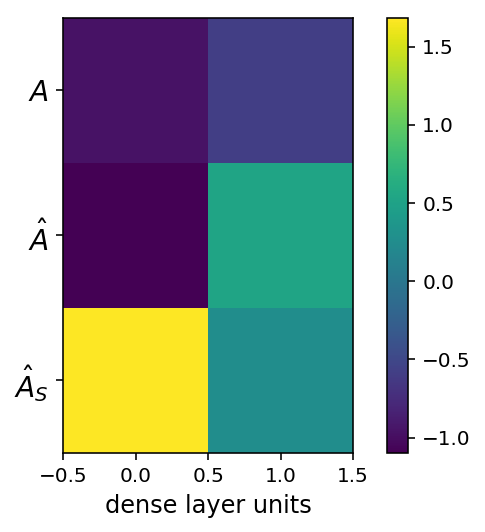

In [291]:
imshow(wd)
colorbar()
yticks(range(3), ['$A$', r'$\hat{A}$', r'$\hat{A}_S$'], fontsize = 14)
xlabel('dense layer units', fontsize = 12)

In [292]:
w0, b0 = gcn_model.model.layers[-2].get_weights()

Text(0.5, 0, 'dense layer units')

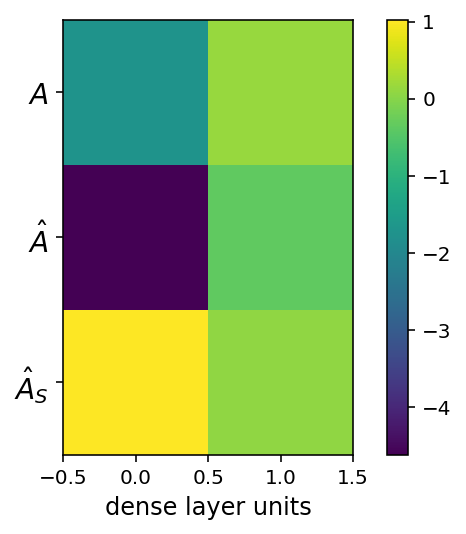

In [295]:
imshow(w0.dot(wd))
colorbar()
yticks(range(3), ['$A$', r'$\hat{A}$', r'$\hat{A}_S$'], fontsize = 14)
xlabel('dense layer units', fontsize = 12)

## Restrict the modules to see if only $A$ does the job

In [301]:
A,H = gcn.Input(shape = Adj_nodes_shuffled[0].shape), gcn.Input(h[0].shape)


In [307]:
g_lay = gcn.GCN(units= 3, activation = 'linear')

In [308]:
d1 = g_lay([A,H])
den = gcn.Dense(2, activation='softmax')

In [309]:
d2 = den( gcn.layers.Flatten()( d1 ) )
model = gcn.Model(inputs = [A,H], outputs = [d2] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_21 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
input_22 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
gcn_3 (GCN)                     (None, 40, 3)        6           input_21[0][0]                   
                                                                 input_22[0][0]                   
__________________________________________________________________________________________________
flatten_15 (Flatten)            (None, 120)          0           gcn_3[0][0]                      
__________

## Classification model

In [ ]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2 )

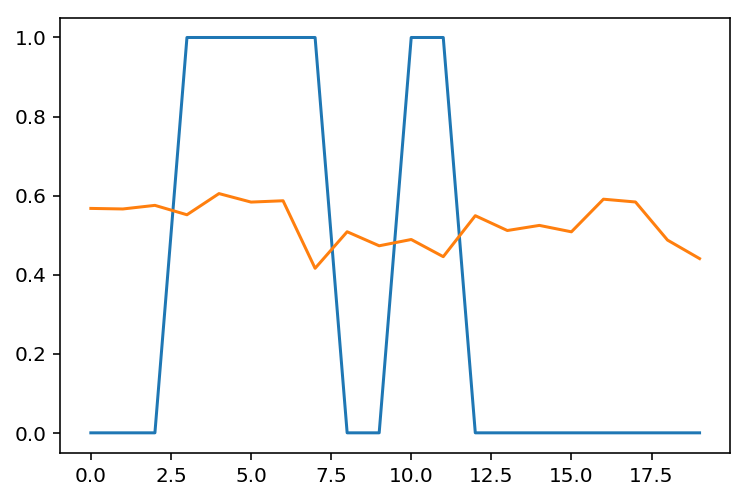

In [311]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

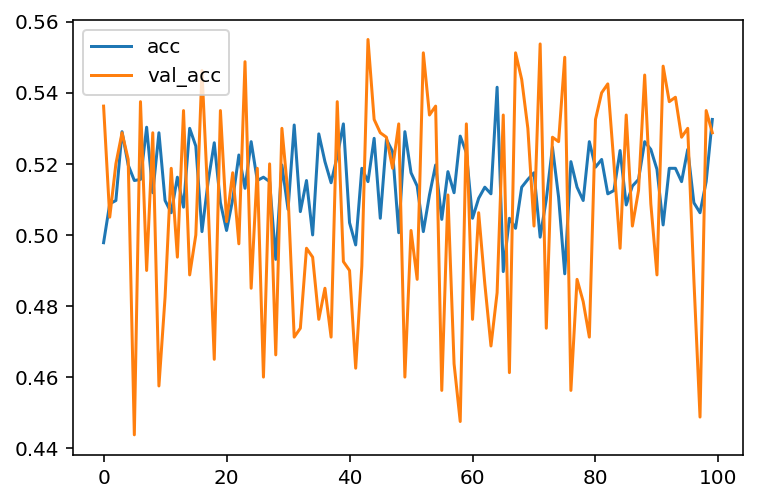

In [312]:
for k in ['acc', 'val_acc']:
    plot(history.history[k], label = k)
    
legend()

# DAD only

In [329]:
A,H = gcn.Input(shape = Adj_nodes_shuffled[0].shape), gcn.Input(h[0].shape)
go = gcn.Graph_Operators()(A)

g_lay = gcn.GCN(units= 3, activation = 'linear')

# using A and DAD only
d1 = gcn.GCN_List([go[-1]], inputs=[A,H], units = 1)[0]
# c1 = gcn.Concatenate()(d1)


In [330]:
den = gcn.Dense(2, activation='softmax')
d2 = den( gcn.layers.Flatten()( d1 ) )
model = gcn.Model(inputs = [A,H], outputs = [d2] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_14 (Graph_Oper [(None, 40, 40), (No 0           input_29[0][0]                   
__________________________________________________________________________________________________
gcn_11 (GCN)                    (None, 40, 1)        41          graph__operators_14[0][2]        
                                                                 input_29[0][0]                   
__________________________________________________________________________________________________
flatten_18 (Flatten)            (None, 40)           0           gcn_11[0][0]                     
__________

## Classification model

In [331]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 150, validation_split=0.2 )

3200/3200 [==============================] - 0s 60us/step - loss: 0.4895 - acc: 0.7919 - val_loss: 0.5249 - val_acc: 0.7688


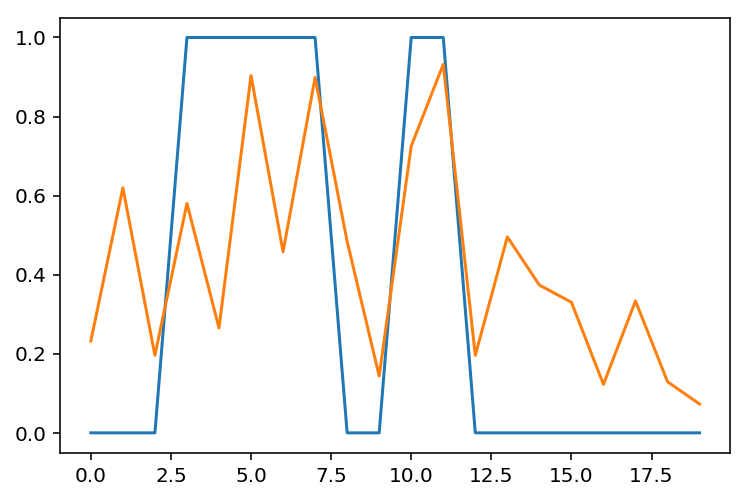

In [332]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

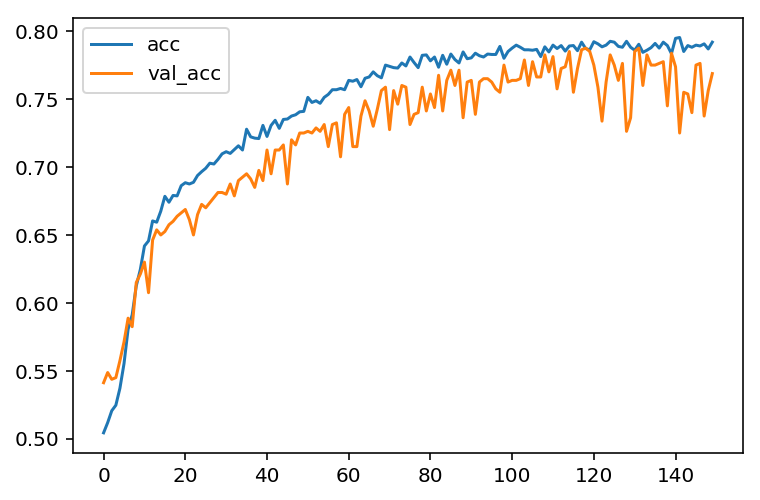

In [333]:
for k in ['acc', 'val_acc']:
    plot(history.history[k], label = k)
    
legend()

# A, DAD

In [307]:
A,H = gcn.Input(shape = Adj_nodes_shuffled[0].shape), gcn.Input(h[0].shape)
go = gcn.Graph_Operators()(A)

g_lay = gcn.GCN(units= 3, activation = 'linear')

# using A and DAD only
d1 = gcn.GCN_List([go[0], go[-1]], inputs=[A,H], units = 1)
c1 = gcn.Concatenate()(d1)


In [319]:
den = gcn.Dense(2, activation='softmax')
d2 = den( gcn.layers.Flatten()( c1 ) )
model = gcn.Model(inputs = [A,H], outputs = [d2] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_11 (Graph_Oper [(None, 40, 40), (No 0           input_23[0][0]                   
__________________________________________________________________________________________________
input_24 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
gcn_4 (GCN)                     (None, 40, 1)        41          graph__operators_11[0][0]        
                                                                 input_23[0][0]                   
__________

## Classification model

In [320]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2 )

Epoch 72/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2458 - acc: 0.9103 - val_loss: 0.2880 - val_acc: 0.8938
Epoch 73/100
3200/3200 [==============================] - 0s 67us/step - loss: 0.2505 - acc: 0.9081 - val_loss: 0.2944 - val_acc: 0.8925
Epoch 74/100
3200/3200 [==============================] - 0s 71us/step - loss: 0.2509 - acc: 0.9081 - val_loss: 0.2866 - val_acc: 0.8888
Epoch 75/100
3200/3200 [==============================] - 0s 67us/step - loss: 0.2425 - acc: 0.9150 - val_loss: 0.2867 - val_acc: 0.8900
Epoch 76/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2417 - acc: 0.9091 - val_loss: 0.2869 - val_acc: 0.8838
Epoch 77/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2449 - acc: 0.9094 - val_loss: 0.2919 - val_acc: 0.8762
Epoch 78/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2399 - acc: 0.9122 - val_loss: 0.2994 - val_acc: 0.8938
Epoch 79/100
3200/3200 [=================

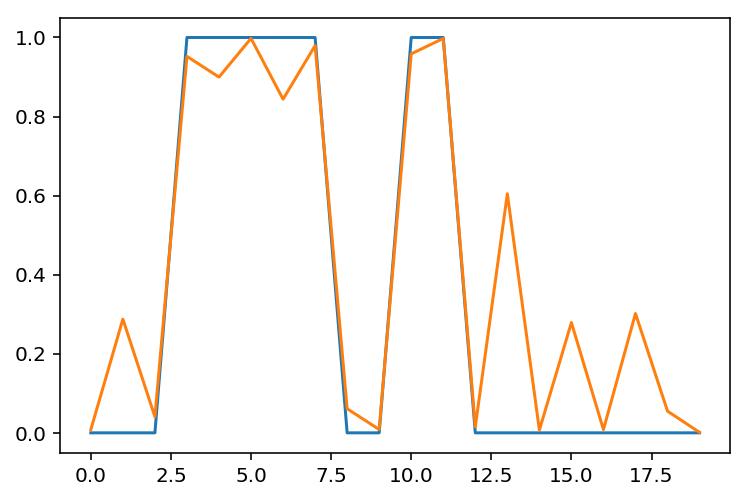

In [321]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

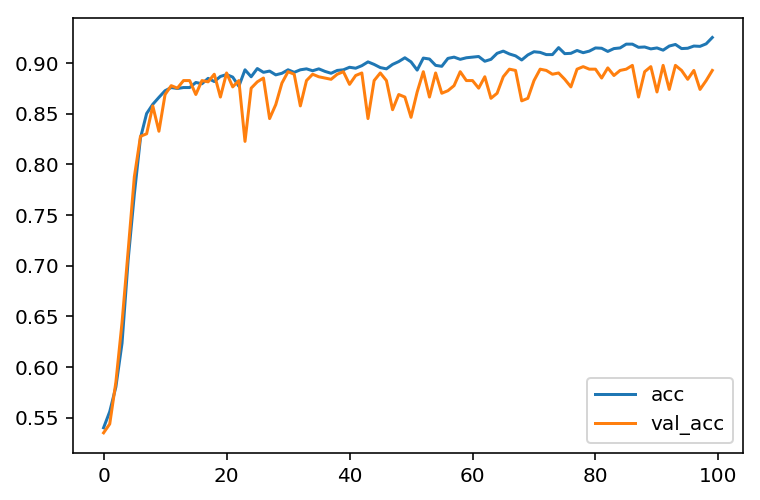

In [322]:
for k in ['acc', 'val_acc']:
    plot(history.history[k], label = k)
    
legend()

In [296]:
w,b = model.layers[-1].get_weights()

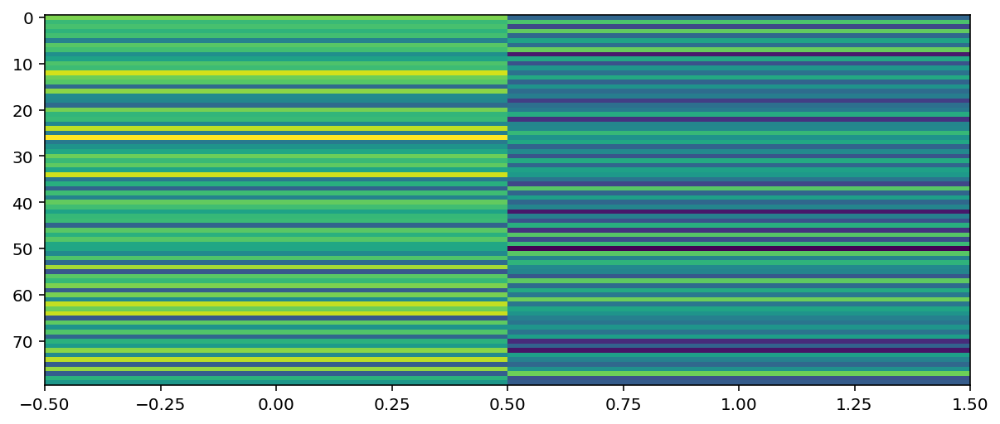

In [297]:
figure(figsize = (10,10))
imshow(w, aspect = 0.01)

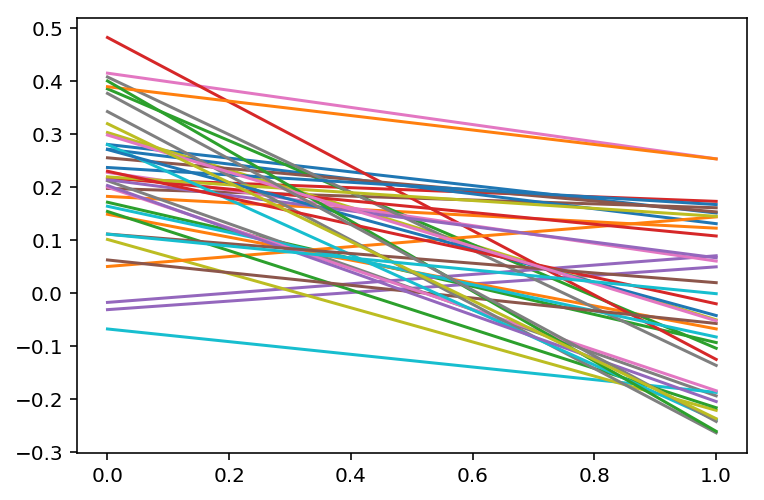

In [298]:
for i in range(n_nodes):
    plot(w[i*units_final:(i+1)*units_final,0])
    
# plot(w0.mean(-1)+0*b[0], lw = 3)

In [290]:
wd, bd = gcn_model.model.layers[-1].get_weights()

Text(0.5, 0, 'dense layer units')

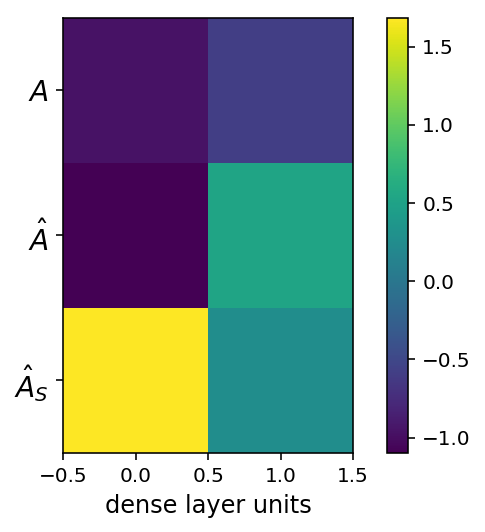

In [291]:
imshow(wd)
colorbar()
yticks(range(3), ['$A$', r'$\hat{A}$', r'$\hat{A}_S$'], fontsize = 14)
xlabel('dense layer units', fontsize = 12)

In [292]:
w0, b0 = gcn_model.model.layers[-2].get_weights()

Text(0.5, 0, 'dense layer units')

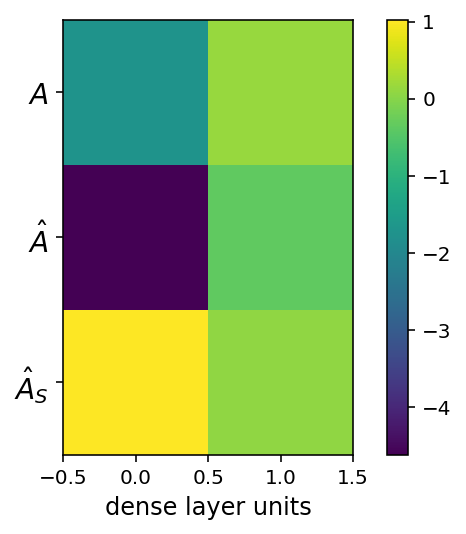

In [295]:
imshow(w0.dot(wd))
colorbar()
yticks(range(3), ['$A$', r'$\hat{A}$', r'$\hat{A}_S$'], fontsize = 14)
xlabel('dense layer units', fontsize = 12)

In [240]:
w.shape

(20, 2)

In [241]:
w0 = w[:,0].reshape((n_nodes,units_final))

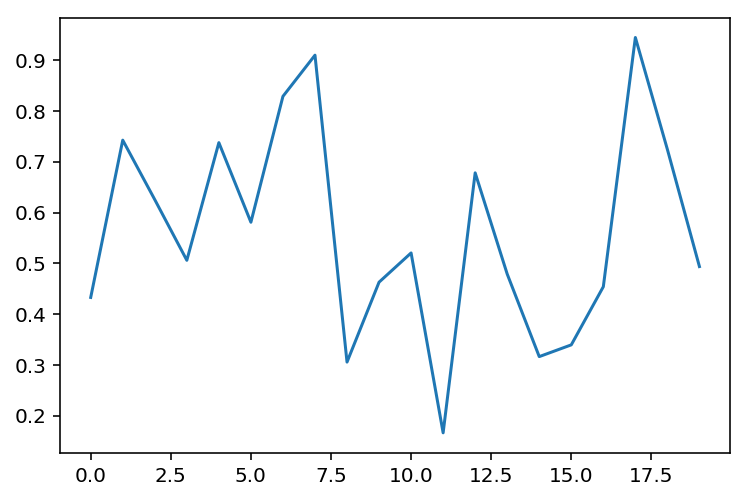

In [242]:
plot(w0.mean(-1)+0*b[0])

In [218]:
b

array([-3.707543 ,  3.7075443], dtype=float32)

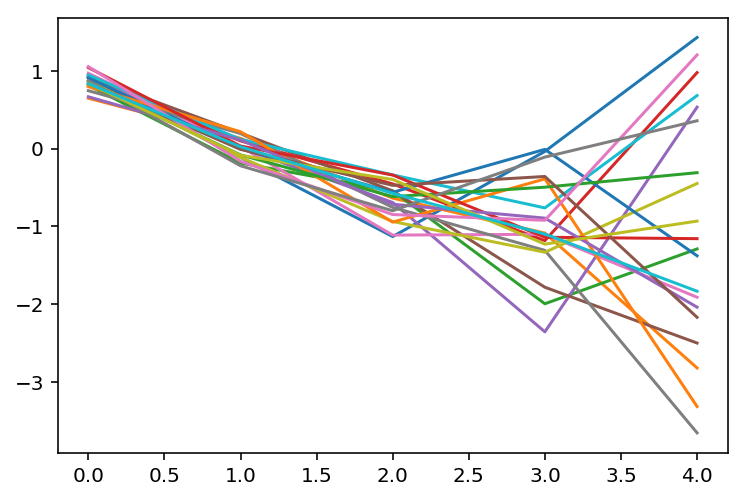

In [231]:
for i in range(n_nodes):
    plot(w[i*units_final:(i+1)*units_final,0])
    
# plot(w0.mean(-1)+0*b[0], lw = 3)

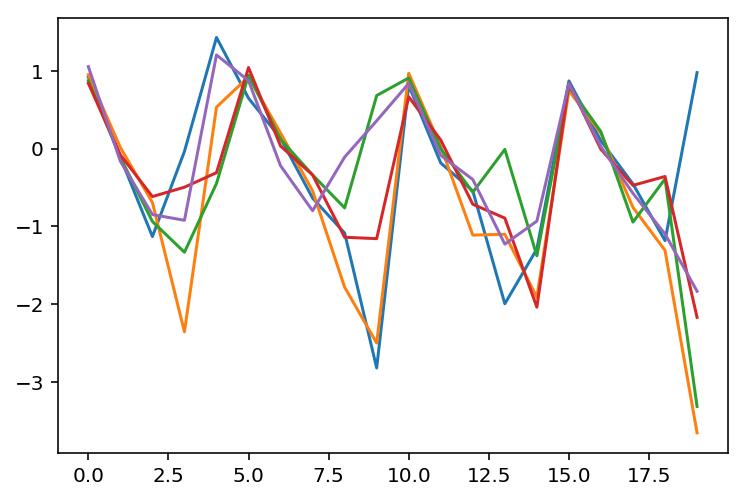

In [230]:
for i in range(units_final):
    plot(w[i*n_nodes:(i+1)*n_nodes,0])
    
# plot(w0.mean(-1)+0*b[0], lw = 3)

# Node-based version (O(1) parameters, no fully connected layer)

In [384]:

params = {'layers': 1, 'units': 1, 'bias': True, 'activation': 'linear'}
    
units = [params['units']] * params['layers']
units_final = 2
Adjacencies = Adj_nodes_shuffled

labels = array(params_all)[:,0]

indices = idx

# import GraphConvNet as gcn
gcn_model = gcn.MultiGCN(input_shape= moments[1][0].shape, units = units, 
                         output_shape= (Adjacencies.shape[1], units_final ) , # fix bug to allow units for final
                         activation = params['activation'], skip = True, 
                         final_kwargs= {'activation': 'softmax'}, 
                     dense_kws={'use_bias':params['bias']},
                       GCN_kws={'use_bias':params['bias']},
                        )
    

gcn_model.model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_31 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_15 (Graph_Oper [(None, 40, 40), (No 0           input_31[0][0]                   
__________________________________________________________________________________________________
input_32 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
A_0 (GCN)                       (None, 40, 1)        2           graph__operators_15[0][0]        
                                                                 input_32[0][0]                   
__________

In [386]:
gcn_model.model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

How can we combine or average over the first output of the previous dense layer? What do we do with the number of channels? 
Do we even want to keep all of those outputs? 
maybe if the last layer is only summing over all output it's enough? But then how do we get two different classes as output? 
We want a 2 dim output from the net. 
If the final Dense layer in GCN module was ones and also added over all the outputs, Maybe it would work?
But how do we make it such that two outputs come out? 
We can do the dense layer after GCN, but we then want to sum that over the __node indices__ and then 
No, let's skip the last layer and directly pass the output of the gcn modules to a dense layer with ones.

In [388]:
a1 = gcn.layers.Dense( gcn_model.model.output)
a1

ValueError: A merge layer should be called on a list of inputs.

In [319]:
den = gcn.Dense(2, activation='softmax')
d2 = den( gcn.layers.Flatten()( c1 ) )
model = gcn.Model(inputs = [A,H], outputs = [d2] )
model.compile(optimizer='adam', loss ='categorical_crossentropy' ,metrics=['accuracy'])

model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           (None, 40, 40)       0                                            
__________________________________________________________________________________________________
graph__operators_11 (Graph_Oper [(None, 40, 40), (No 0           input_23[0][0]                   
__________________________________________________________________________________________________
input_24 (InputLayer)           (None, 40, 1)        0                                            
__________________________________________________________________________________________________
gcn_4 (GCN)                     (None, 40, 1)        41          graph__operators_11[0][0]        
                                                                 input_23[0][0]                   
__________

## Classification model

In [320]:
history = model.fit([Adjacencies[indices], h[indices]], to_categorical(labels[indices]), epochs= 100, validation_split=0.2 )

Epoch 72/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2458 - acc: 0.9103 - val_loss: 0.2880 - val_acc: 0.8938
Epoch 73/100
3200/3200 [==============================] - 0s 67us/step - loss: 0.2505 - acc: 0.9081 - val_loss: 0.2944 - val_acc: 0.8925
Epoch 74/100
3200/3200 [==============================] - 0s 71us/step - loss: 0.2509 - acc: 0.9081 - val_loss: 0.2866 - val_acc: 0.8888
Epoch 75/100
3200/3200 [==============================] - 0s 67us/step - loss: 0.2425 - acc: 0.9150 - val_loss: 0.2867 - val_acc: 0.8900
Epoch 76/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2417 - acc: 0.9091 - val_loss: 0.2869 - val_acc: 0.8838
Epoch 77/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2449 - acc: 0.9094 - val_loss: 0.2919 - val_acc: 0.8762
Epoch 78/100
3200/3200 [==============================] - 0s 66us/step - loss: 0.2399 - acc: 0.9122 - val_loss: 0.2994 - val_acc: 0.8938
Epoch 79/100
3200/3200 [=================

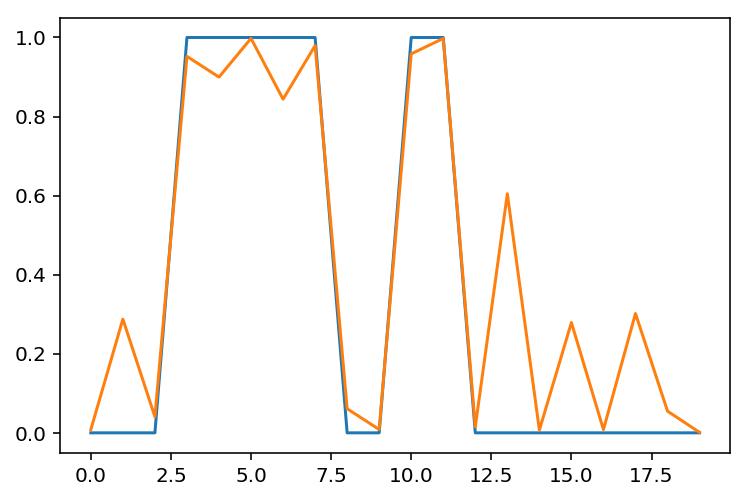

In [321]:
i = 20
p = model.predict([Adjacencies[indices[-i:]], h[-i:]])
plot(labels[indices[-i:]])
plot(p[:,1])

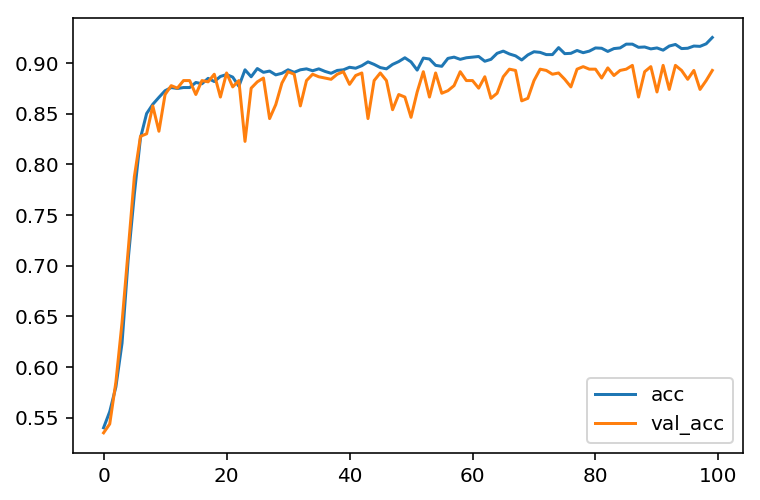

In [322]:
for k in ['acc', 'val_acc']:
    plot(history.history[k], label = k)
    
legend()

In [296]:
w,b = model.layers[-1].get_weights()

# Randomizing links (configuration model)

To test the ability of the GCN to distinguish between different network architectures we should scramble the same network and see if it is able to pick up graph properties related to how the links are connected, rather than the number of links

In [340]:
a = Adj_all[0]
b = nx.configuration_model(int0(a.sum(0)))

In [347]:
n = len(a)
ad = zeros((n,n), dtype=np.float32)
for i in b.edges:
    ad[i[:2]] = 1
    ad[i[:2][::-1]] = 1

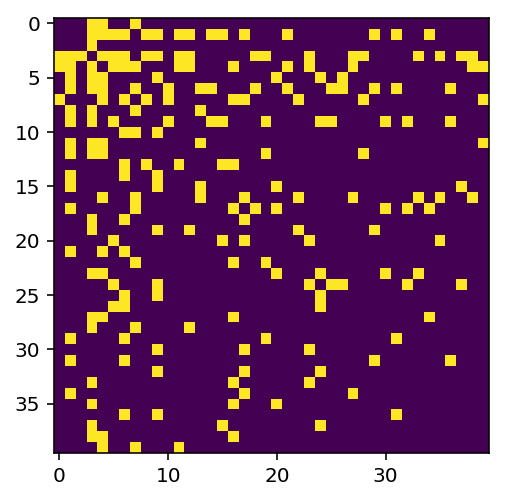

In [348]:
imshow(a)

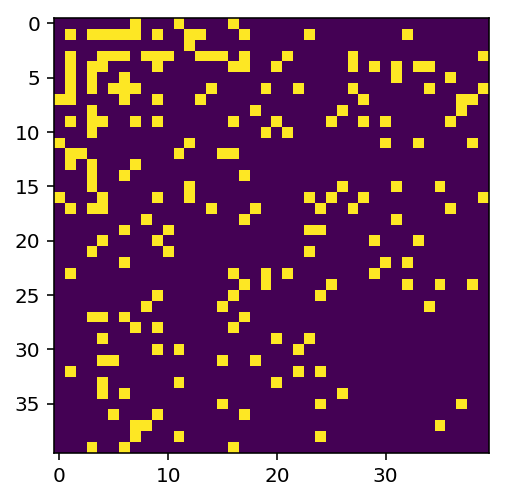

In [349]:
imshow(ad)

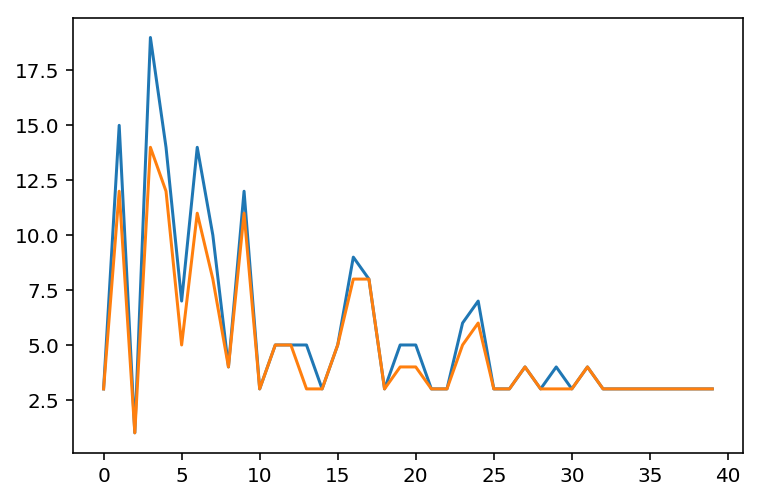

In [350]:
plot(a.sum(0))
plot(ad.sum(0))

In [351]:
ad.sum(), a.sum()

(196.0, 222.0)

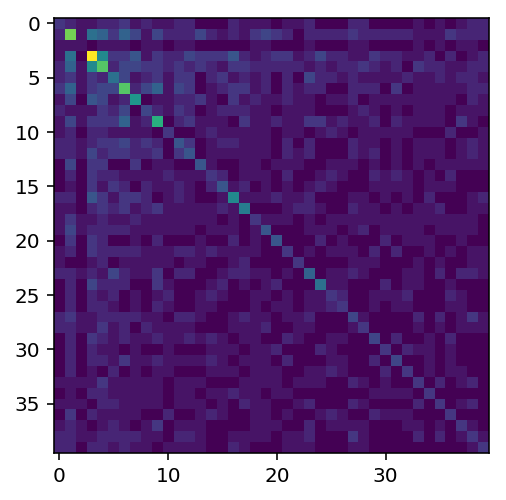

In [353]:
imshow(a.dot(a))

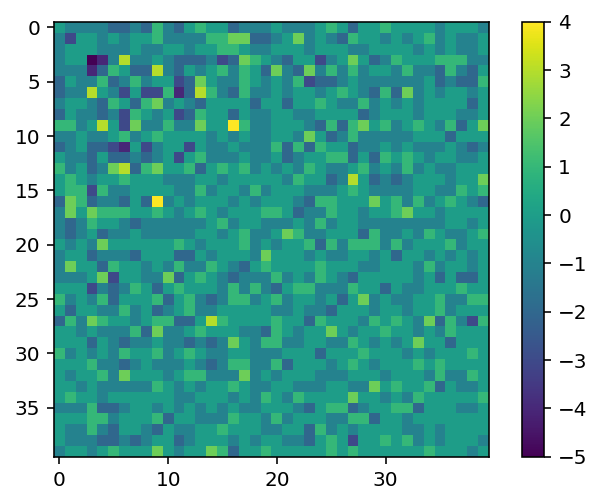

In [356]:
imshow(ad.dot(ad)-a.dot(a))
colorbar()

Text(0, 0.5, 'Config BA')

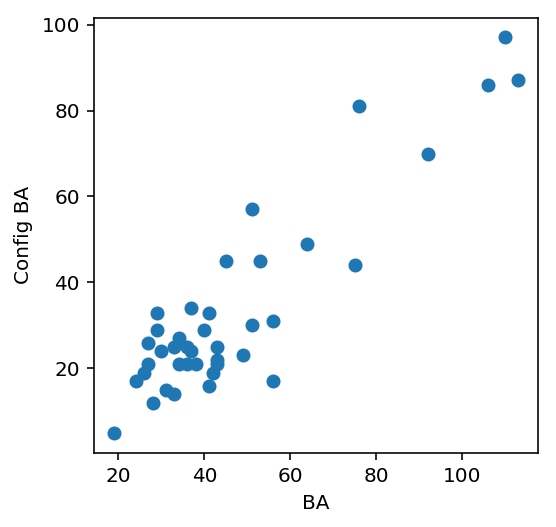

In [362]:
subplot(aspect = 1)
plot(a.dot(a).sum(0),ad.dot(ad).sum(0), 'o')
xlabel('BA')
ylabel('Config BA')

Text(0, 0.5, 'Config BA')

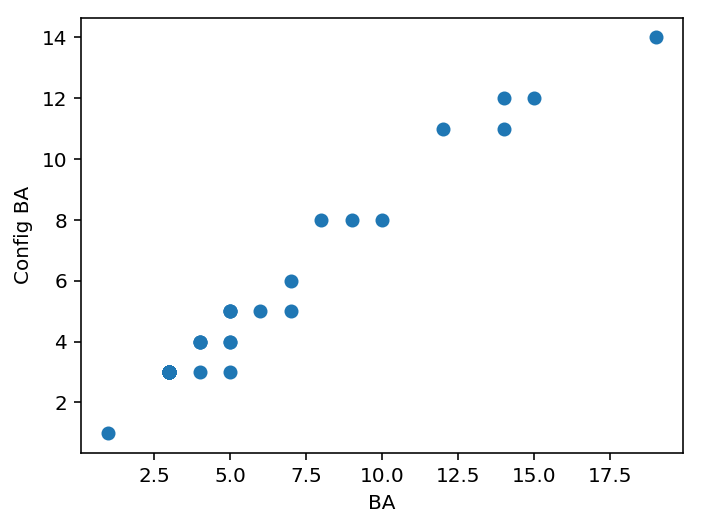

In [363]:
subplot(aspect = 1)
plot(a.sum(0),ad.sum(0), 'o')
xlabel('BA')
ylabel('Config BA')

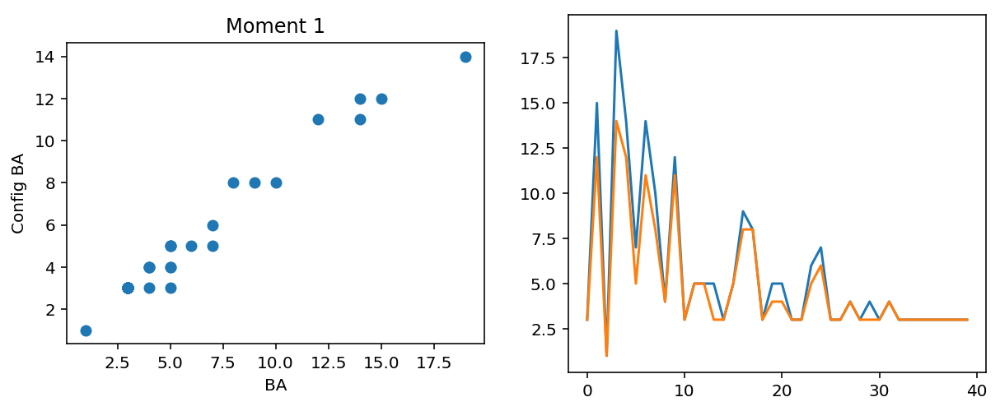

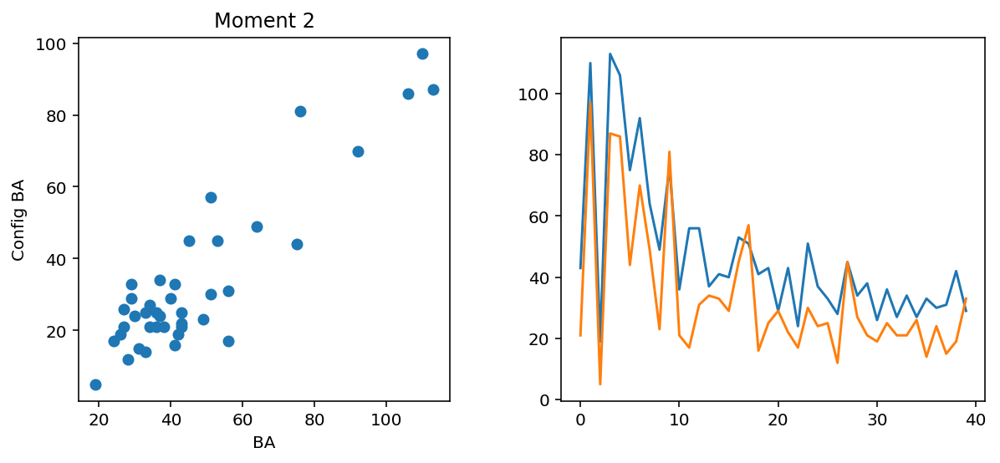

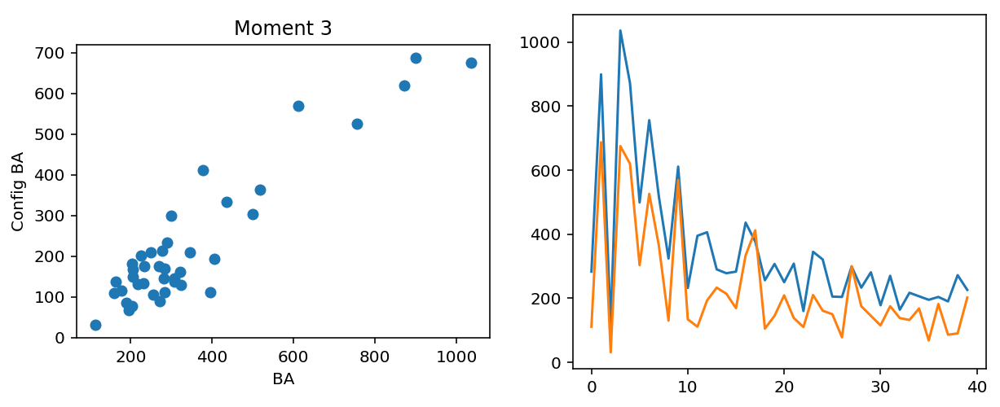

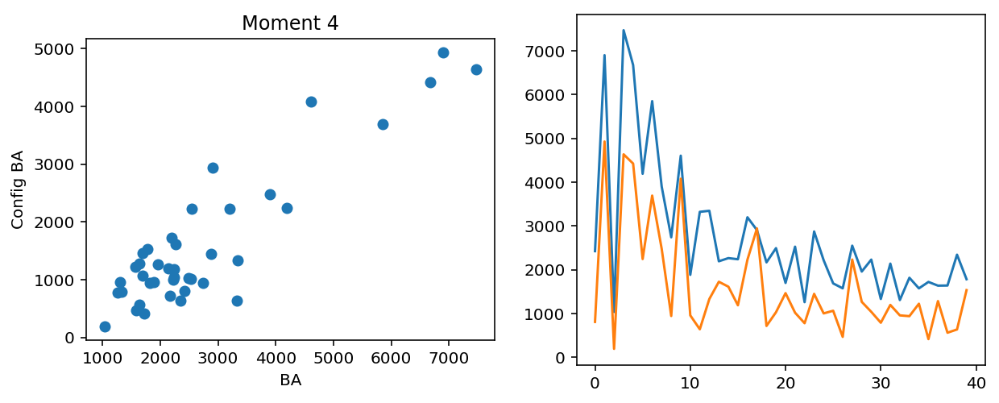

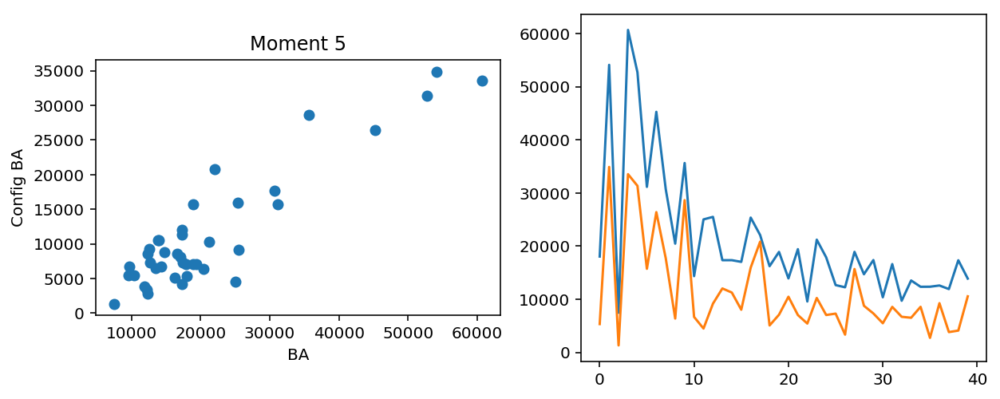

In [366]:
for i in range(1,6):
    figure(figsize=(10,4))
    subplot(121, aspect = 1)
    plot(matrix_power(a,i).sum(0),matrix_power(ad,i).sum(0), 'o')
    title( 'Moment %d' %i)
    xlabel('BA')
    ylabel('Config BA')
    subplot(122)
    plot(matrix_power(a,i).sum(0),label='BA')
    plot(matrix_power(ad,i).sum(0), label='Config BA')
    
    show()
    

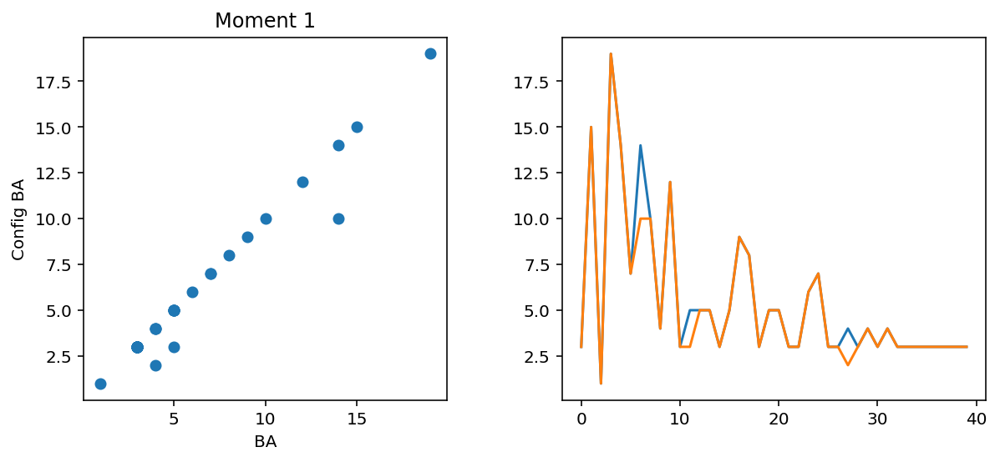

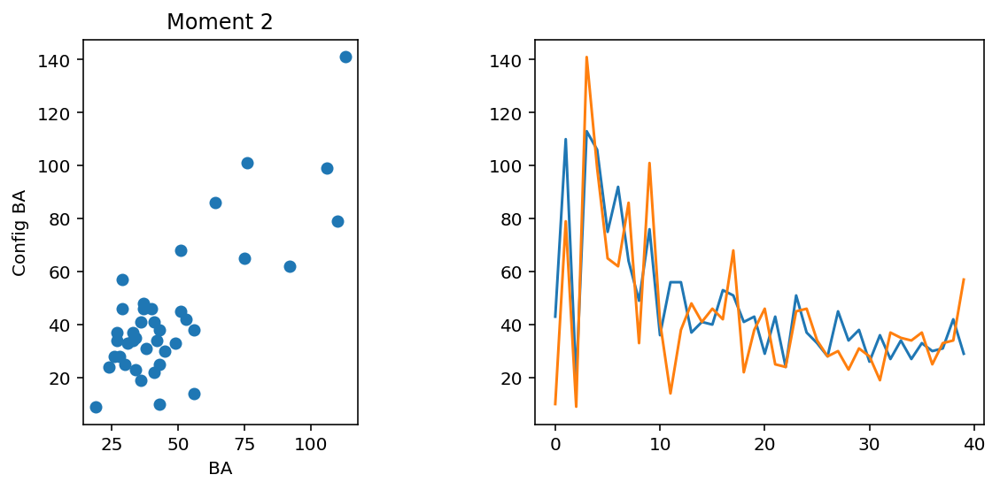

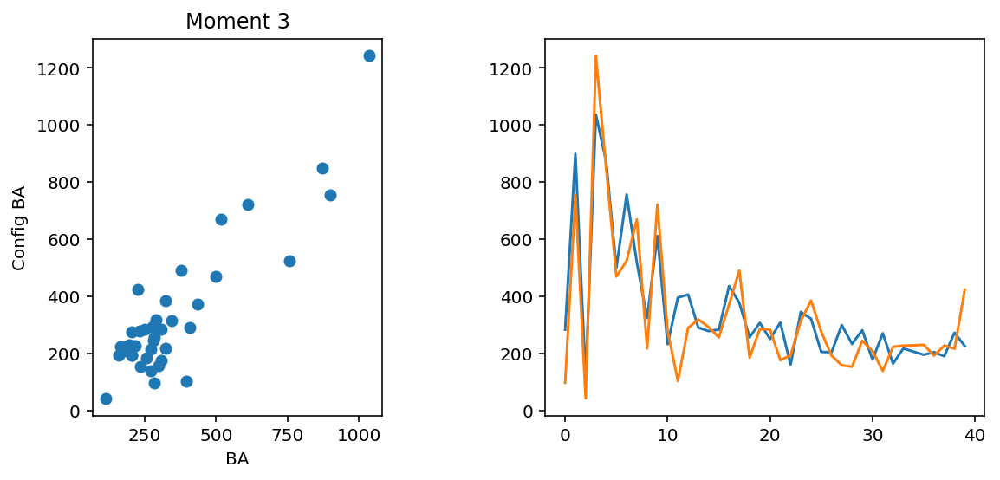

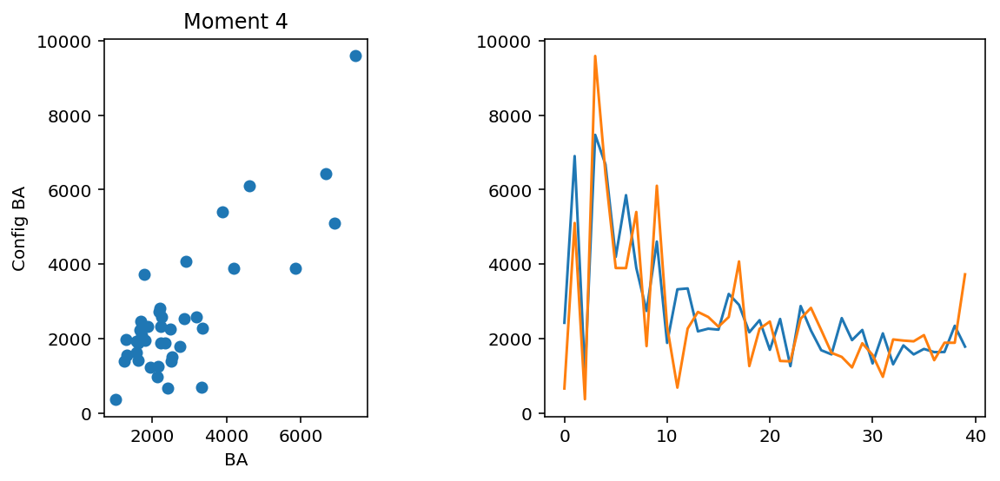

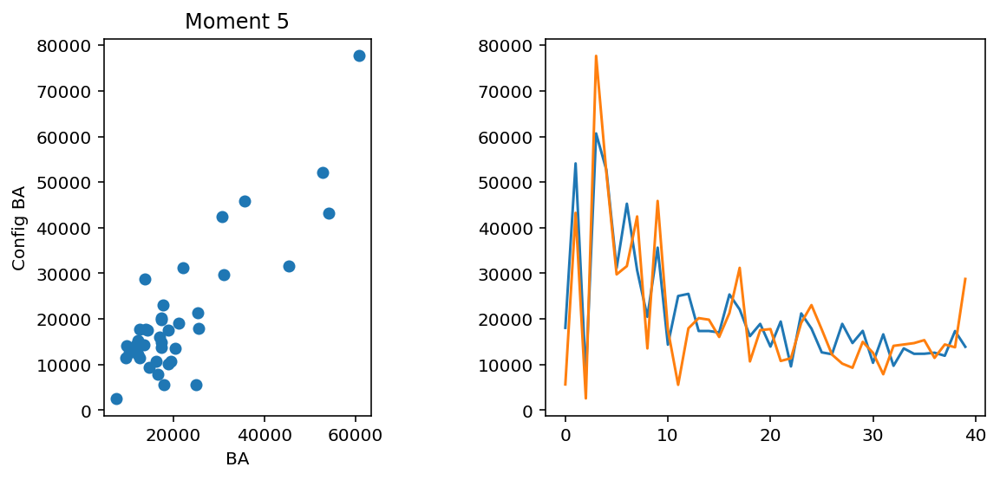

In [463]:
for i in range(1,6):
    figure(figsize=(10,4))
    subplot(121, aspect = 1)
    plot(matrix_power(a,i).sum(0),matrix_power(a2,i).sum(0), 'o')
    title( 'Moment %d' %i)
    xlabel('BA')
    ylabel('Config BA')
    subplot(122)
    plot(matrix_power(a,i).sum(0),label='BA')
    plot(matrix_power(a2,i).sum(0), label='Config BA')
    
    show()
    

In [468]:
ei = eigh(a)
ei2 = eigh(a2)

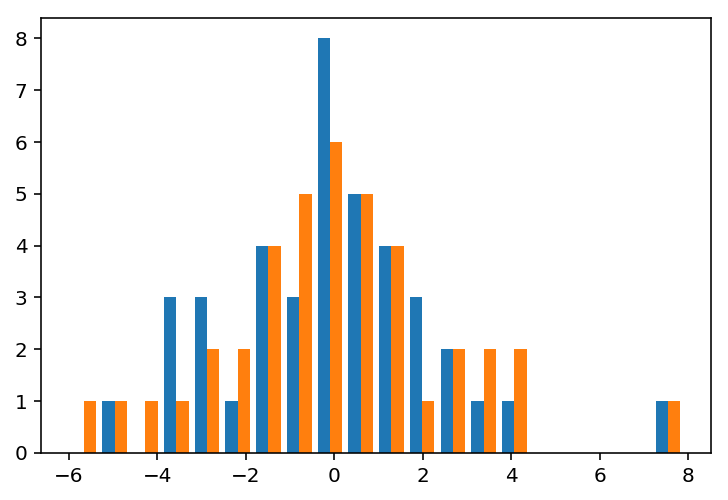

In [470]:
hist([ei[0],ei2[0]],20);
# hist(ei2[0],20);

In [ ]:
n = 40
make_BA_dataset()

In [368]:
# knock out links from BA to make config exactly the same
ix = where(a.sum(0)>ad.sum(0))[0]
len(ix)

14

In [370]:
a.sum()-ad.sum()

26.0

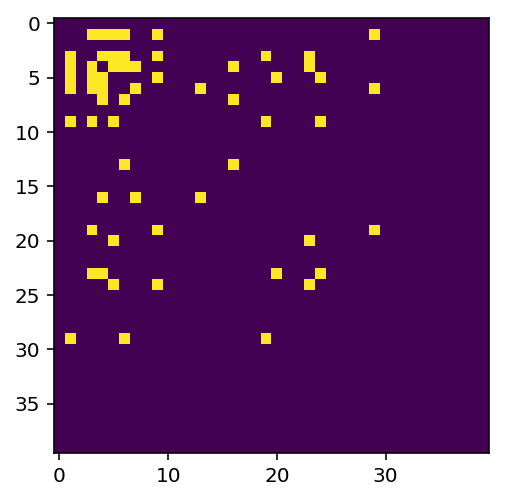

In [379]:
# mask
ms = 1.*(a.sum(0)>ad.sum(0))
mask= ms[newaxis]*ms[:,newaxis]
imshow(mask*a)

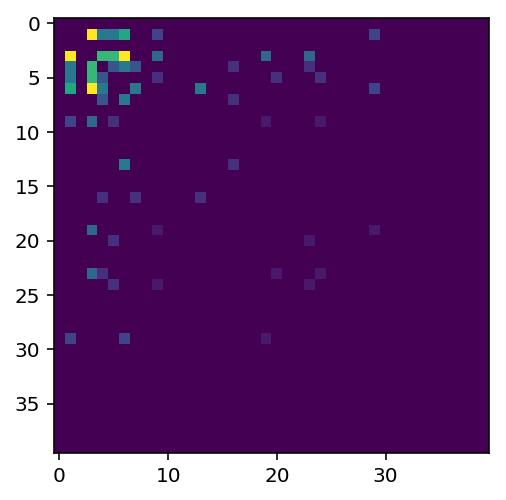

In [380]:
# mask
ms = (a.sum(0)-ad.sum(0))*(a.sum(0)>ad.sum(0))
mask= ms[newaxis]*ms[:,newaxis]
imshow(mask*a)

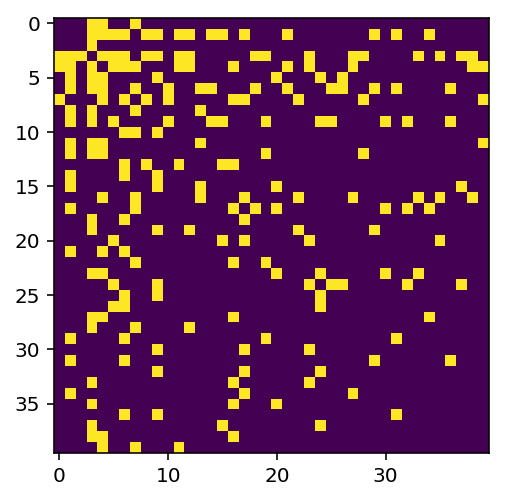

In [382]:
imshow(a)

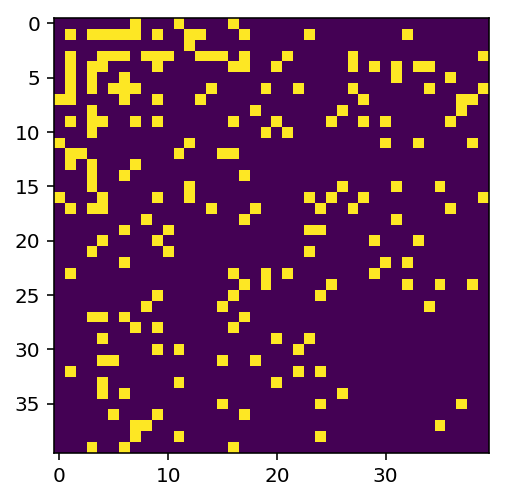

In [392]:
imshow(ad)

In [393]:
ad.sum(), ad.diagonal().sum()

(196.0, 4.0)

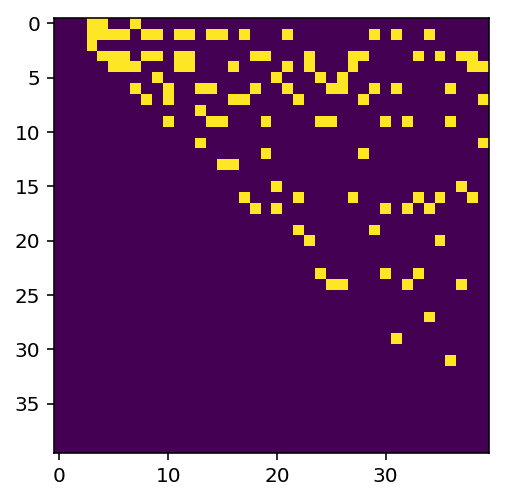

In [394]:
imshow(triu(a))

In [395]:
# Configuration model
# 1. build the incidence matrix 
a.sum()/2

111.0

In [19]:
ix = where(triu(a))

In [20]:
len(ix[0])

175

In [21]:
edg = array(list(zip(*ix)))

In [22]:
incid = np.zeros((len(a), len(edg)), dtype=np.float32)

for _,[i,j] in enumerate(edg): 
    incid[i,_] = 1
    incid[j,_] = -1

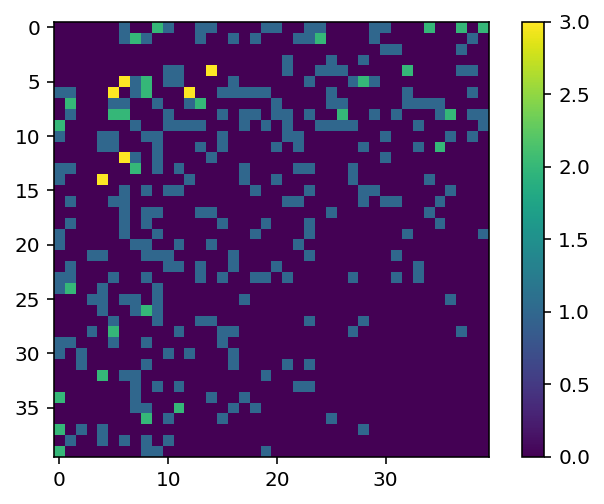

In [23]:
imshow(configuration_model_1(a))
colorbar()

In [24]:
incid = get_incidence(a)

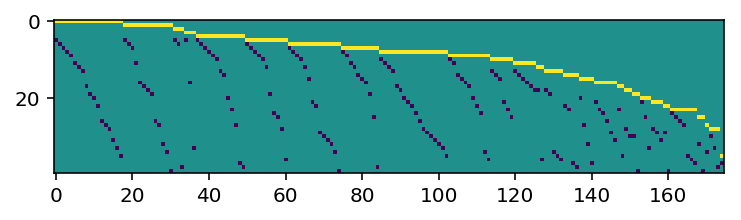

In [25]:
imshow(incid)

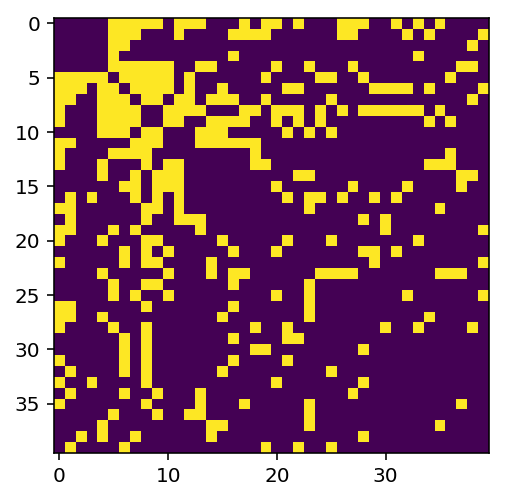

In [26]:
l = incid.dot(incid.T)
d = l.diagonal() 
imshow(diag(d)-l)

In [27]:
neg = where(incid < 0)
neg

(array([ 5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  8,  8,
         8,  8,  8,  9,  9,  9,  9,  9, 10, 10, 10, 10, 10, 11, 11, 11, 11,
        11, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 15,
        15, 15, 15, 15, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 18, 18, 18,
        18, 18, 19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21,
        22, 22, 22, 22, 22, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 25, 25,
        25, 25, 25, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27, 28, 28, 28, 28,
        28, 29, 29, 29, 29, 29, 30, 30, 30, 30, 30, 31, 31, 31, 31, 31, 32,
        32, 32, 32, 32, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 35, 35, 35,
        35, 35, 36, 36, 36, 36, 36, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38,
        39, 39, 39, 39, 39]),
 array([  0,  18,  31,  34,  37,   1,  19,  32,  38,  50,   2,  20,  39,
         51,  61,   3,  40,  52,  62,  75,   4,  41,  53,  63,  76,  42,
         54,  64,  85, 103,   5,  21,  77,  86, 104,   6,  55,  

In [28]:
# preserve the rows, to preserve node degree, but shuffle columns, to shuffle links
shuffle(neg[1])

In [29]:
neg

(array([ 5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  8,  8,
         8,  8,  8,  9,  9,  9,  9,  9, 10, 10, 10, 10, 10, 11, 11, 11, 11,
        11, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 15,
        15, 15, 15, 15, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 18, 18, 18,
        18, 18, 19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21,
        22, 22, 22, 22, 22, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 25, 25,
        25, 25, 25, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27, 28, 28, 28, 28,
        28, 29, 29, 29, 29, 29, 30, 30, 30, 30, 30, 31, 31, 31, 31, 31, 32,
        32, 32, 32, 32, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 35, 35, 35,
        35, 35, 36, 36, 36, 36, 36, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38,
        39, 39, 39, 39, 39]),
 array([140,  80,  48,  37,  66, 146, 104,  72,  52,   6, 155, 109,  92,
         20, 154, 112, 137, 125,  51,  50, 111,  29, 114, 100,  70, 147,
        174, 158,   7, 159,  44, 143, 138,  67, 115,  16, 169, 1

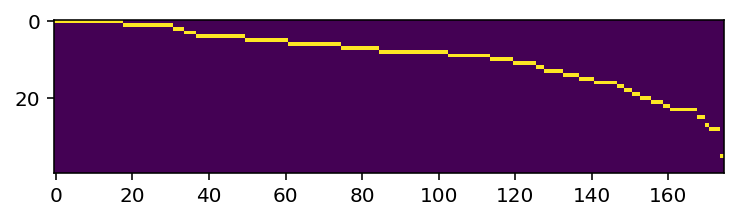

In [30]:
incid2 = 1.* (incid> 0 )
imshow(incid2)
incid2[neg] -= 1

In [31]:
incid2[neg] -= 1

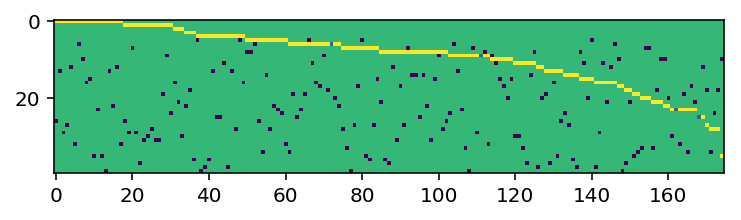

In [32]:
imshow(incid2)
# colorbar()

In [33]:
abs(incid2).sum(0)

array([3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 1., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 1., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 1., 3., 3., 3., 3., 3., 1., 3.,
       3., 3., 3., 3., 3.])

In [34]:
abs(incid).sum()/2

175.0

In [35]:
abs(incid2).sum()/2

258.5

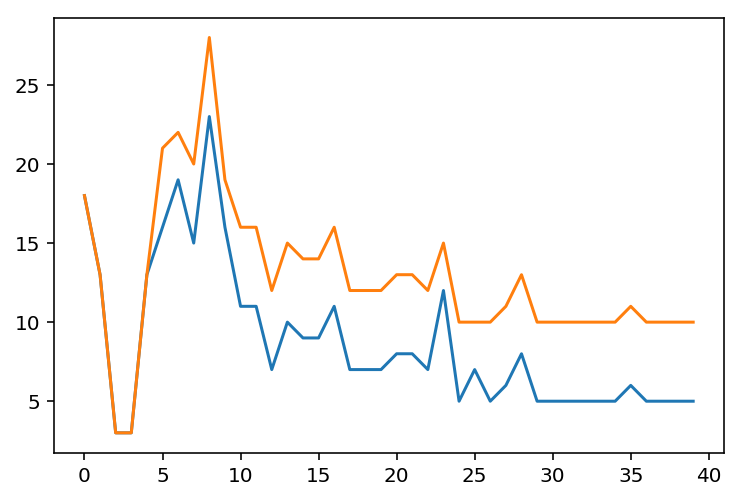

In [36]:
plot(abs(incid).sum(1), label='actual degrees')
plot(abs(incid2).sum(1), label='config degrees')

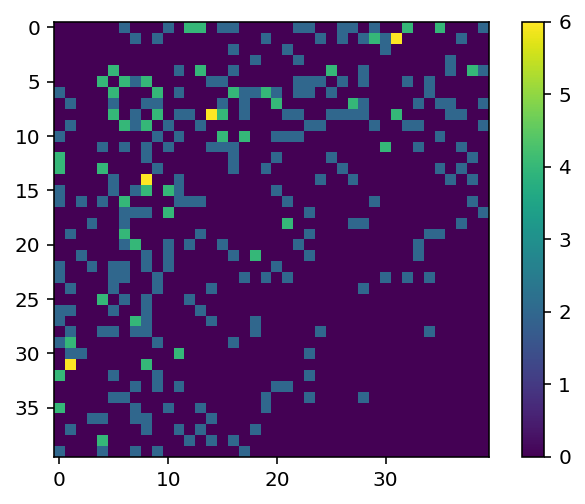

In [37]:
l2 = incid2.dot(incid2.T)
d2 = l2.diagonal() 
a2 = diag(d2)-l2
a3 = (1*(a2>0))

imshow(diag(d2)-l2)

colorbar()

In [38]:
a2 = diag(d2)-l2
a3 = (1*(a2>0))

In [39]:
a3.sum()

288